<< Thu Big Data Challenge 2019 >>

Author : Andy RK Chang & 陳宇修

Create Date : Jul 05, 2019

Modify Date : Jul 25, 2019

Version : 1.05.1

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as plts 
import math
import glob
import os.path
from operator import mod
from scipy import stats
%matplotlib inline

In [62]:
a = pd.read_csv('./raw_data/G11/G11-1-AC(7X15)20160706-004_Export.txt',sep = '\s+')

In [64]:
a.drop([0],inplace = True)

In [71]:
a = a.apply(pd.to_numeric)

In [77]:
a = a[a != 0]

In [79]:
a

,G11-PTC11,G11-PTC12,G11-PTC13,G11-PTC14,G11-PTC15
1,80.0,78.9,74.0,81.0,80.3
2,80.0,78.9,74.0,81.0,80.3
3,80.0,78.9,74.0,81.0,80.3
4,80.0,78.9,74.0,81.0,80.3
5,81.2,80.0,73.4,82.2,80.4
6,82.5,81.3,96.9,83.7,81.1
7,84.0,83.0,90.2,85.4,81.9
8,86.4,85.3,90.9,87.9,82.9
9,88.2,88.0,83.1,90.6,83.9
10,92.1,90.8,108.2,93.5,84.9


In [3]:
#a.drop([0],inplace = True)

In [4]:
#global variable definition and initial
myDriveFilePath = './raw_data/'
recipeGroup = ['G11','G15','G17','G19','G32','G34','G48','G49']
examFilePath = './exam_data/'

PTCcolor = ['purple','red','coral','saddlebrown','orange'
            ,'olive','limegreen','blue','cyan','yellow']
rgColumns = ['filename','groupid','eqpid','date','sno','PTCno','count','mean','std',
             'min','Q1','Q2','Q3','max','median', 'startT','endT']


## , 'start2max_time','stable_time','max2ned_time','totaltime'

#v1.08 add
dropColumns = ['filename','groupid','eqpid','PTCno','sno', 'date']

In [5]:
import re

In [6]:
re.search( r'(00\d{1,3})','G11-1-AC(7X15)20160126-002_Export',flags=re.IGNORECASE).group()

'002'

In [7]:
## Function Module

#get RecipeGroup File List function
def getRecipeGroupFileList(aRecipeGroup):
    aFileList = glob.glob(myDriveFilePath + aRecipeGroup + "/*.txt")
    return aFileList
#get exam file list function
def getExamFileList():
    aFileList = glob.glob(examFilePath + "*.txt")
    return aFileList
#get file attribute function
def getFileAttributeList(aFile, aTraining):
    
    aFileAttributeList = []
    
    #修改為正則表達式
    if aTraining == True :
        aFileAttributeList.append(aFile)
        aFileAttributeList.append(re.search( r'(G\d+)', aFile).group())
        aFileAttributeList.append(re.search( r'(AC\(\d+x\d+\))',
                                            aFile,flags=re.IGNORECASE).group())
        aFileAttributeList.append(re.search( r'(\d{7,8})', aFile).group())
        aFileAttributeList.append(re.search( r'(00\d{1,3})', aFile).group())
    else:
        aFileAttributeList.append(aFile)
        aFileAttributeList.append('Nan')
        aFileAttributeList.append('Nan')
        aFileAttributeList.append('Nan')
        aFileAttributeList.append('Nan')
        
    return aFileAttributeList

# read recipe Group file data function

def readRecipeGroupFile(aFileName):
    fp = pd.read_csv(aFileName,sep="\t")    # 這裡不能用 \s+ 會有錯誤,如:G15 -PTC4 中間多個空格
    fp = fp.drop([0])                       # drop defoF
    fp = fp.drop(columns=['Unnamed: ' + str(len(fp.columns)-1)])# drop nonname column
    fp = fp.apply(pd.to_numeric, errors='coerce')  # str to numeric
    return fp

def readExamFile(aFileName):
    fp = pd.read_csv(aFileName, sep = '\s+')
    fp = fp.drop([0])
    fp = fp.apply(pd.to_numeric, errors = 'coerce')
    
    return fp

#plot 成化曲線

def plotRecipeGroupFileCurve(aDf,aRG,aFN):
    
    #Draw Plot
    plt.figure(figsize = (10,8), dpi = 160)
    fig , ax = plt.subplots()
    
    ranges =  np.arange(len(aDf.columns))
    
    for i in ranges:
        aPTCno = aDf.columns[i].strip()
        aPTCno = aPTCno[aPTCno.find('PTC')+3: len(aPTCno)] #問題
        ax.plot(aDf.columns[i], data = aDf, color = PTCcolor[mod(int(aPTCno),10)],label=aDf.columns[i].strip())
        ax.axis([0,400,0,400])
        ax.set_title('recipe Group' + aRG + ' ; File No : ' + aFN, fontsize = 12, color = 'r')
    plt.legend()



# (*)Main()

In [8]:
a.loc[1,a.columns[0]]

'80.0'

In [9]:
_plogFlag = False
_plotFlag = False
_plotRecipeGroup = 7

rgdf = pd.DataFrame(columns = rgColumns)
                    
for i in range(len(recipeGroup)):
    
    aRecipeGroupFileList = getRecipeGroupFileList(recipeGroup[i])
    
    
    for j in range(len(aRecipeGroupFileList)):
                    
        df = readRecipeGroupFile(aRecipeGroupFileList[j])
                    
        for k in range(len(df.columns)):
            
            aFileAttributeList = getFileAttributeList(os.path.basename(aRecipeGroupFileList[j]), True)      
            aPTCno = df.columns[k].strip()
            aFileAttributeList.append(aPTCno[aPTCno.find('PTC'): len(aPTCno)])
            #6. PTCno
            aFileAttributeList.append(df.count()[k])                   #7. count
            aFileAttributeList.append(df.mean()[k])                    #8. mean
            aFileAttributeList.append(df.std()[k])                     #9. std
            aFileAttributeList.append(df.min()[k])                     #10. min
            aFileAttributeList.append(df.quantile(0.25)[k])            #11. Q1 25%
            aFileAttributeList.append(df.quantile(0.5)[k])             #12. Q2 50%
            aFileAttributeList.append(df.quantile(0.75)[k])            #13. Q3 75%
            aFileAttributeList.append(df.max()[k])                     #14. max
            aFileAttributeList.append(df.median()[k])                  #15. median
            
            aFileAttributeList.append(df.loc[1,df.columns[k]])  #16.startT
            aFileAttributeList.append(df.loc[df.count()[k],df.columns[k]])#17.endT
                
            rgdf = rgdf.append(pd.DataFrame([aFileAttributeList],columns=rgColumns),ignore_index=True)

            # plot the same recipe group all file curve
        if i == _plotRecipeGroup and _plotFlag == True:        
            plotRecipeGroupFileCurve(df,recipeGroup[i], str(j))
            
rgdf.describe()

,mean,std,min,Q1,Q2,Q3,max,median,startT,endT
count,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000,1745.000000
mean,226.490533,76.151926,74.610659,159.136633,261.295072,294.752493,297.266246,261.295072,75.648367,122.667335
std,32.115011,17.810632,10.009552,20.780343,47.318608,45.591896,44.259811,47.318608,5.278586,13.436994
min,18.282831,39.758527,0.000000,0.000000,0.000000,0.000000,162.000000,0.000000,63.200000,0.000000
25%,203.731024,61.218525,71.600000,156.575000,226.250000,257.625000,263.400000,226.250000,71.800000,113.500000
50%,212.706130,69.254516,74.600000,162.700000,248.300000,266.300000,270.400000,248.300000,74.900000,120.200000
75%,259.797581,96.030889,79.200000,167.775000,313.100000,350.400000,351.800000,313.100000,79.300000,131.900000
max,280.642357,160.490151,97.300000,201.300000,351.050000,357.900000,370.100000,351.050000,97.300000,149.100000


In [10]:
rgdf.head()

,filename,groupid,eqpid,date,sno,PTCno,count,mean,std,min,Q1,Q2,Q3,max,median,startT,endT
0,G11-1-AC(7X15)20160126-002Export.txt,G11,AC(7X15),20160126,002,PTC13,253,271.104743,94.558720,65.9,191.3,320.8,353.4,354.6,320.8,65.9,125.3
1,G11-1-AC(7X15)20160126-002Export.txt,G11,AC(7X15),20160126,002,PTC14,253,271.828458,96.116089,65.8,190.8,325.9,353.8,354.2,325.9,65.8,110.7
2,G11-1-AC(7X15)20160126-002Export.txt,G11,AC(7X15),20160126,002,PTC15,253,272.294071,96.935732,64.2,190.4,328.0,353.9,354.4,328.0,64.2,109.3
3,G11-1-AC(7X15)20160126-002Export.txt,G11,AC(7X15),20160126,002,PTC16,253,270.937549,96.390320,64.9,193.7,321.0,354.2,354.9,321.0,64.9,137.5
4,G11-1-AC(7X15)20160126-002Export.txt,G11,AC(7X15),20160126,002,PTC17,253,271.394071,95.907986,66.0,189.9,324.5,354.5,355.0,324.5,66.0,121.8


In [11]:
print(df.loc[1, df.columns[0]])
print(df.loc[df.count()[k], df.columns[k]])

76.8
132.5


## Plot File Curve

C:\Users\AutoUser\Anaconda3\lib\site-packages\ipykernel\__main__.py:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\AutoUser\Anaconda3\lib\site-packages\ipykernel\__main__.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 1600x1280 with 0 Axes>

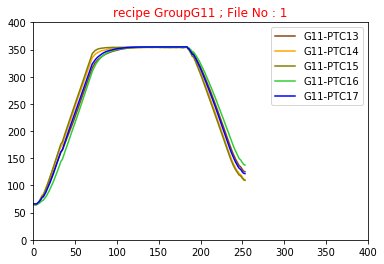

<Figure size 1600x1280 with 0 Axes>

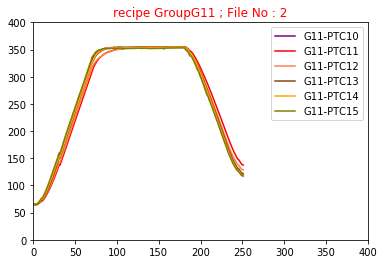

<Figure size 1600x1280 with 0 Axes>

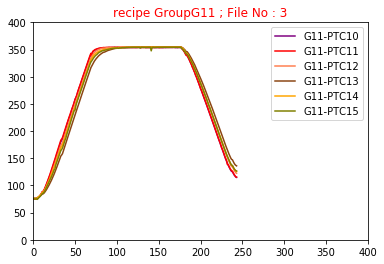

<Figure size 1600x1280 with 0 Axes>

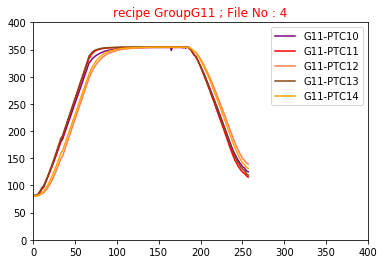

<Figure size 1600x1280 with 0 Axes>

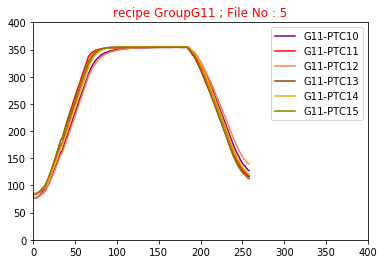

<Figure size 1600x1280 with 0 Axes>

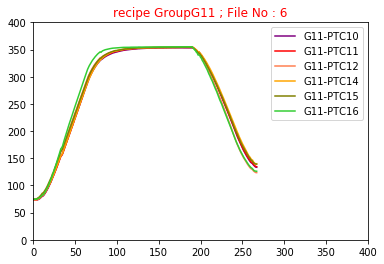

<Figure size 1600x1280 with 0 Axes>

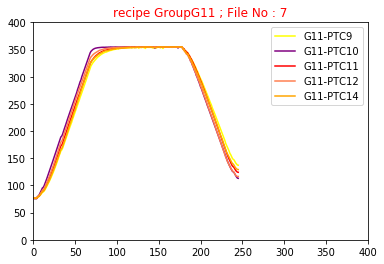

<Figure size 1600x1280 with 0 Axes>

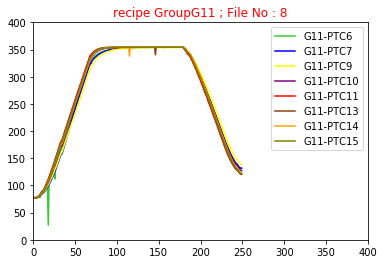

<Figure size 1600x1280 with 0 Axes>

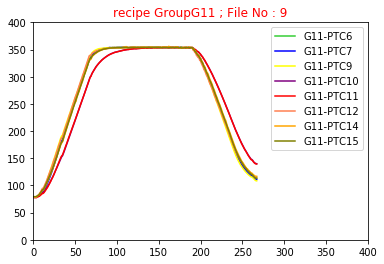

<Figure size 1600x1280 with 0 Axes>

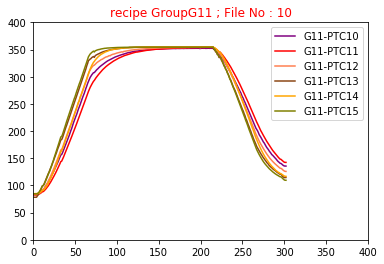

<Figure size 1600x1280 with 0 Axes>

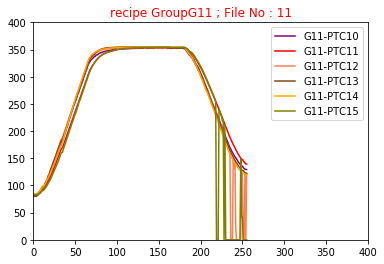

<Figure size 1600x1280 with 0 Axes>

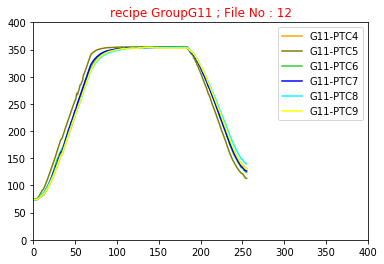

<Figure size 1600x1280 with 0 Axes>

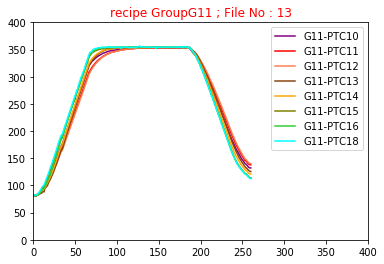

<Figure size 1600x1280 with 0 Axes>

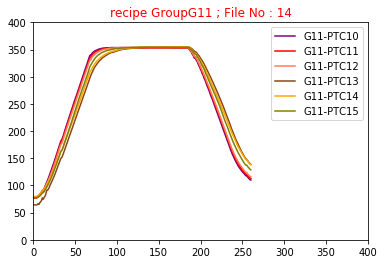

<Figure size 1600x1280 with 0 Axes>

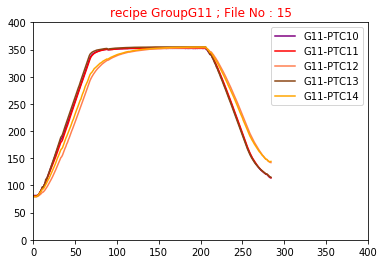

<Figure size 1600x1280 with 0 Axes>

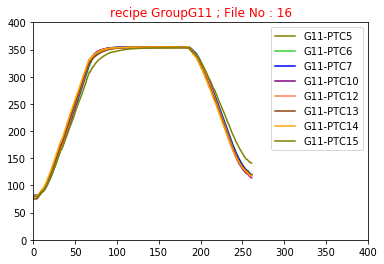

<Figure size 1600x1280 with 0 Axes>

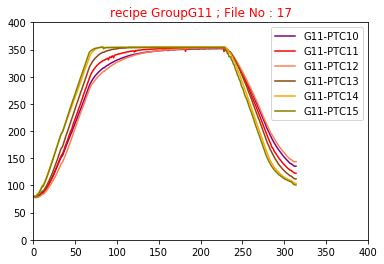

<Figure size 1600x1280 with 0 Axes>

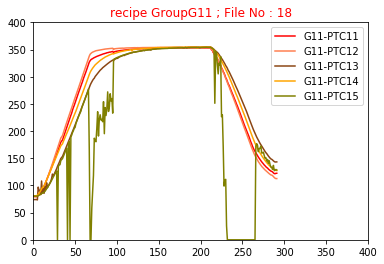

<Figure size 1600x1280 with 0 Axes>

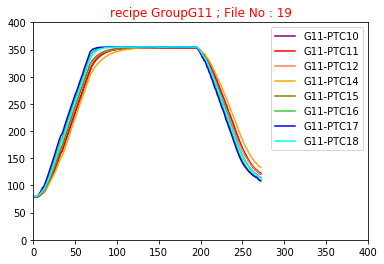

<Figure size 1600x1280 with 0 Axes>

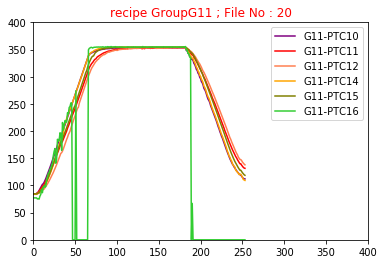

<Figure size 1600x1280 with 0 Axes>

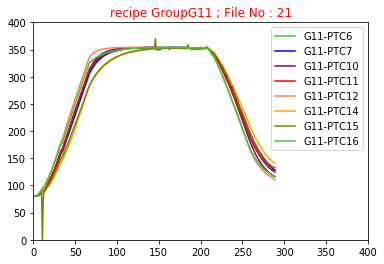

<Figure size 1600x1280 with 0 Axes>

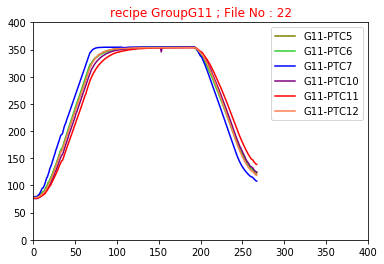

<Figure size 1600x1280 with 0 Axes>

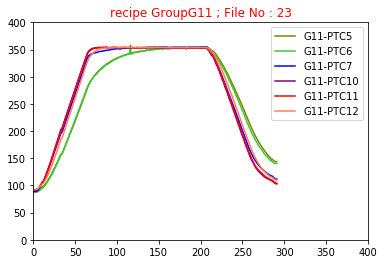

<Figure size 1600x1280 with 0 Axes>

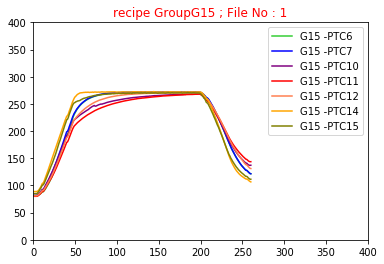

<Figure size 1600x1280 with 0 Axes>

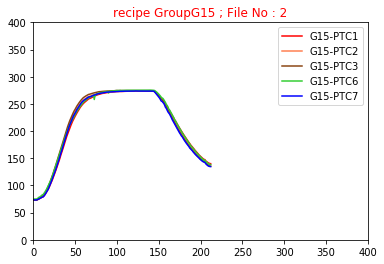

<Figure size 1600x1280 with 0 Axes>

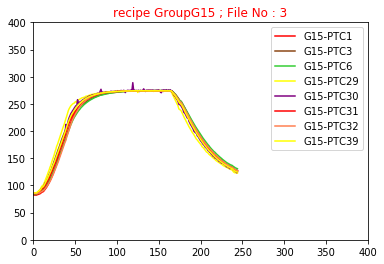

<Figure size 1600x1280 with 0 Axes>

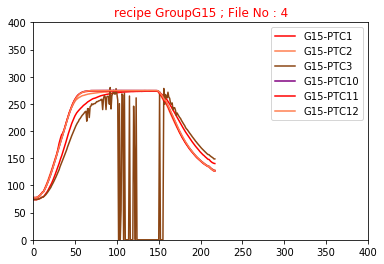

<Figure size 1600x1280 with 0 Axes>

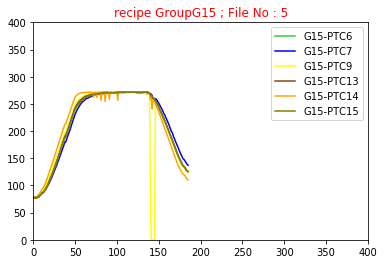

<Figure size 1600x1280 with 0 Axes>

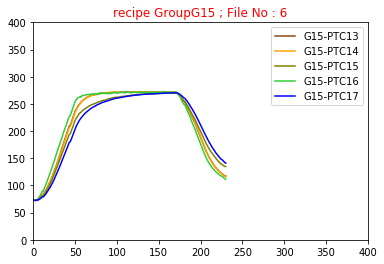

<Figure size 1600x1280 with 0 Axes>

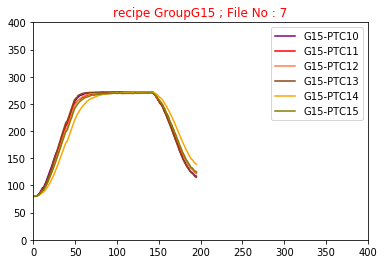

<Figure size 1600x1280 with 0 Axes>

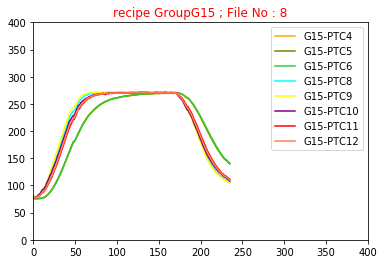

<Figure size 1600x1280 with 0 Axes>

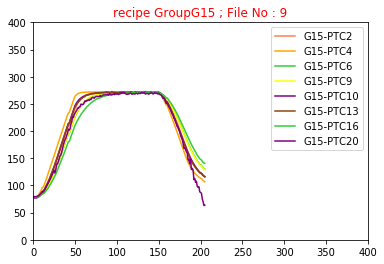

<Figure size 1600x1280 with 0 Axes>

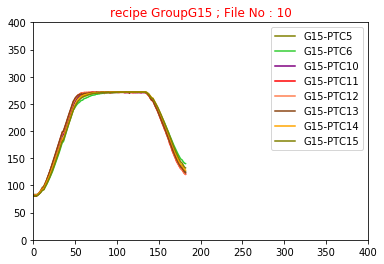

<Figure size 1600x1280 with 0 Axes>

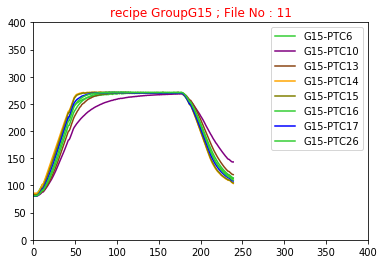

<Figure size 1600x1280 with 0 Axes>

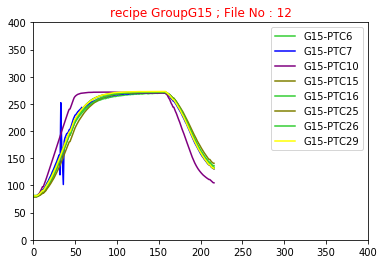

<Figure size 1600x1280 with 0 Axes>

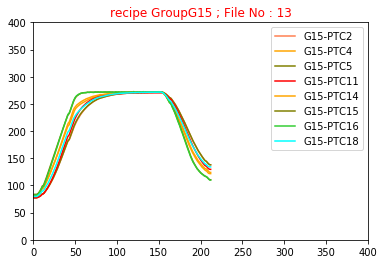

<Figure size 1600x1280 with 0 Axes>

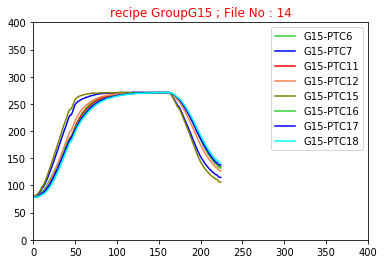

<Figure size 1600x1280 with 0 Axes>

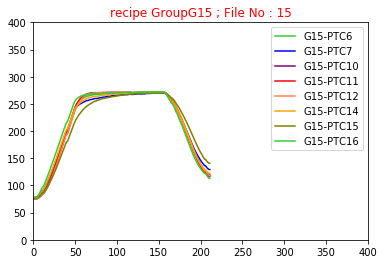

<Figure size 1600x1280 with 0 Axes>

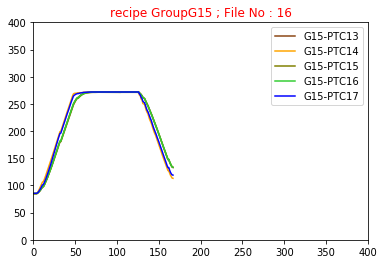

<Figure size 1600x1280 with 0 Axes>

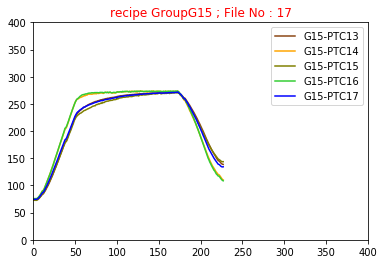

<Figure size 1600x1280 with 0 Axes>

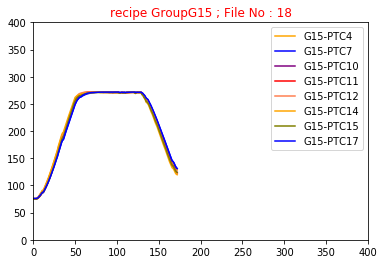

<Figure size 1600x1280 with 0 Axes>

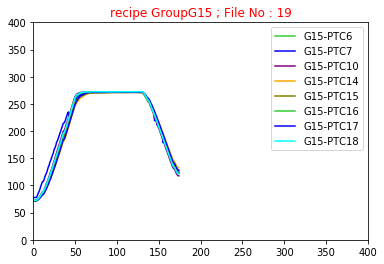

<Figure size 1600x1280 with 0 Axes>

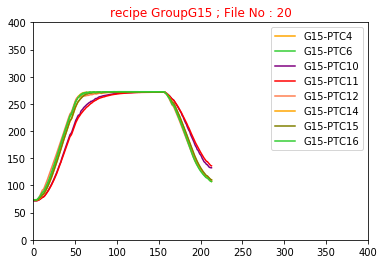

<Figure size 1600x1280 with 0 Axes>

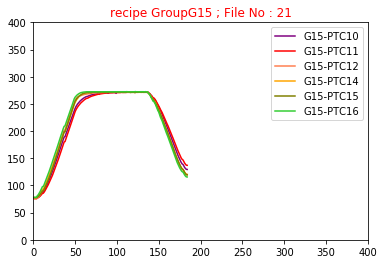

<Figure size 1600x1280 with 0 Axes>

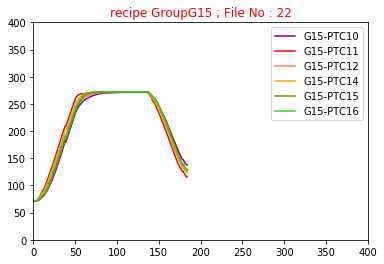

<Figure size 1600x1280 with 0 Axes>

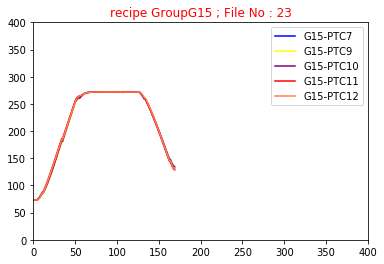

<Figure size 1600x1280 with 0 Axes>

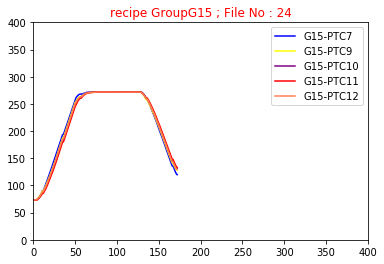

<Figure size 1600x1280 with 0 Axes>

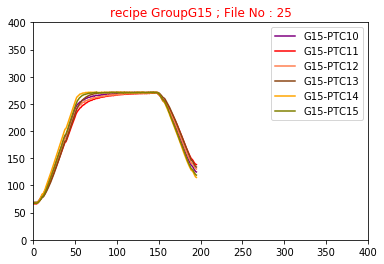

<Figure size 1600x1280 with 0 Axes>

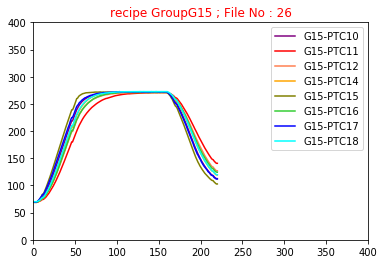

<Figure size 1600x1280 with 0 Axes>

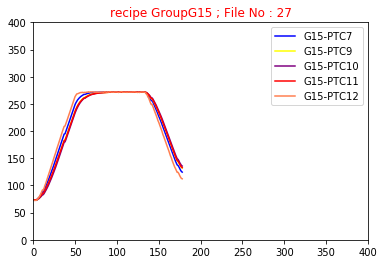

<Figure size 1600x1280 with 0 Axes>

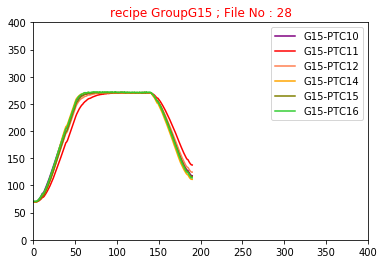

<Figure size 1600x1280 with 0 Axes>

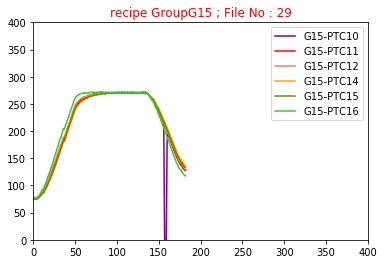

<Figure size 1600x1280 with 0 Axes>

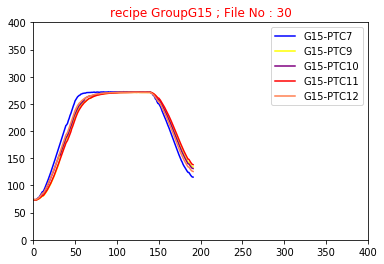

<Figure size 1600x1280 with 0 Axes>

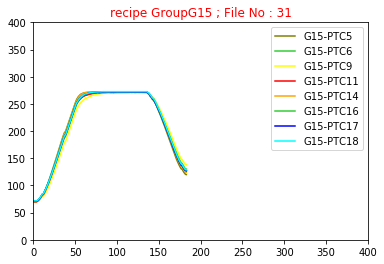

<Figure size 1600x1280 with 0 Axes>

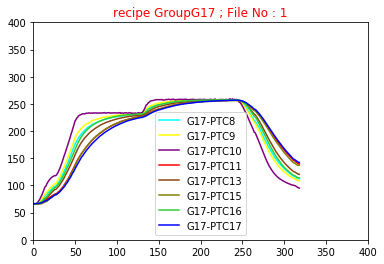

<Figure size 1600x1280 with 0 Axes>

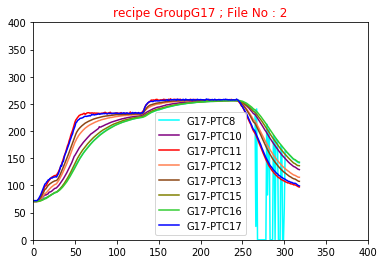

<Figure size 1600x1280 with 0 Axes>

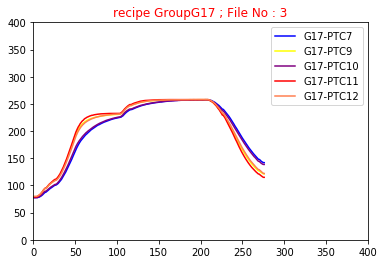

<Figure size 1600x1280 with 0 Axes>

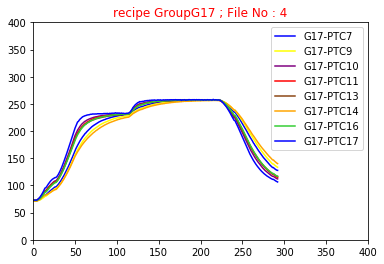

<Figure size 1600x1280 with 0 Axes>

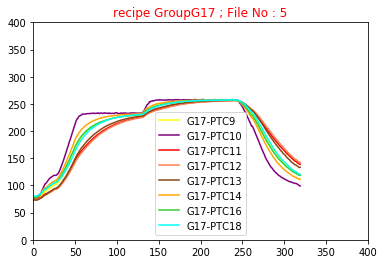

<Figure size 1600x1280 with 0 Axes>

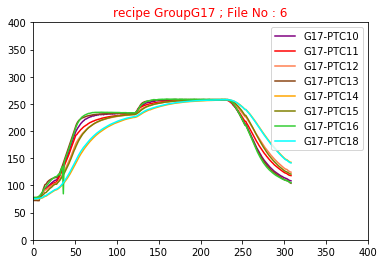

<Figure size 1600x1280 with 0 Axes>

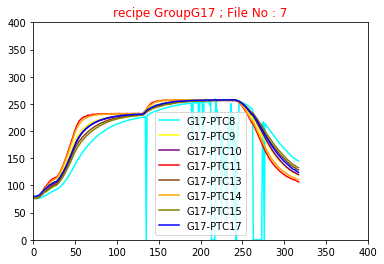

<Figure size 1600x1280 with 0 Axes>

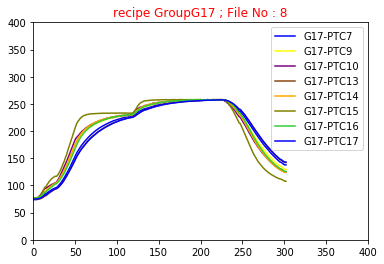

<Figure size 1600x1280 with 0 Axes>

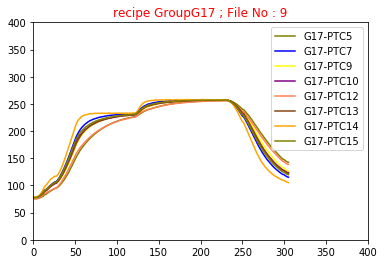

<Figure size 1600x1280 with 0 Axes>

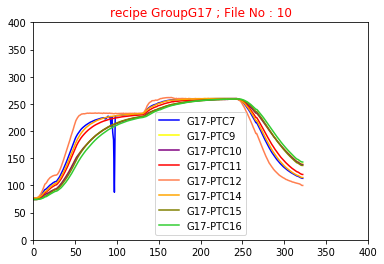

<Figure size 1600x1280 with 0 Axes>

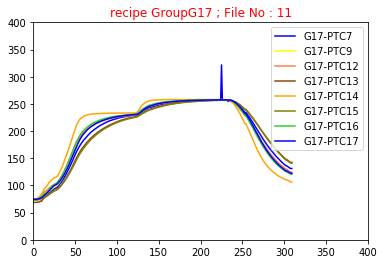

<Figure size 1600x1280 with 0 Axes>

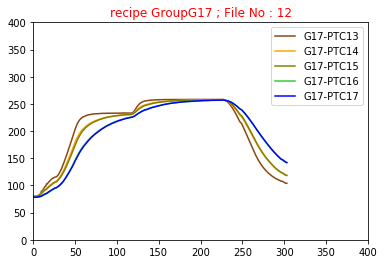

<Figure size 1600x1280 with 0 Axes>

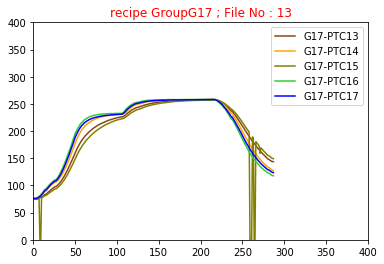

<Figure size 1600x1280 with 0 Axes>

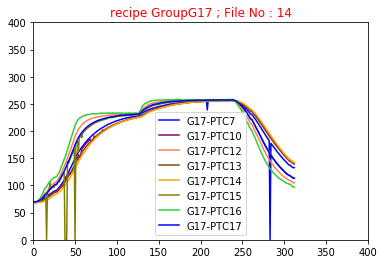

<Figure size 1600x1280 with 0 Axes>

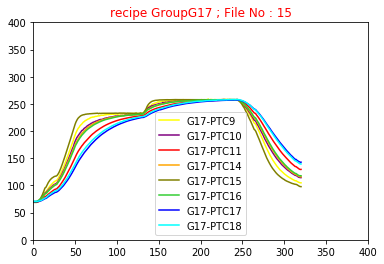

<Figure size 1600x1280 with 0 Axes>

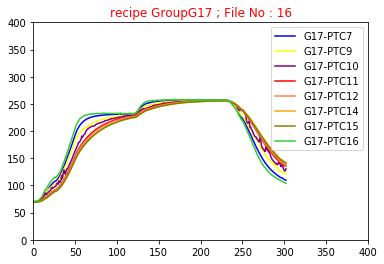

<Figure size 1600x1280 with 0 Axes>

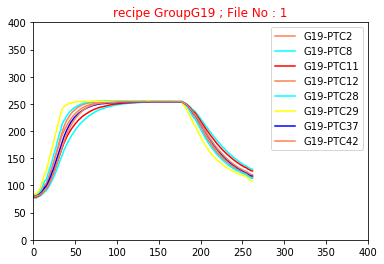

<Figure size 1600x1280 with 0 Axes>

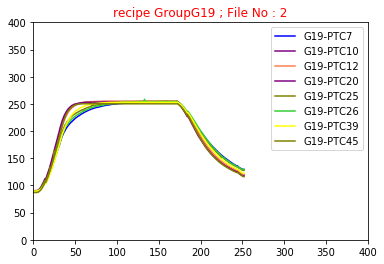

<Figure size 1600x1280 with 0 Axes>

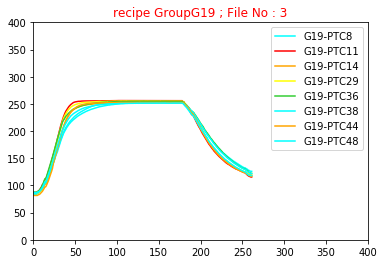

<Figure size 1600x1280 with 0 Axes>

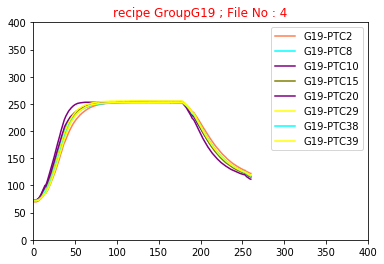

<Figure size 1600x1280 with 0 Axes>

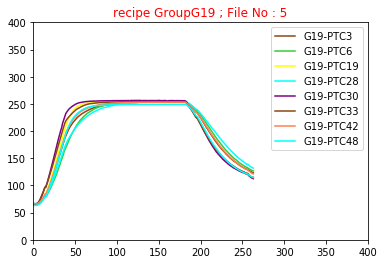

<Figure size 1600x1280 with 0 Axes>

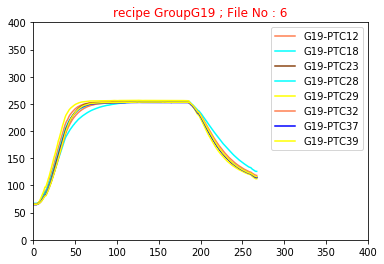

<Figure size 1600x1280 with 0 Axes>

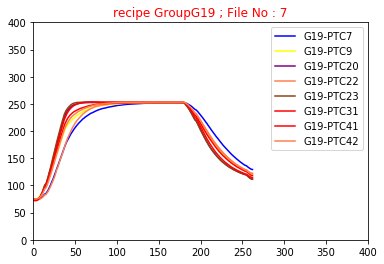

<Figure size 1600x1280 with 0 Axes>

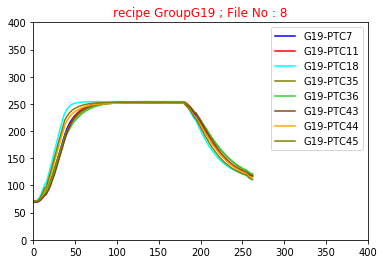

<Figure size 1600x1280 with 0 Axes>

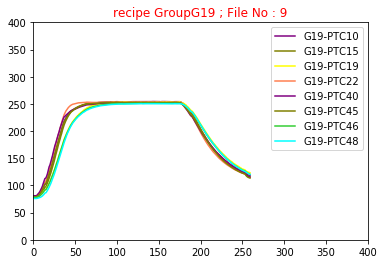

<Figure size 1600x1280 with 0 Axes>

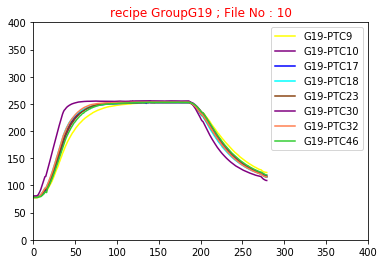

<Figure size 1600x1280 with 0 Axes>

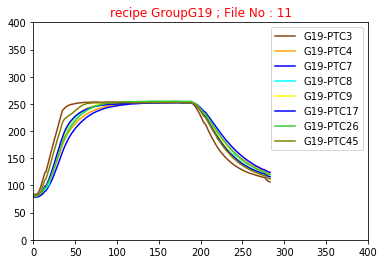

<Figure size 1600x1280 with 0 Axes>

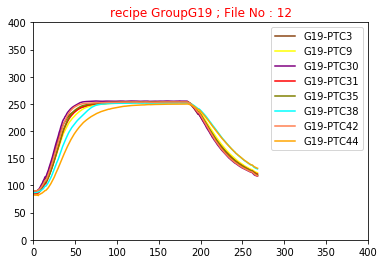

<Figure size 1600x1280 with 0 Axes>

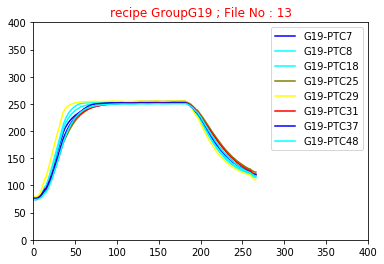

<Figure size 1600x1280 with 0 Axes>

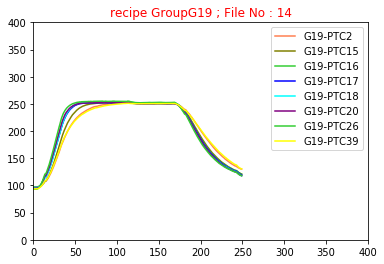

<Figure size 1600x1280 with 0 Axes>

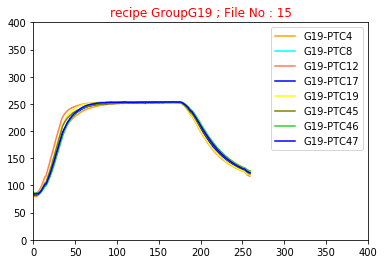

<Figure size 1600x1280 with 0 Axes>

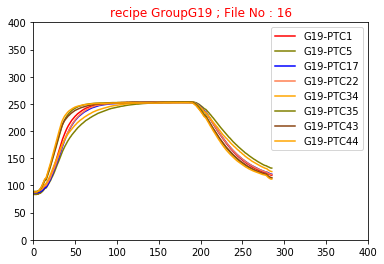

<Figure size 1600x1280 with 0 Axes>

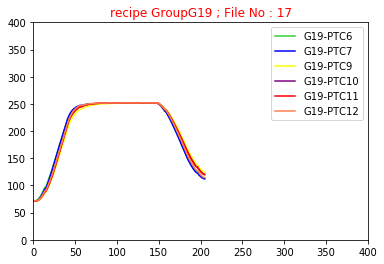

<Figure size 1600x1280 with 0 Axes>

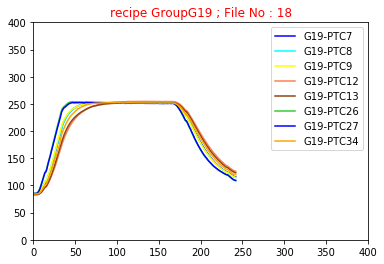

<Figure size 1600x1280 with 0 Axes>

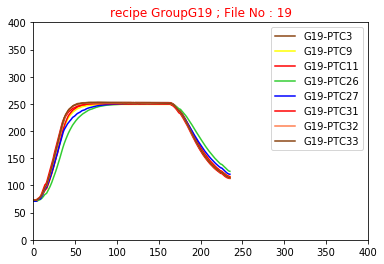

<Figure size 1600x1280 with 0 Axes>

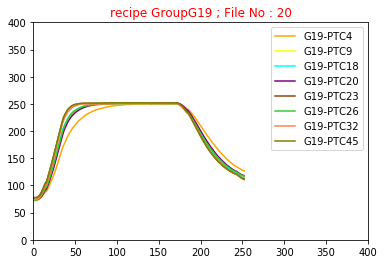

<Figure size 1600x1280 with 0 Axes>

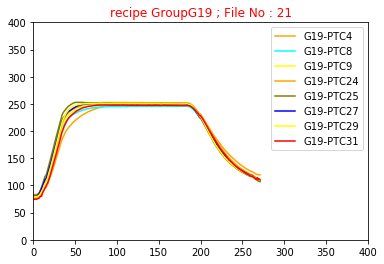

<Figure size 1600x1280 with 0 Axes>

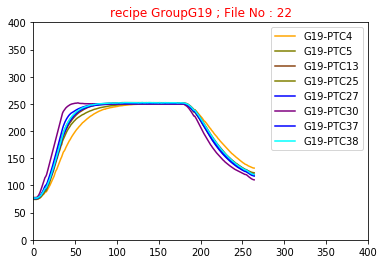

<Figure size 1600x1280 with 0 Axes>

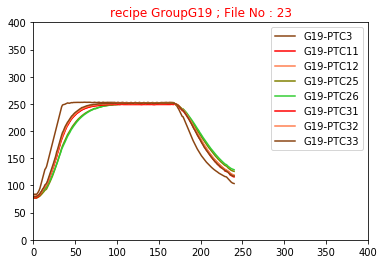

<Figure size 1600x1280 with 0 Axes>

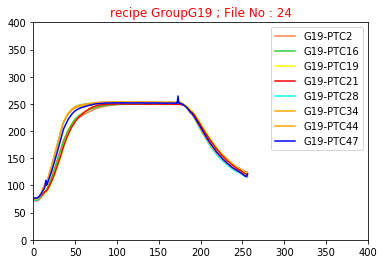

<Figure size 1600x1280 with 0 Axes>

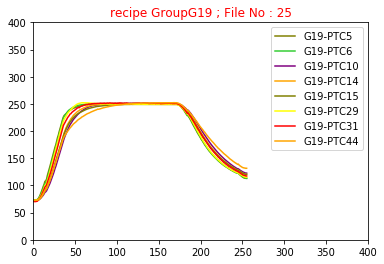

<Figure size 1600x1280 with 0 Axes>

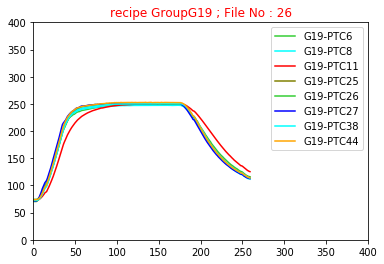

<Figure size 1600x1280 with 0 Axes>

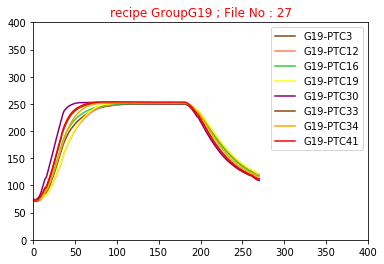

<Figure size 1600x1280 with 0 Axes>

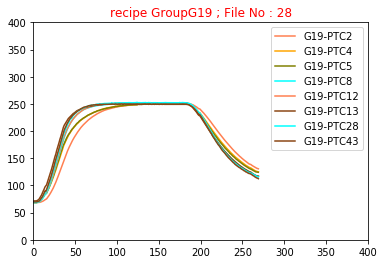

<Figure size 1600x1280 with 0 Axes>

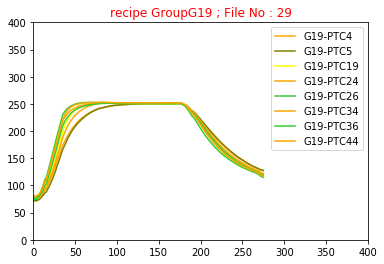

<Figure size 1600x1280 with 0 Axes>

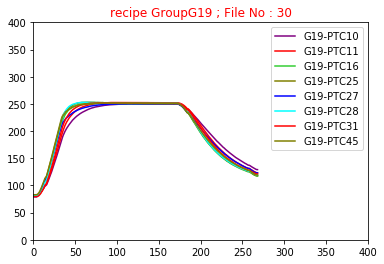

<Figure size 1600x1280 with 0 Axes>

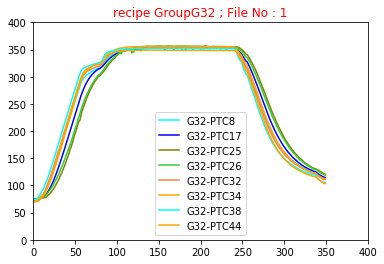

<Figure size 1600x1280 with 0 Axes>

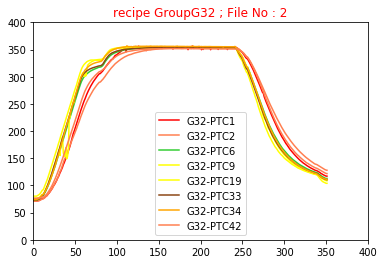

<Figure size 1600x1280 with 0 Axes>

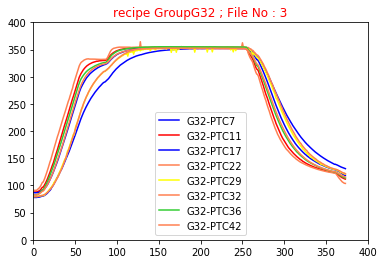

<Figure size 1600x1280 with 0 Axes>

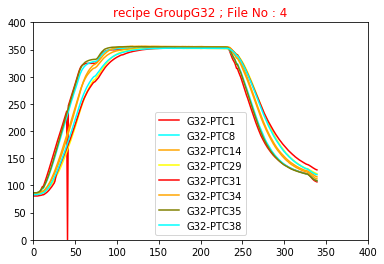

<Figure size 1600x1280 with 0 Axes>

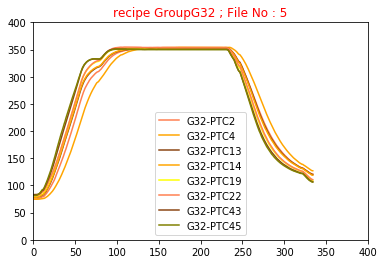

<Figure size 1600x1280 with 0 Axes>

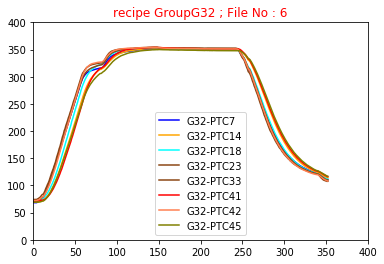

<Figure size 1600x1280 with 0 Axes>

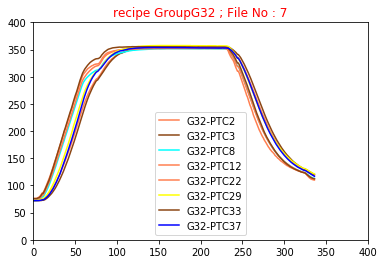

<Figure size 1600x1280 with 0 Axes>

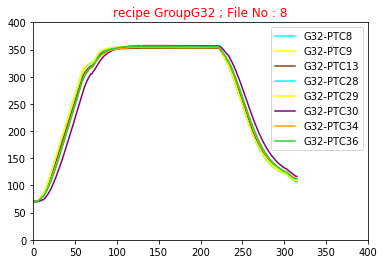

<Figure size 1600x1280 with 0 Axes>

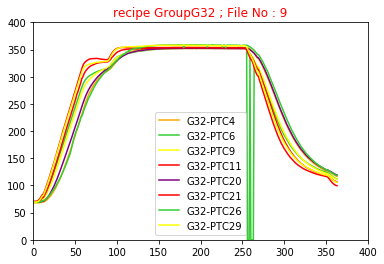

<Figure size 1600x1280 with 0 Axes>

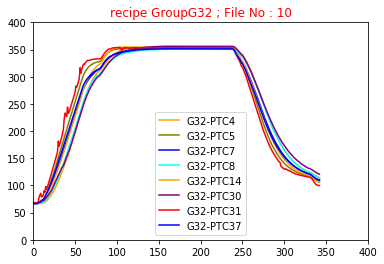

<Figure size 1600x1280 with 0 Axes>

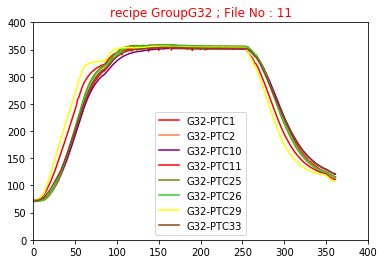

<Figure size 1600x1280 with 0 Axes>

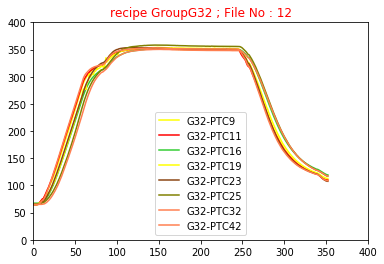

<Figure size 1600x1280 with 0 Axes>

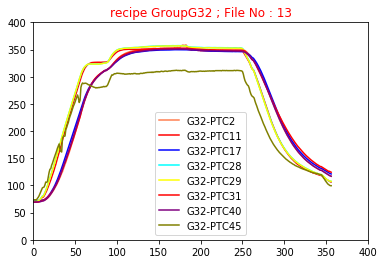

<Figure size 1600x1280 with 0 Axes>

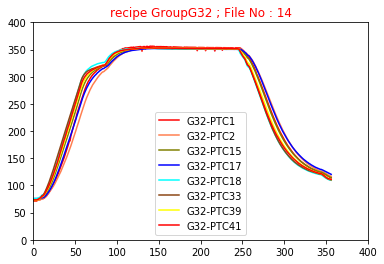

<Figure size 1600x1280 with 0 Axes>

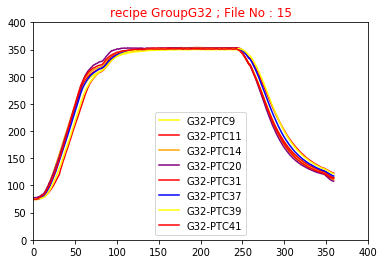

<Figure size 1600x1280 with 0 Axes>

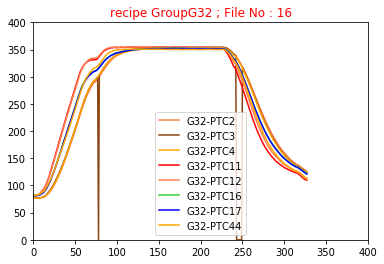

<Figure size 1600x1280 with 0 Axes>

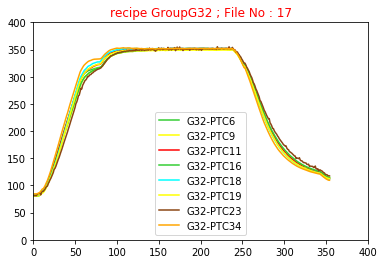

<Figure size 1600x1280 with 0 Axes>

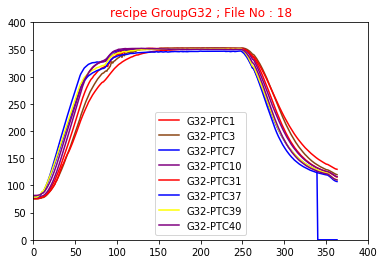

<Figure size 1600x1280 with 0 Axes>

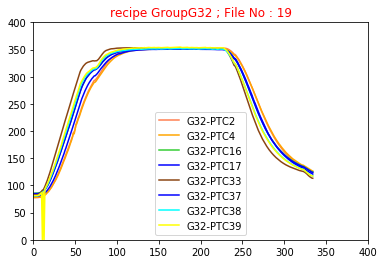

<Figure size 1600x1280 with 0 Axes>

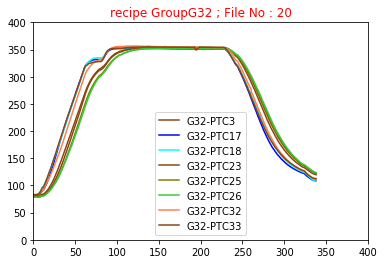

<Figure size 1600x1280 with 0 Axes>

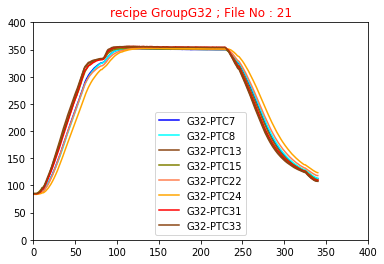

<Figure size 1600x1280 with 0 Axes>

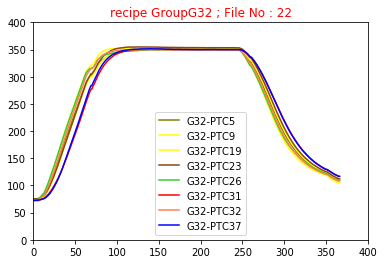

<Figure size 1600x1280 with 0 Axes>

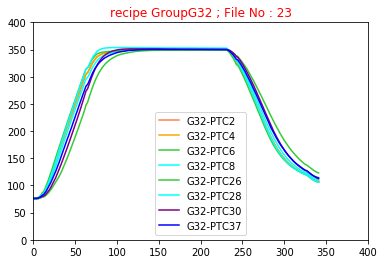

<Figure size 1600x1280 with 0 Axes>

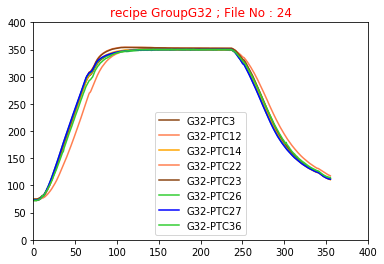

<Figure size 1600x1280 with 0 Axes>

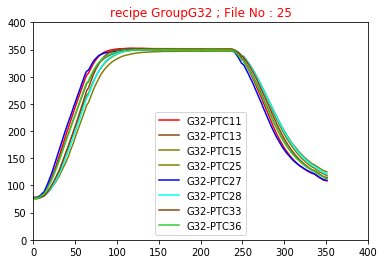

<Figure size 1600x1280 with 0 Axes>

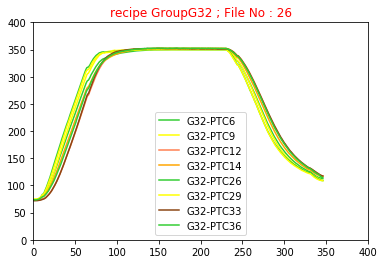

<Figure size 1600x1280 with 0 Axes>

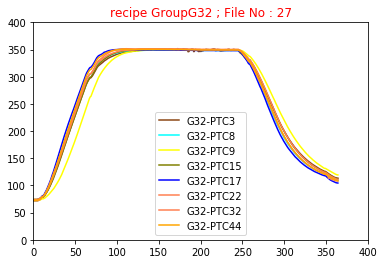

<Figure size 1600x1280 with 0 Axes>

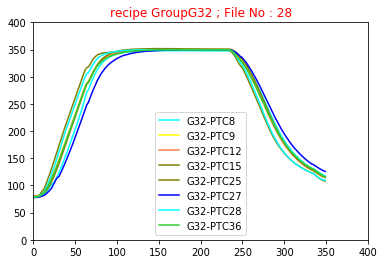

<Figure size 1600x1280 with 0 Axes>

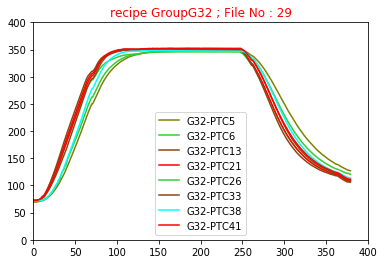

<Figure size 1600x1280 with 0 Axes>

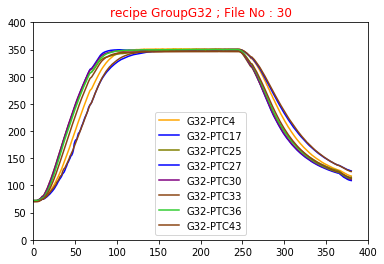

<Figure size 1600x1280 with 0 Axes>

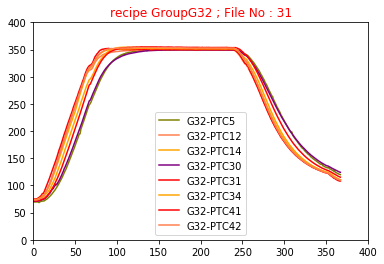

<Figure size 1600x1280 with 0 Axes>

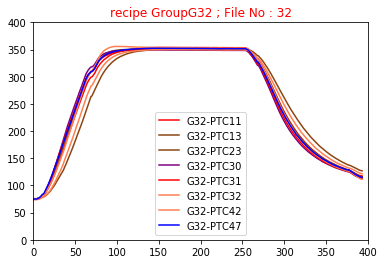

<Figure size 1600x1280 with 0 Axes>

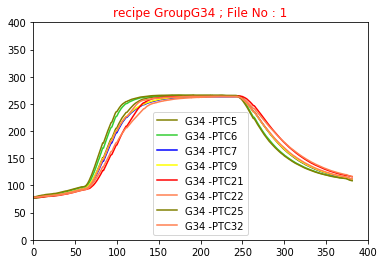

<Figure size 1600x1280 with 0 Axes>

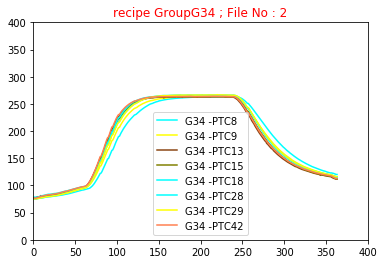

<Figure size 1600x1280 with 0 Axes>

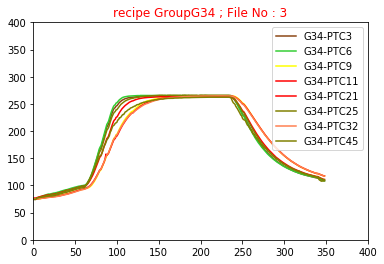

<Figure size 1600x1280 with 0 Axes>

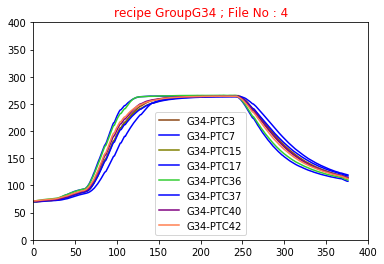

<Figure size 1600x1280 with 0 Axes>

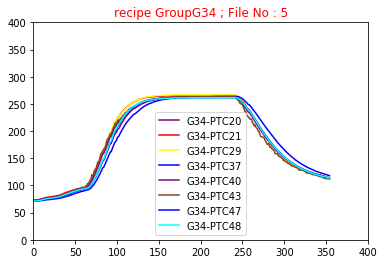

<Figure size 1600x1280 with 0 Axes>

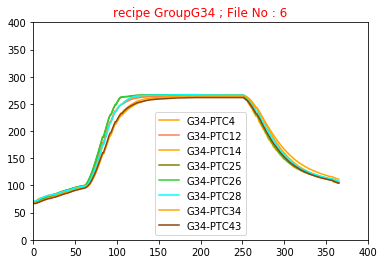

<Figure size 1600x1280 with 0 Axes>

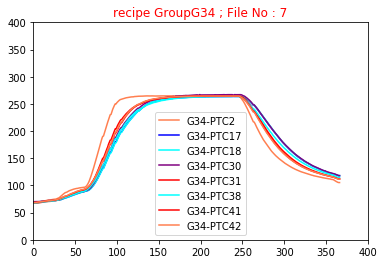

<Figure size 1600x1280 with 0 Axes>

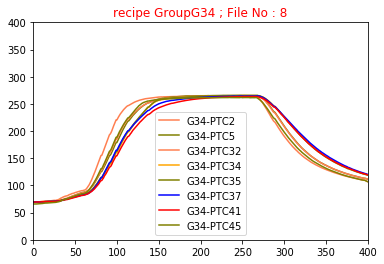

<Figure size 1600x1280 with 0 Axes>

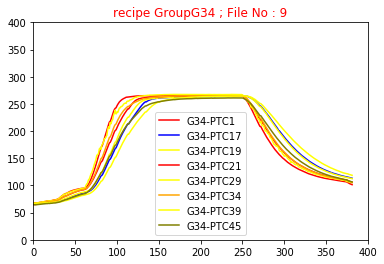

<Figure size 1600x1280 with 0 Axes>

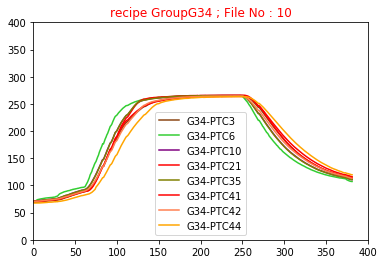

<Figure size 1600x1280 with 0 Axes>

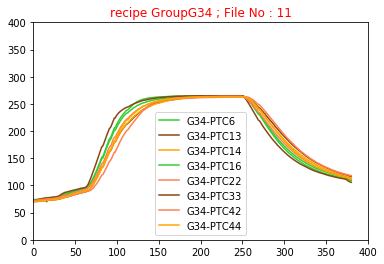

<Figure size 1600x1280 with 0 Axes>

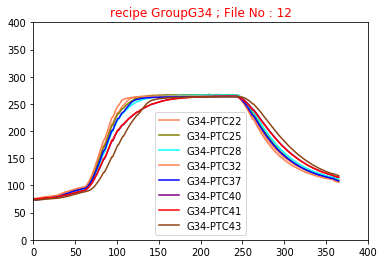

<Figure size 1600x1280 with 0 Axes>

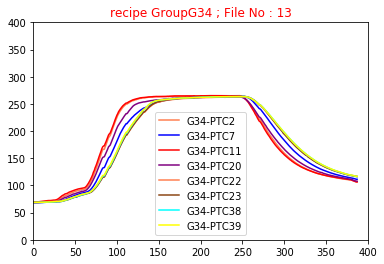

<Figure size 1600x1280 with 0 Axes>

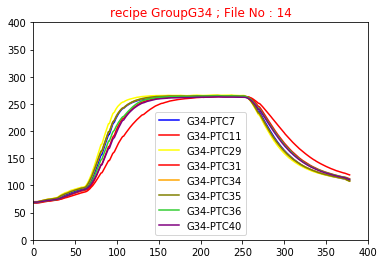

<Figure size 1600x1280 with 0 Axes>

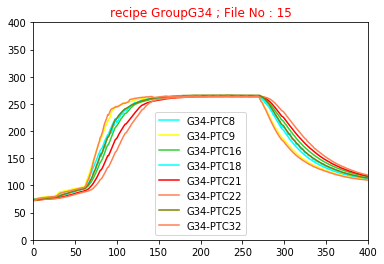

<Figure size 1600x1280 with 0 Axes>

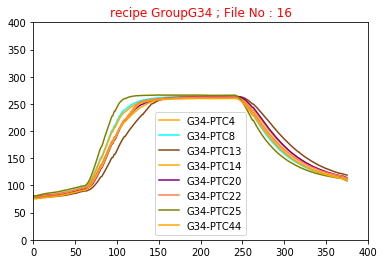

<Figure size 1600x1280 with 0 Axes>

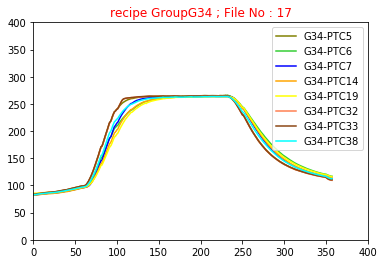

<Figure size 1600x1280 with 0 Axes>

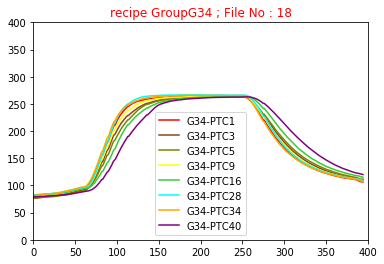

<Figure size 1600x1280 with 0 Axes>

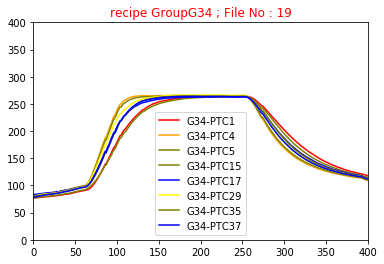

<Figure size 1600x1280 with 0 Axes>

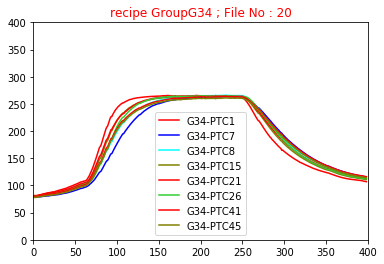

<Figure size 1600x1280 with 0 Axes>

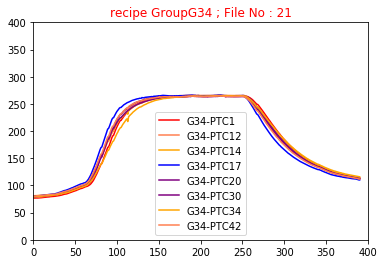

<Figure size 1600x1280 with 0 Axes>

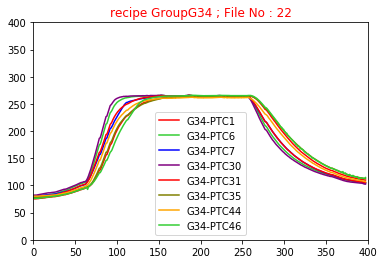

<Figure size 1600x1280 with 0 Axes>

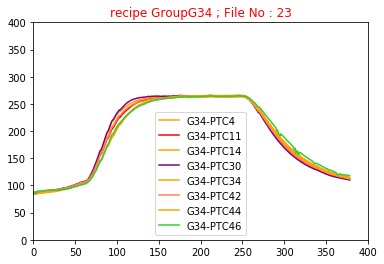

<Figure size 1600x1280 with 0 Axes>

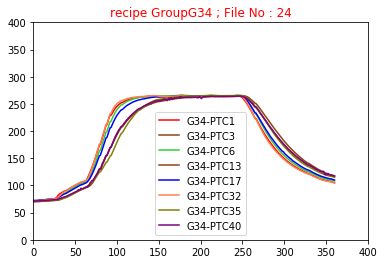

<Figure size 1600x1280 with 0 Axes>

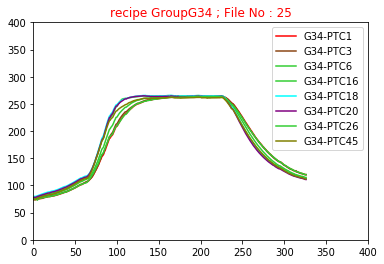

<Figure size 1600x1280 with 0 Axes>

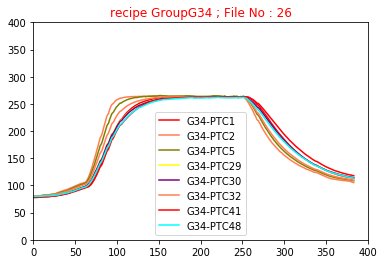

<Figure size 1600x1280 with 0 Axes>

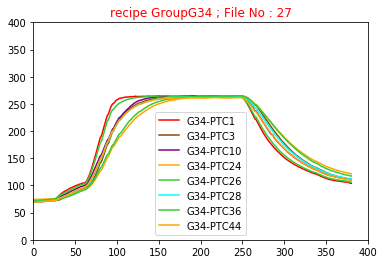

<Figure size 1600x1280 with 0 Axes>

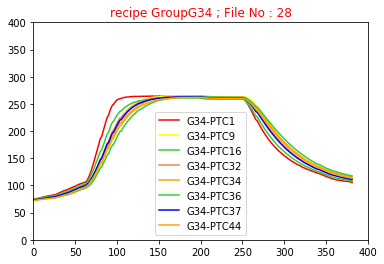

<Figure size 1600x1280 with 0 Axes>

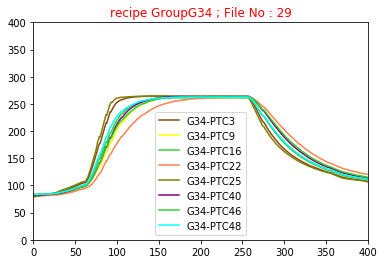

<Figure size 1600x1280 with 0 Axes>

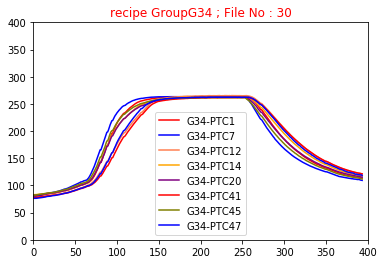

<Figure size 1600x1280 with 0 Axes>

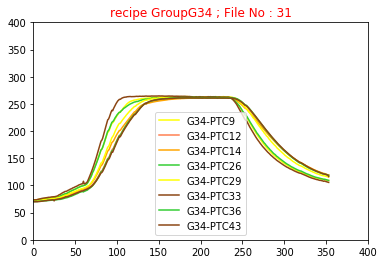

<Figure size 1600x1280 with 0 Axes>

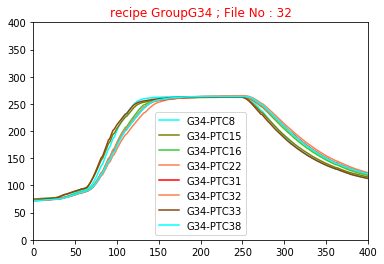

<Figure size 1600x1280 with 0 Axes>

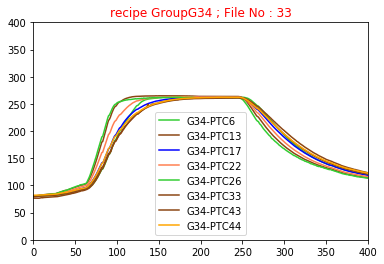

<Figure size 1600x1280 with 0 Axes>

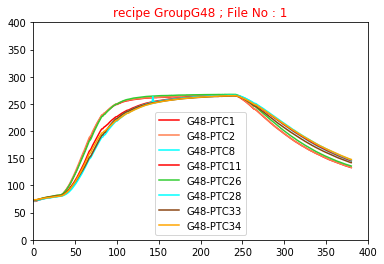

<Figure size 1600x1280 with 0 Axes>

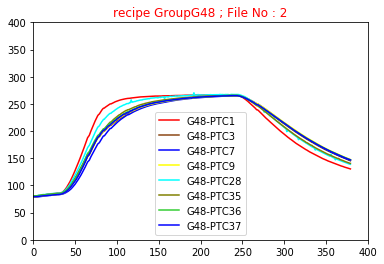

<Figure size 1600x1280 with 0 Axes>

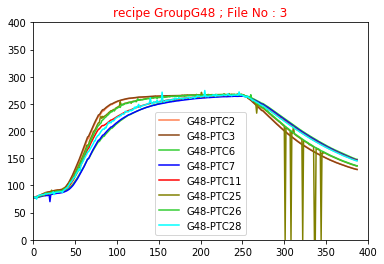

<Figure size 1600x1280 with 0 Axes>

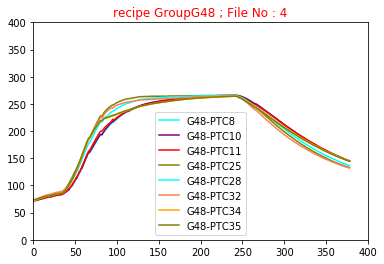

<Figure size 1600x1280 with 0 Axes>

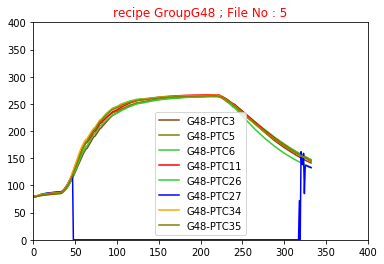

<Figure size 1600x1280 with 0 Axes>

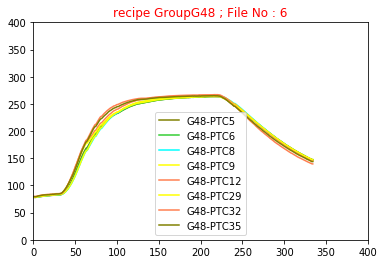

<Figure size 1600x1280 with 0 Axes>

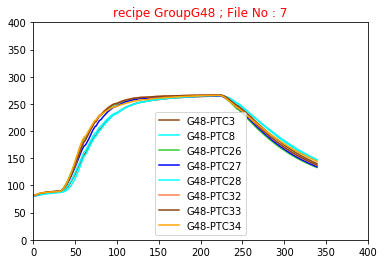

<Figure size 1600x1280 with 0 Axes>

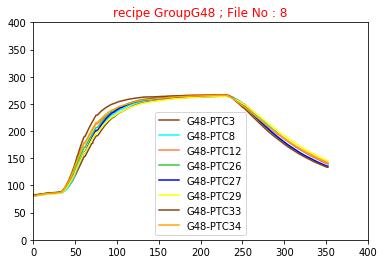

<Figure size 1600x1280 with 0 Axes>

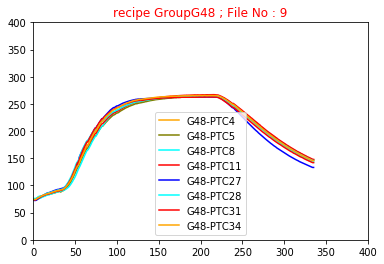

<Figure size 1600x1280 with 0 Axes>

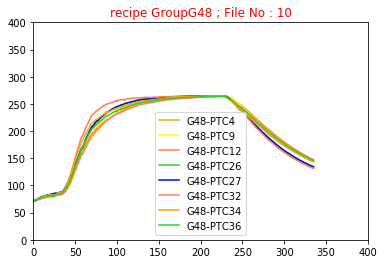

<Figure size 1600x1280 with 0 Axes>

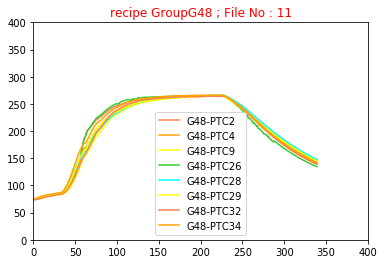

<Figure size 1600x1280 with 0 Axes>

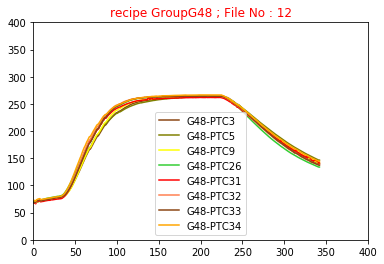

<Figure size 1600x1280 with 0 Axes>

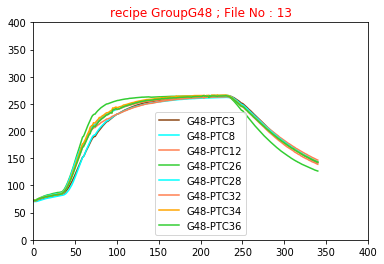

<Figure size 1600x1280 with 0 Axes>

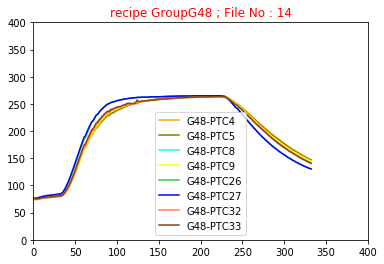

<Figure size 1600x1280 with 0 Axes>

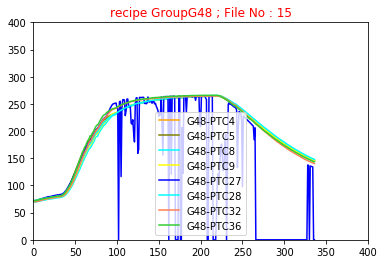

<Figure size 1600x1280 with 0 Axes>

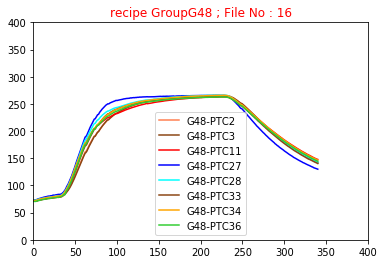

<Figure size 1600x1280 with 0 Axes>

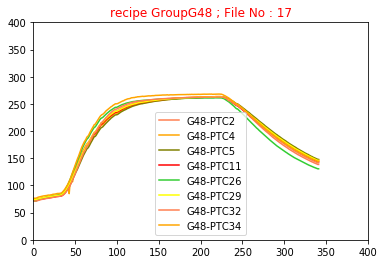

<Figure size 1600x1280 with 0 Axes>

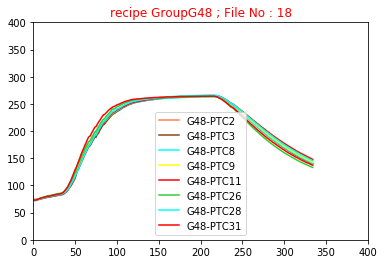

<Figure size 1600x1280 with 0 Axes>

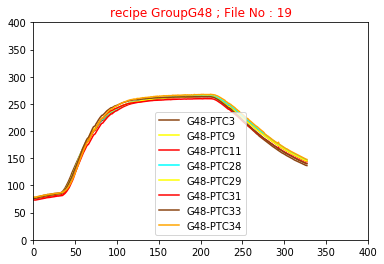

<Figure size 1600x1280 with 0 Axes>

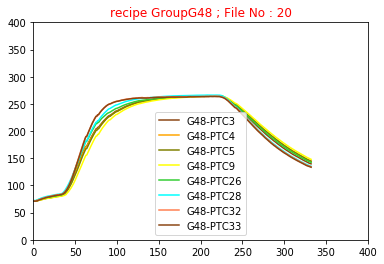

<Figure size 1600x1280 with 0 Axes>

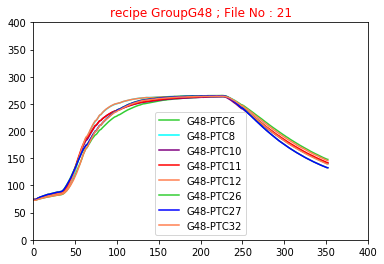

<Figure size 1600x1280 with 0 Axes>

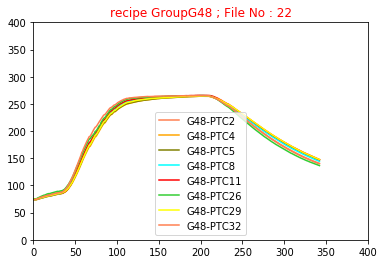

<Figure size 1600x1280 with 0 Axes>

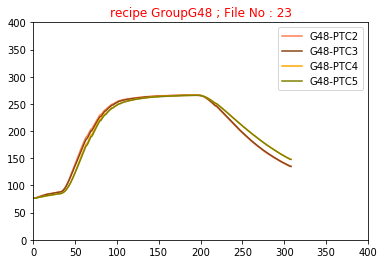

<Figure size 1600x1280 with 0 Axes>

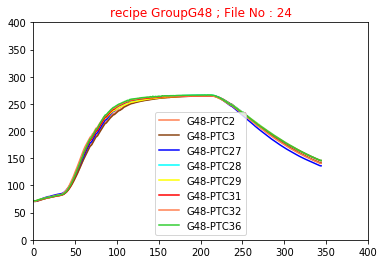

<Figure size 1600x1280 with 0 Axes>

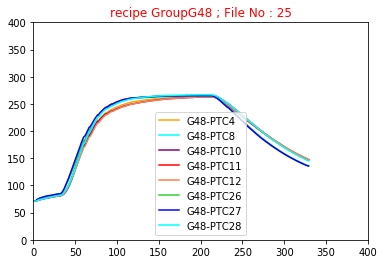

<Figure size 1600x1280 with 0 Axes>

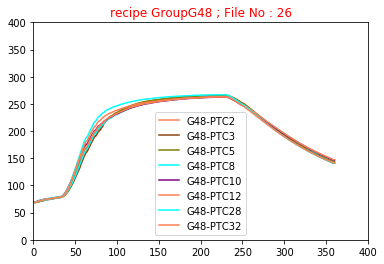

<Figure size 1600x1280 with 0 Axes>

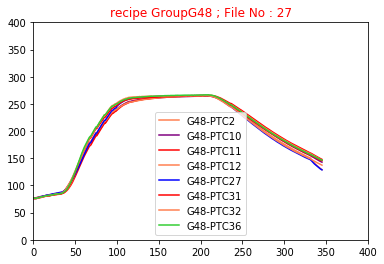

<Figure size 1600x1280 with 0 Axes>

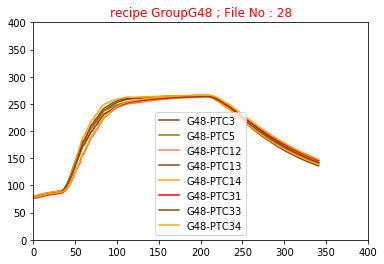

<Figure size 1600x1280 with 0 Axes>

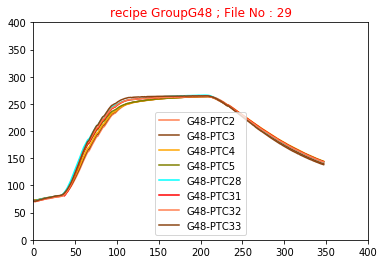

<Figure size 1600x1280 with 0 Axes>

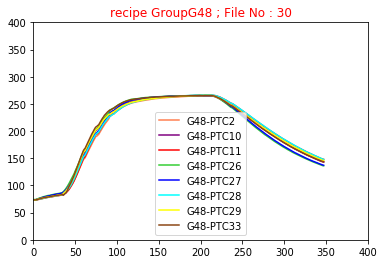

<Figure size 1600x1280 with 0 Axes>

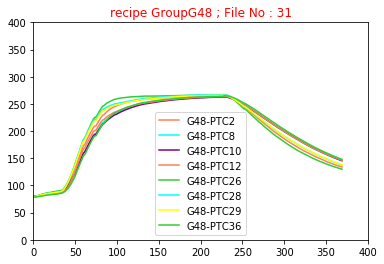

<Figure size 1600x1280 with 0 Axes>

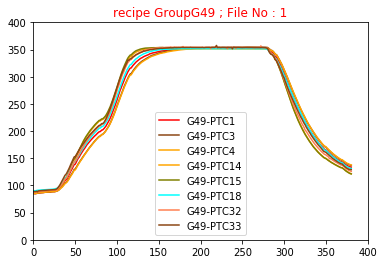

<Figure size 1600x1280 with 0 Axes>

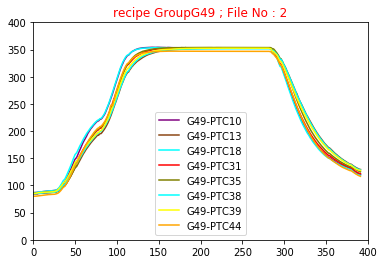

<Figure size 1600x1280 with 0 Axes>

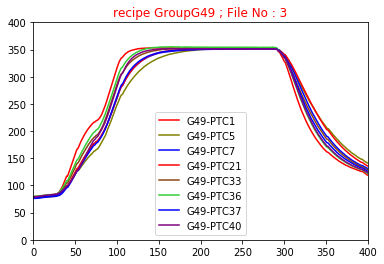

<Figure size 1600x1280 with 0 Axes>

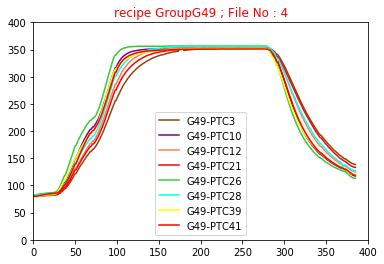

<Figure size 1600x1280 with 0 Axes>

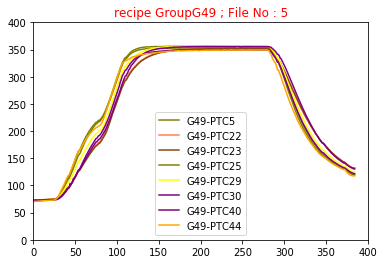

<Figure size 1600x1280 with 0 Axes>

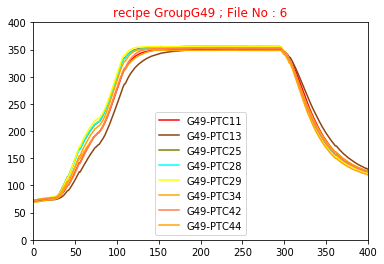

<Figure size 1600x1280 with 0 Axes>

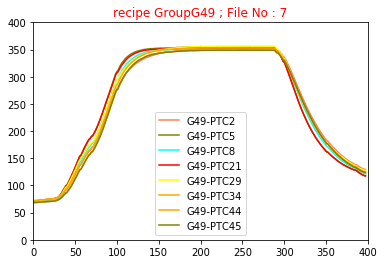

<Figure size 1600x1280 with 0 Axes>

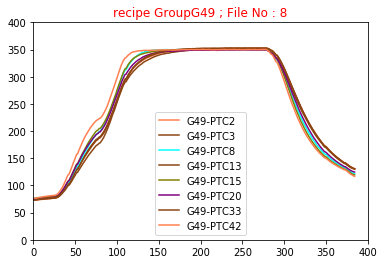

<Figure size 1600x1280 with 0 Axes>

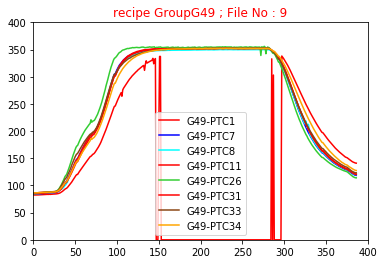

<Figure size 1600x1280 with 0 Axes>

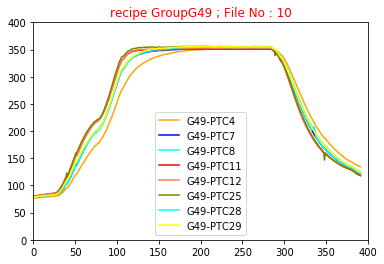

<Figure size 1600x1280 with 0 Axes>

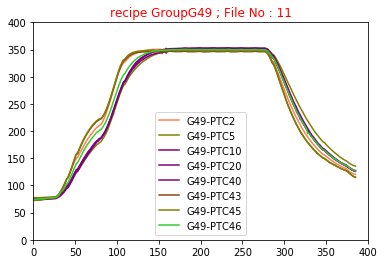

<Figure size 1600x1280 with 0 Axes>

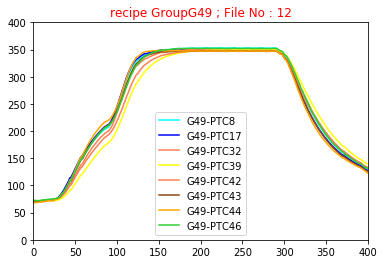

<Figure size 1600x1280 with 0 Axes>

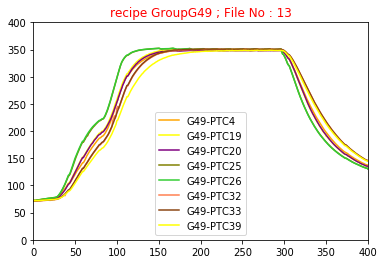

<Figure size 1600x1280 with 0 Axes>

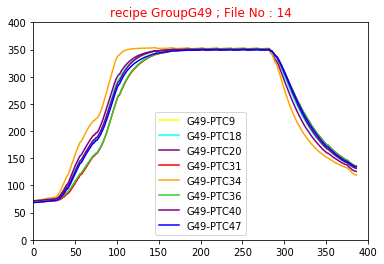

<Figure size 1600x1280 with 0 Axes>

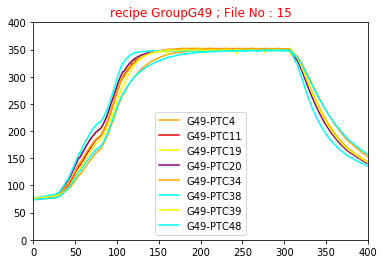

<Figure size 1600x1280 with 0 Axes>

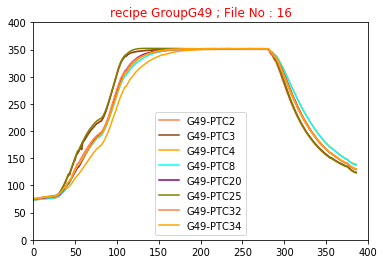

<Figure size 1600x1280 with 0 Axes>

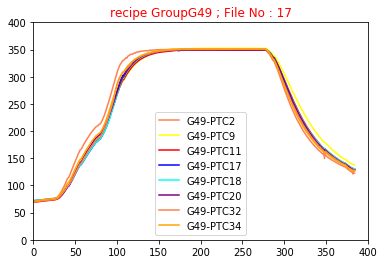

<Figure size 1600x1280 with 0 Axes>

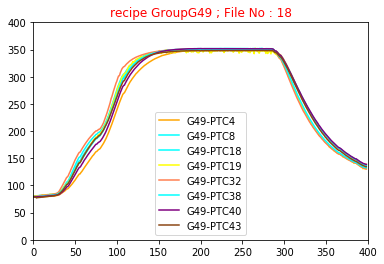

<Figure size 1600x1280 with 0 Axes>

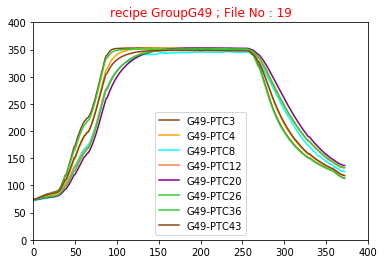

<Figure size 1600x1280 with 0 Axes>

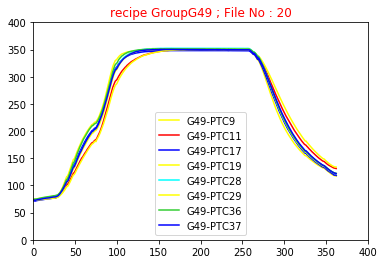

<Figure size 1600x1280 with 0 Axes>

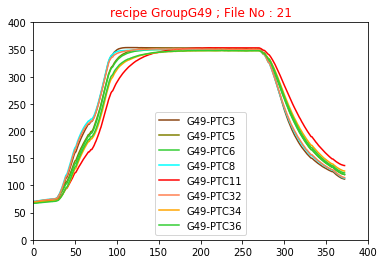

<Figure size 1600x1280 with 0 Axes>

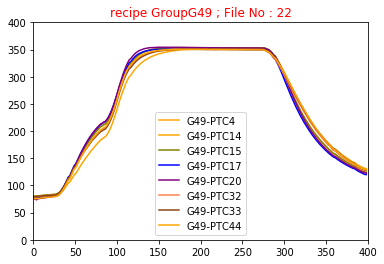

<Figure size 1600x1280 with 0 Axes>

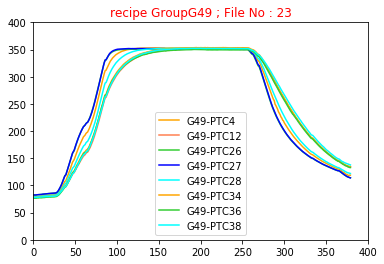

<Figure size 1600x1280 with 0 Axes>

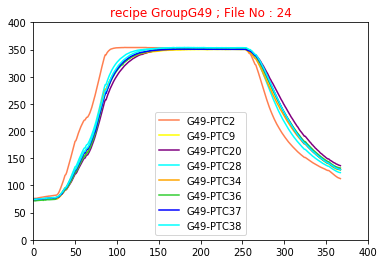

<Figure size 1600x1280 with 0 Axes>

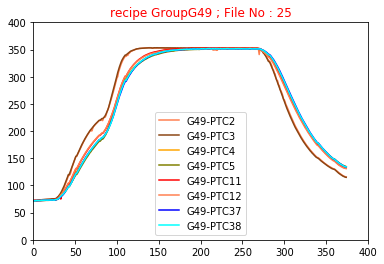

<Figure size 1600x1280 with 0 Axes>

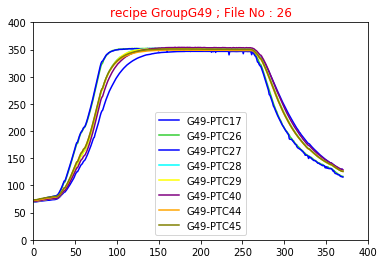

<Figure size 1600x1280 with 0 Axes>

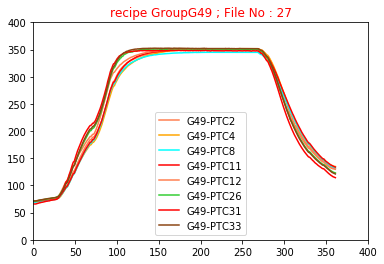

<Figure size 1600x1280 with 0 Axes>

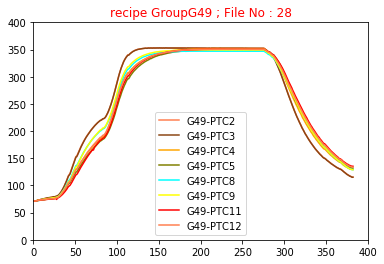

<Figure size 1600x1280 with 0 Axes>

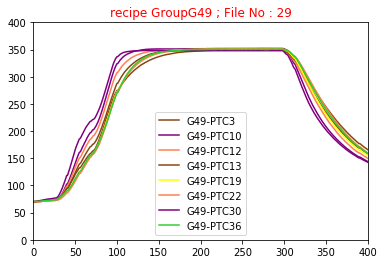

<Figure size 1600x1280 with 0 Axes>

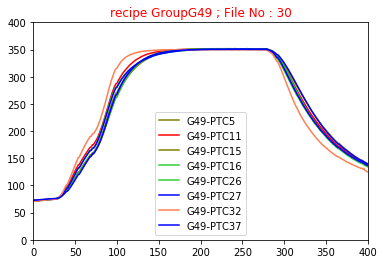

<Figure size 1600x1280 with 0 Axes>

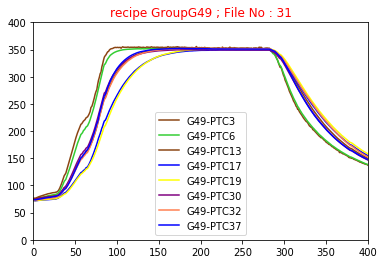

<Figure size 1600x1280 with 0 Axes>

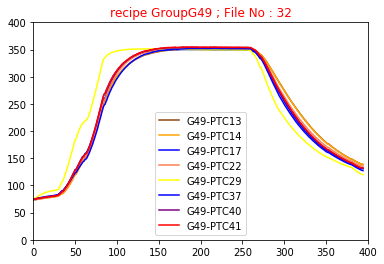

<Figure size 1600x1280 with 0 Axes>

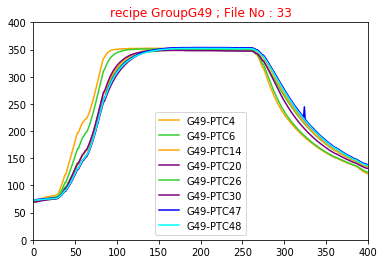

<Figure size 1600x1280 with 0 Axes>

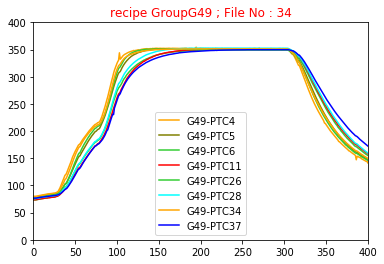

In [12]:
for i in range(len(recipeGroup)):
    aRecipeGroupFileList = getRecipeGroupFileList(recipeGroup[i])
    
    for j in range(len(aRecipeGroupFileList)):
        
        df = readRecipeGroupFile(aRecipeGroupFileList[j])
        plotRecipeGroupFileCurve(df, recipeGroup[i],str(j+1))

# Classification Model Build

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn import metrics

In [14]:
# df=df.values (dataframe to array)
rgdf_data = rgdf.drop(dropColumns, axis = 1)   #v1.08
rgdf_target = rgdf['groupid'].values

In [15]:
rgdf_data.head(3)

,count,mean,std,min,Q1,Q2,Q3,max,median,startT,endT
0,253,271.104743,94.558720,65.9,191.3,320.8,353.4,354.6,320.8,65.9,125.3
1,253,271.828458,96.116089,65.8,190.8,325.9,353.8,354.2,325.9,65.8,110.7
2,253,272.294071,96.935732,64.2,190.4,328.0,353.9,354.4,328.0,64.2,109.3


In [16]:
train_x , test_x , train_y , test_y = train_test_split(rgdf_data,rgdf_target
                                                       ,test_size=0.2,random_state = 4)

## KNN Model

In [33]:
rgdf_data = rgdf.drop(['filename','groupid','eqpid','PTCno','sno','date'],axis = 1)
rgdf_target = rgdf['groupid'].values

In [34]:
drop_G = lambda x : int(x[1:])
rgdf_target_2 = list([drop_G(y) for y in rgdf_target])

In [36]:
train_x, test_x, train_y, test_y = train_test_split(rgdf_data,rgdf_target_2,
                                                    test_size = 0.2)

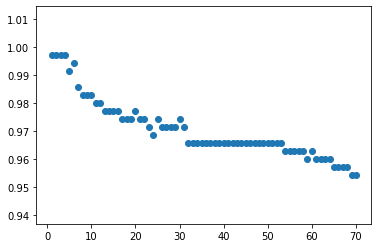

1


In [37]:
#選擇k
accuracies = []
for i in range(1,round(0.05 * train_x.shape[0]) + 1):
    clf = KNeighborsClassifier(n_neighbors = i)
    rg_clf = clf.fit(train_x,train_y)
    test_y_predicted = rg_clf.predict(test_x)
    accuracy = metrics.accuracy_score(test_y,test_y_predicted)
    accuracies.append(accuracy)
#視覺化
plt.scatter(range(1,round(0.05 * train_x.shape[0]) + 1),accuracies)
plt.show()
appr_k = accuracies.index(max(accuracies)) + 1
print(appr_k)    

[48 32 48 17 15 48 19 17 32 15 49 49 34 15 32 48 34 19 49 15 11 15 32 48
 19 19 19 49 49 17 34 15 48 19 32 32 32 48 48 19 48 49 11 11 34 19 15 17
 11 32 32 48 49 11 32 32 48 11 32 34 49 11 49 15 19 19 11 34 15 11 32 32
 49 48 49 32 34 34 32 32 32 32 15 15 15 19 15 48 11 32 48 32 17 49 19 32
 19 49 49 34 17 49 19 49 17 11 48 32 34 34 34 48 32 34 34 17 32 48 15 49
 34 32 11 32 48 17 34 34 19 34 11 17 19 19 11 49 32 19 11 19 32 48 49 48
 48 49 19 48 15 34 48 11 49 11 32 15 32 48 32 32 48 49 34 15 49 32 34 19
 15 32 34 49 19 49 49 32 49 48 34 48 48 49 49 17 15 19 17 49 49 15 49 15
 17 17 49 11 49 48 19 19 48 19 15 19 34 19 11 34 48 32 48 19 32 49 49 48
 34 49 48 34 34 32 48 34 32 49 32 49 17 34 32 32 15 32 15 15 48 11 32 34
 34 49 49 34 32 49 48 15 19 17 34 48 34 15 32 34 19 34 19 48 17 15 19 49
 15 19 34 15 48 48 32 49 11 48 19 48 49 48 19 17 48 32 34 11 17 48 15 34
 32 19 15 11 15 32 48 19 34 32 32 49 11 48 19 17 48 34 48 32 32 15 15 34
 19 32 11 15 48 48 32 49 15 49 48 48 48 34 19 19 15

<Figure size 1600x1280 with 0 Axes>

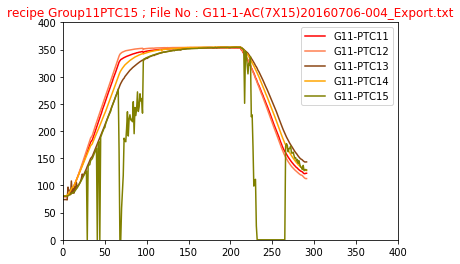

In [40]:
#建立分類器
clf = KNeighborsClassifier(n_neighbors = appr_k)
rg_clf = clf.fit(train_x,train_y)

#預測
test_y_predicted = rg_clf.predict(test_x)
print(test_y_predicted)

#標準答案
print(test_y)

accuracy = metrics.accuracy_score(test_y,test_y_predicted)

print('==============')

print('KNN Model , K = 1, Accuracy Rate = ', accuracy * 100)

print("==============")
for i in range(len(test_y)):
    if test_y[i] != test_y_predicted[i]:
        print(i , ' test_y', test_y[i], '; test_y_predicted', 
              test_y_predicted[i], '; test_data_index', test_x.index[i])
        amisMatchFilePath = myDriveFilePath + 'G'+str(test_y[i]) + '/' + rgdf.loc[rgdf.index[test_x.index[i]] , 'filename']
        misdf = readRecipeGroupFile(amisMatchFilePath)
        plotRecipeGroupFileCurve(misdf,str(test_y[i]) +  rgdf.loc[rgdf.index[test_x.index[i]], 'PTCno']
                                 ,  rgdf.loc[rgdf.index[test_x.index[i]], 'filename'])

##  XGBoost Classifier Model

In [21]:
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn import metrics

In [22]:
xgb_train_x = train_x.apply(pd.to_numeric, errors = 'coerce')
drop_G = lambda x : x[1:]
train_y = np.array([drop_G(y) for y in train_y])
xgb_train_y = train_y.astype(np.int)  # numpy array str to int

In [23]:
xgb_test_x = test_x.apply(pd.to_numeric, errors = 'coerce')
drop_G = lambda x : x[1:]
test_y = np.array([drop_G(y) for y in test_y])
xgb_test_y = test_y.astype(np.int)  # numpy array str to int

In [24]:
xgb_model = XGBClassifier(learning_rate=0.01,
                      n_estimators=50,           # 樹的個數-10棵樹建立 xgboost
                      max_depth=5,               # 樹的深度
                      min_child_weight = 1,      # 葉子節點最小權重
                      gamma=0.,                  # 懲罰項中葉子結點個數前的參數
                      subsample=0.8,               # 所有樣本建立決策樹
                      colsample_btree=0.8,         # 所有特徵建立決策樹
                      scale_pos_weight=1,        # 解決樣本個數不平衡的問題
                      random_state=27,           # 隨機數
                      slient = 0
                      )
xgb_model.fit(xgb_train_x, xgb_train_y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_btree=0.8,
       colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
       gamma=0.0, learning_rate=0.01, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=50, n_jobs=1,
       nthread=None, objective='multi:softprob', random_state=27,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, slient=0, subsample=0.8, verbosity=1)

In [25]:
# 預測

xgb_test_y, xgb_pred_y = xgb_test_y, xgb_model.predict(xgb_test_x)
print("Accuracy : %.4g" % metrics.accuracy_score(xgb_test_y, xgb_pred_y)) 

xgb_train_y_proba = xgb_model.predict_proba(xgb_train_x)[:,1]
#print("AUC Score (Train): %f" % metrics.roc_auc_score(xgb_train_y, xgb_train_y_proba))

xgb_test_y_proba = xgb_model.predict_proba(xgb_test_x)[:,1]
#print("AUC Score (Test): %f" % metrics.roc_auc_score(xgb_test_y, xgb_test_y_proba))

Accuracy : 0.9943


C:\Users\AutoUser\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


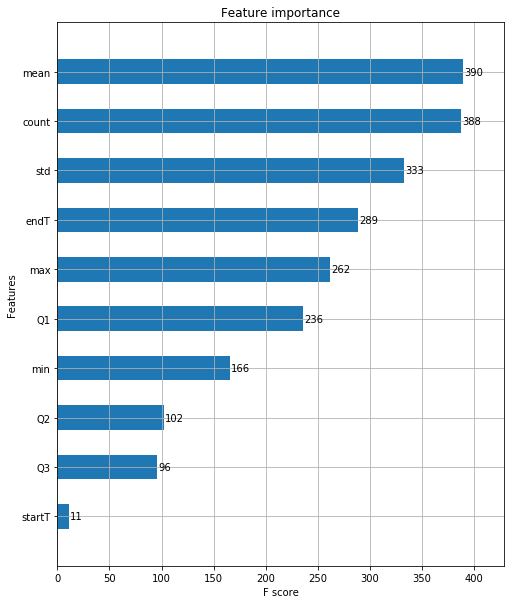

In [26]:
### 特征重要性

fig,ax = plt.subplots(figsize=(8,10))
plot_importance(xgb_model,height=0.5,max_num_features=64,ax=ax)
plt.show()

46  test_y 49 ; test_y_predicted 32 ; test_data_index 1480
348  test_y 15 ; test_y_predicted 11 ; test_data_index 150


<Figure size 1600x1280 with 0 Axes>

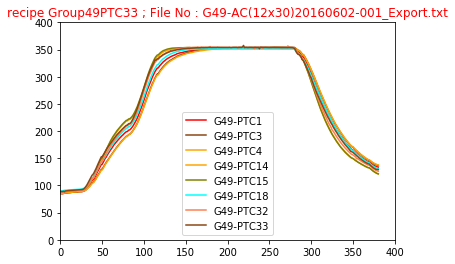

<Figure size 1600x1280 with 0 Axes>

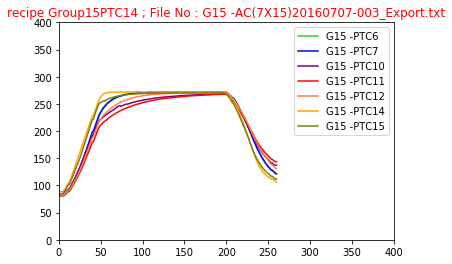

In [30]:
for i in range(len(xgb_test_y)):
    if xgb_test_y[i] != xgb_pred_y[i]:
        print(i , ' test_y', xgb_test_y[i], '; test_y_predicted', 
              xgb_pred_y[i], '; test_data_index', xgb_test_x.index[i])
        amisMatchFilePath = myDriveFilePath + 'G'+ str(xgb_test_y[i]) + '/' + rgdf.loc[rgdf.index[xgb_test_x.index[i]] , 'filename']
        misdf = readRecipeGroupFile(amisMatchFilePath)
        plotRecipeGroupFileCurve(misdf,str(xgb_test_y[i]) +  rgdf.loc[rgdf.index[xgb_test_x.index[i]], 'PTCno'],  rgdf.loc[rgdf.index[xgb_test_x.index[i]], 'filename'])


## Prediction Exam - 0722 Dataset 36 sample

In [109]:
# exman File 

import pandas as pd

_logFlag = False
_plotFlag = False
_plotRecipeGroup = 7

examdf = pd.DataFrame(columns=rgColumns)

aExamFileList = getExamFileList()
  
rangej = np.arange(len(aExamFileList))
  
for j in rangej:
    edf = readRecipeGroupFile(aExamFileList[j])
    rangek = np.arange(len(edf.columns))
    
    for k in rangek:
    
        aFileAttributeList = getFileAttributeList(os.path.basename(aExamFileList[j]), False)     

        aPTCno = edf.columns[k].strip()      
        aFileAttributeList.append(aPTCno[aPTCno.find('PTC'): len(aPTCno)])                   #6. PTCno
        aFileAttributeList.append(edf.count()[k])                   #7. count
        aFileAttributeList.append(edf.mean()[k])                    #8. mean
        aFileAttributeList.append(edf.std()[k])                     #9. std
        aFileAttributeList.append(edf.min()[k])                     #10. min
        aFileAttributeList.append(edf.quantile(0.25)[k])            #11. Q1 25%
        aFileAttributeList.append(edf.quantile(0.5)[k])             #12. Q2 50%
        aFileAttributeList.append(edf.quantile(0.75)[k])            #13. Q3 75%
        aFileAttributeList.append(edf.max()[k])                     #14. max
        aFileAttributeList.append(edf.median()[k])                  #15. median
        #aFileAttributeList.append()   #16. start2max_time
        #aFileAttributeList.append()   #17. stable_time
        #aFileAttributeList.append()   #18. max2end_time
        #aFileAttributeList.append()   #19. totaltime

        if j == 0 and _logFlag == True:
            print(aFileAttributeList)

        examdf = examdf.append(pd.DataFrame([aFileAttributeList], columns=rgColumns),ignore_index=True) 

        # plot the same recipe group all file curve
        if i == _plotRecipeGroup and _plotFlag == True:        
            plotRecipeGroupFileCurve(examdf, ' ', aExamFileList[j])
      
examdf.describe()

,mean,std,min,Q1,Q2,Q3,max,median
count,276.000000,276.000000,276.000000,276.000000,276.000000,276.000000,276.000000,276.000000
mean,226.149534,76.509530,75.899638,158.348913,259.369928,295.694203,298.330072,259.369928
std,31.173450,17.101284,9.592677,19.729394,47.302535,43.850275,42.924229,47.302535
min,182.951232,52.018406,0.000000,111.200000,179.500000,247.975000,249.600000,179.500000
25%,202.996052,62.225377,72.875000,158.012500,223.787500,259.668750,264.100000,223.787500
50%,216.629857,69.175375,75.800000,163.325000,249.925000,269.687500,271.150000,249.925000
75%,258.017422,96.275169,79.000000,168.187500,306.325000,349.781250,350.850000,306.325000
max,278.883200,102.596601,99.700000,204.175000,336.100000,356.300000,360.500000,336.100000


In [111]:
examdf_data = examdf.drop(['filename','groupid','eqpid','PTCno','sno', 'date'], axis = 1)
examdf_data.head(3)

,count,mean,std,min,Q1,Q2,Q3,max,median
0,236,274.999576,93.706698,0.0,199.600,325.50,354.025,354.4,325.50
1,236,276.022034,91.630950,73.9,203.450,324.95,354.125,354.4,324.95
2,236,273.788983,93.750336,72.2,199.675,323.75,354.300,354.7,323.75


In [112]:
# 預測
exam_predicted = rg_clf.predict(examdf_data)
exam_predicted

array(['G11', 'G11', 'G11', 'G11', 'G11', 'G17', 'G17', 'G17', 'G17',
       'G17', 'G17', 'G17', 'G17', 'G19', 'G19', 'G19', 'G19', 'G19',
       'G19', 'G19', 'G19', 'G19', 'G19', 'G19', 'G19', 'G19', 'G19',
       'G19', 'G19', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32',
       'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32',
       'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32',
       'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32',
       'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32', 'G32',
       'G32', 'G32', 'G32', 'G32', 'G32', 'G34', 'G34', 'G34', 'G34',
       'G34', 'G34', 'G34', 'G34', 'G11', 'G11', 'G11', 'G11', 'G11',
       'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34',
       'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34',
       'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34',
       'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34', 'G34',
       'G34', 'G34',

C:\Users\AutoUser\Anaconda3\lib\site-packages\ipykernel\__main__.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\AutoUser\Anaconda3\lib\site-packages\ipykernel\__main__.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 1600x1280 with 0 Axes>

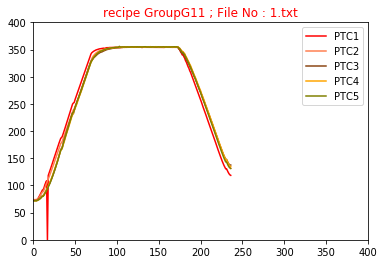

<Figure size 1600x1280 with 0 Axes>

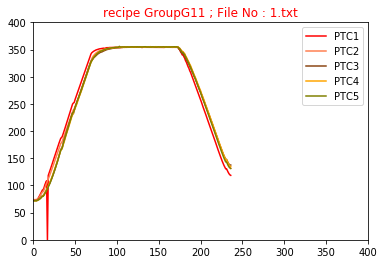

<Figure size 1600x1280 with 0 Axes>

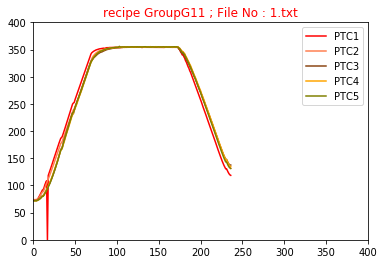

<Figure size 1600x1280 with 0 Axes>

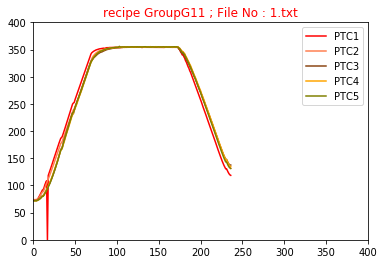

<Figure size 1600x1280 with 0 Axes>

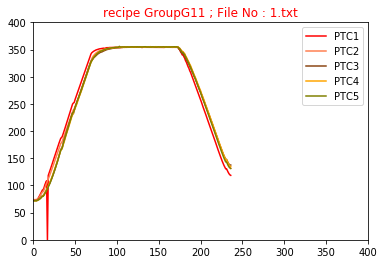

<Figure size 1600x1280 with 0 Axes>

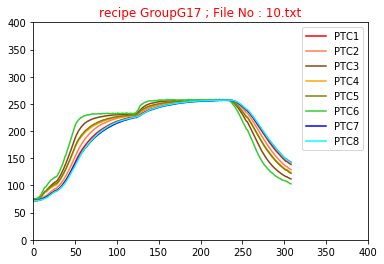

<Figure size 1600x1280 with 0 Axes>

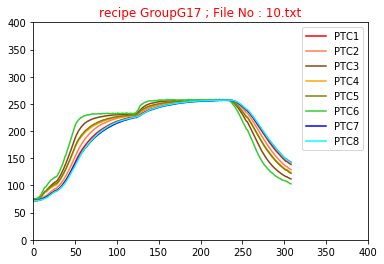

<Figure size 1600x1280 with 0 Axes>

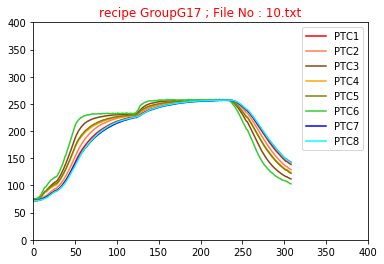

<Figure size 1600x1280 with 0 Axes>

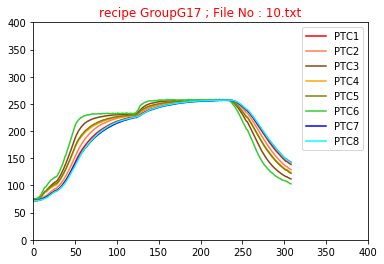

<Figure size 1600x1280 with 0 Axes>

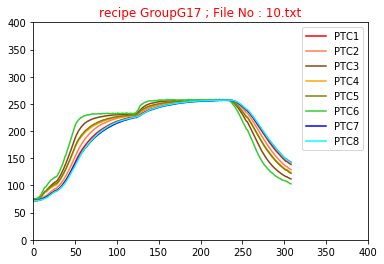

<Figure size 1600x1280 with 0 Axes>

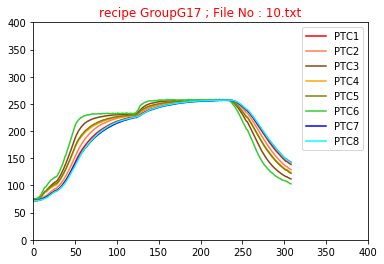

<Figure size 1600x1280 with 0 Axes>

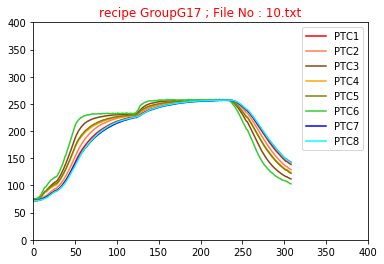

<Figure size 1600x1280 with 0 Axes>

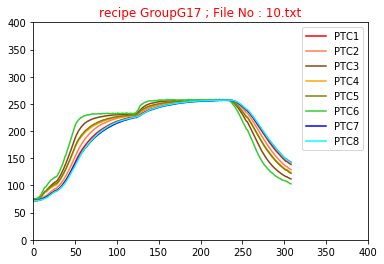

<Figure size 1600x1280 with 0 Axes>

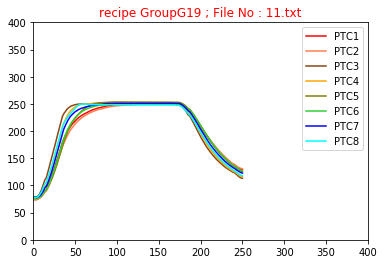

<Figure size 1600x1280 with 0 Axes>

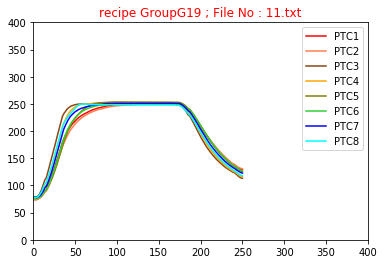

<Figure size 1600x1280 with 0 Axes>

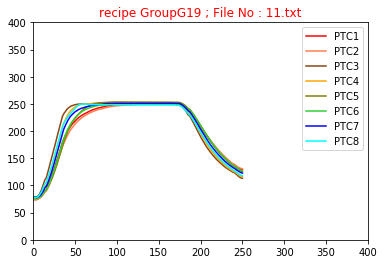

<Figure size 1600x1280 with 0 Axes>

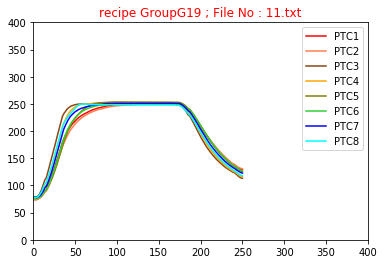

<Figure size 1600x1280 with 0 Axes>

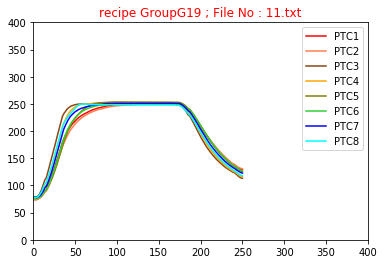

<Figure size 1600x1280 with 0 Axes>

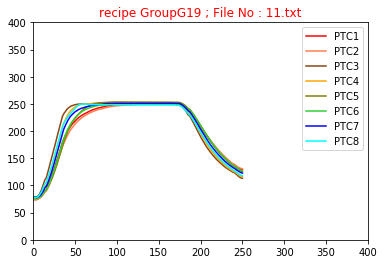

<Figure size 1600x1280 with 0 Axes>

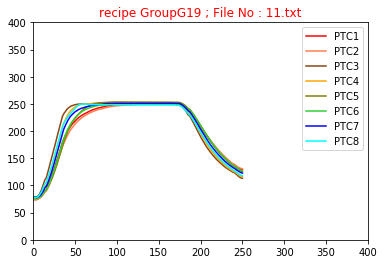

<Figure size 1600x1280 with 0 Axes>

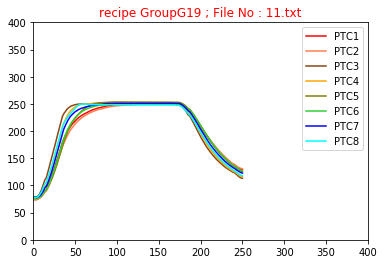

<Figure size 1600x1280 with 0 Axes>

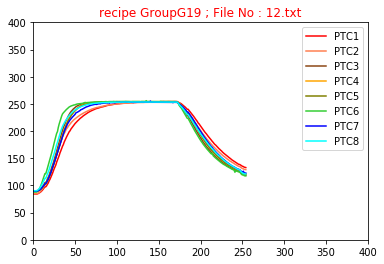

<Figure size 1600x1280 with 0 Axes>

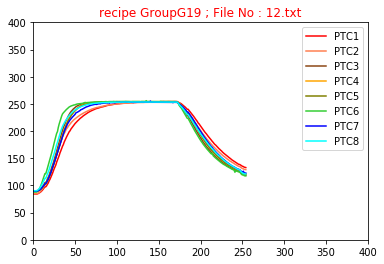

<Figure size 1600x1280 with 0 Axes>

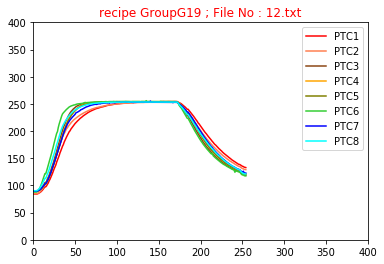

<Figure size 1600x1280 with 0 Axes>

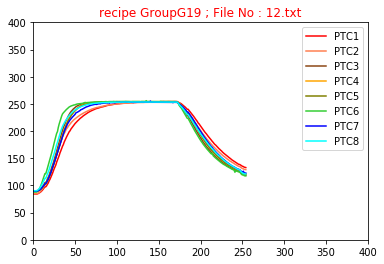

<Figure size 1600x1280 with 0 Axes>

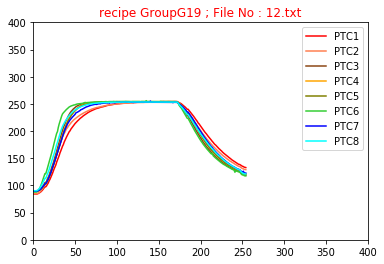

<Figure size 1600x1280 with 0 Axes>

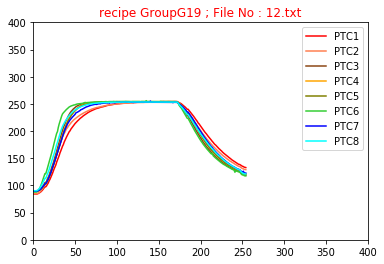

<Figure size 1600x1280 with 0 Axes>

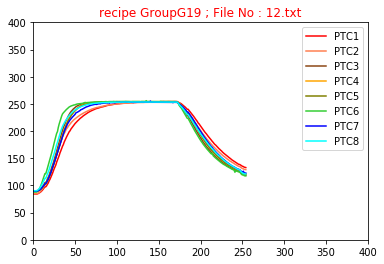

<Figure size 1600x1280 with 0 Axes>

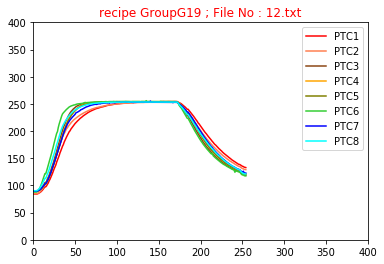

<Figure size 1600x1280 with 0 Axes>

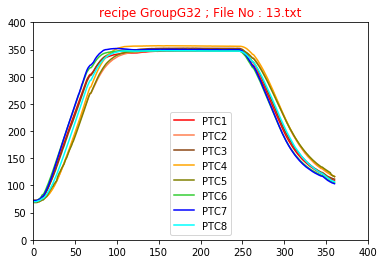

<Figure size 1600x1280 with 0 Axes>

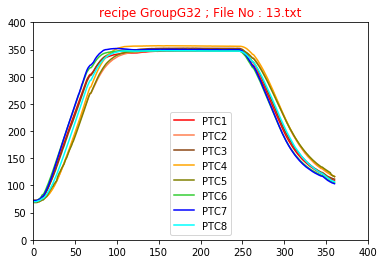

<Figure size 1600x1280 with 0 Axes>

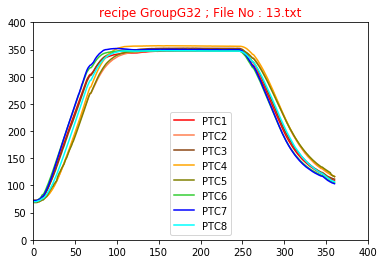

<Figure size 1600x1280 with 0 Axes>

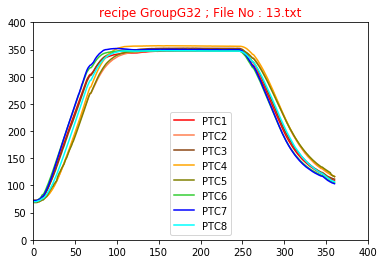

<Figure size 1600x1280 with 0 Axes>

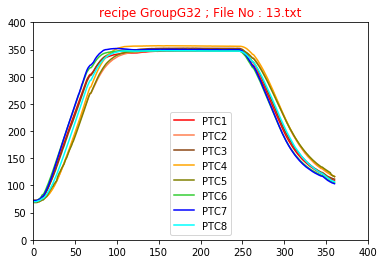

<Figure size 1600x1280 with 0 Axes>

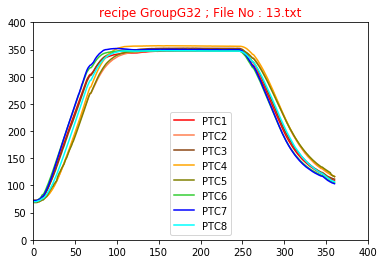

<Figure size 1600x1280 with 0 Axes>

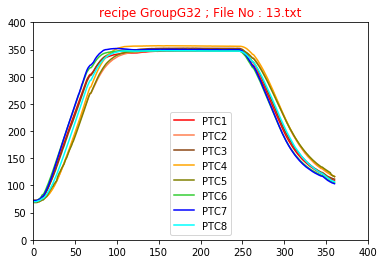

<Figure size 1600x1280 with 0 Axes>

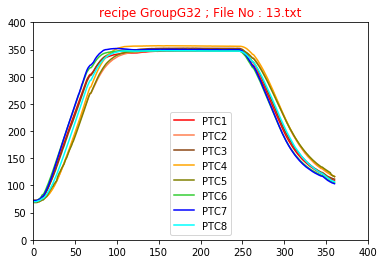

<Figure size 1600x1280 with 0 Axes>

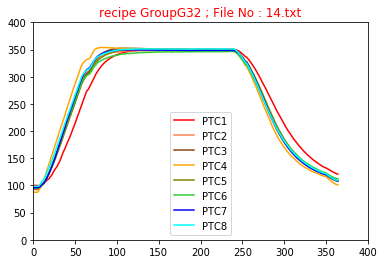

<Figure size 1600x1280 with 0 Axes>

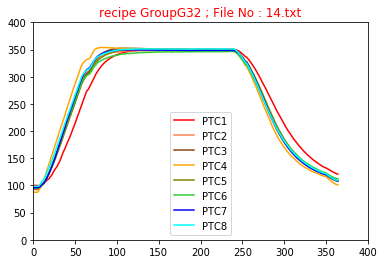

<Figure size 1600x1280 with 0 Axes>

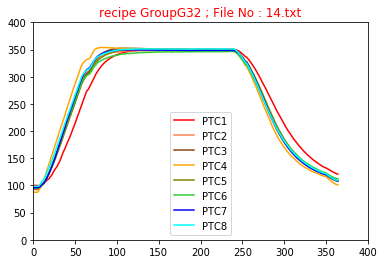

<Figure size 1600x1280 with 0 Axes>

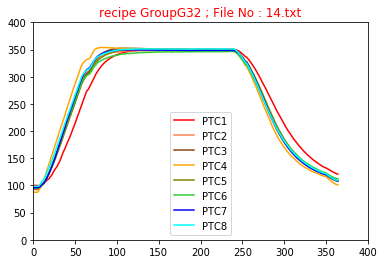

<Figure size 1600x1280 with 0 Axes>

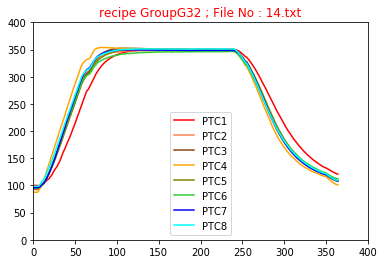

<Figure size 1600x1280 with 0 Axes>

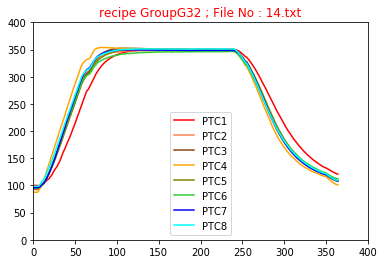

<Figure size 1600x1280 with 0 Axes>

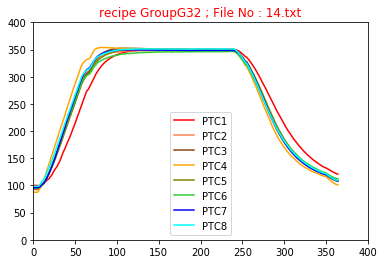

<Figure size 1600x1280 with 0 Axes>

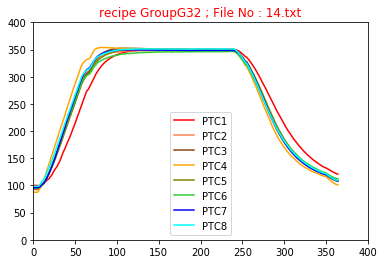

<Figure size 1600x1280 with 0 Axes>

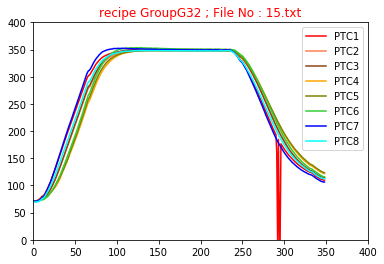

<Figure size 1600x1280 with 0 Axes>

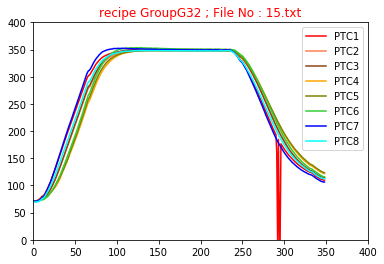

<Figure size 1600x1280 with 0 Axes>

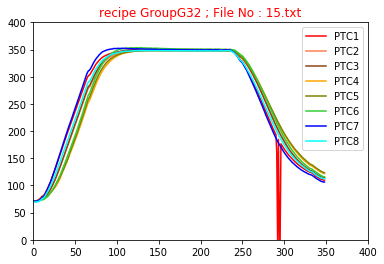

<Figure size 1600x1280 with 0 Axes>

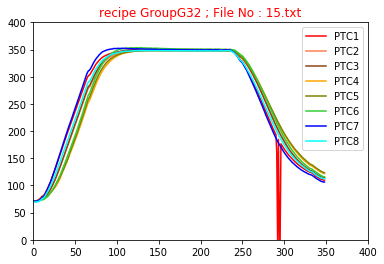

<Figure size 1600x1280 with 0 Axes>

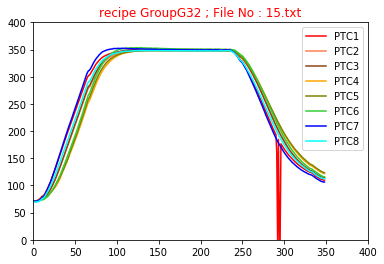

<Figure size 1600x1280 with 0 Axes>

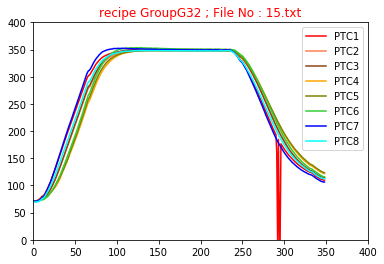

<Figure size 1600x1280 with 0 Axes>

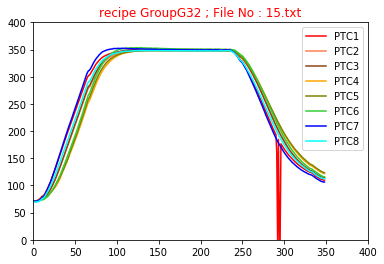

<Figure size 1600x1280 with 0 Axes>

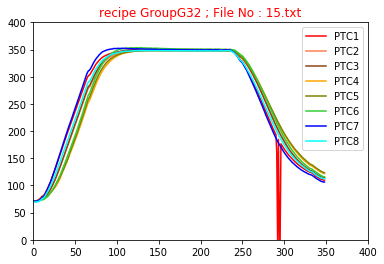

<Figure size 1600x1280 with 0 Axes>

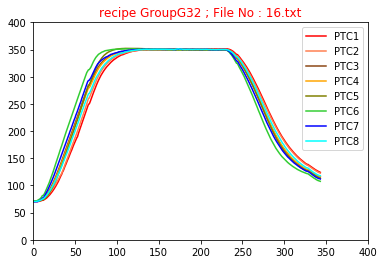

<Figure size 1600x1280 with 0 Axes>

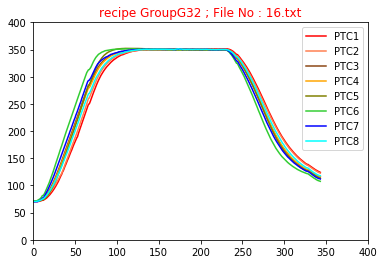

<Figure size 1600x1280 with 0 Axes>

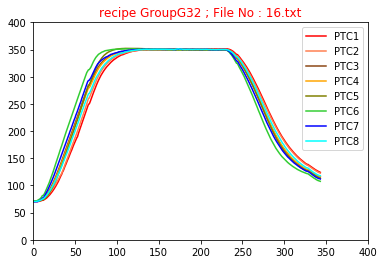

<Figure size 1600x1280 with 0 Axes>

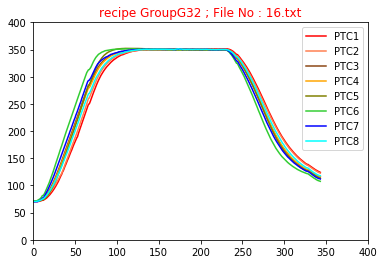

<Figure size 1600x1280 with 0 Axes>

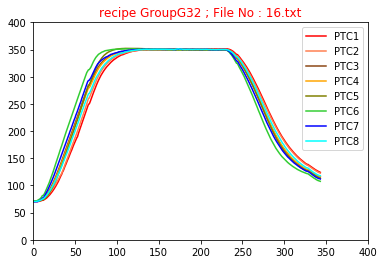

<Figure size 1600x1280 with 0 Axes>

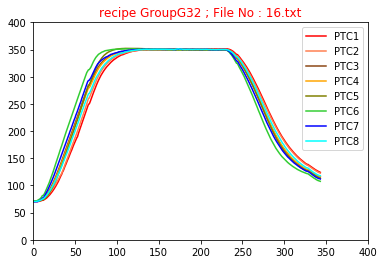

<Figure size 1600x1280 with 0 Axes>

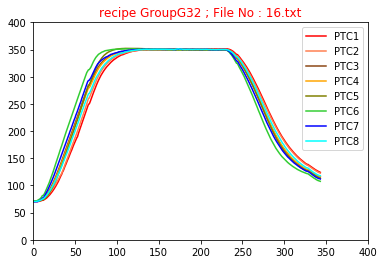

<Figure size 1600x1280 with 0 Axes>

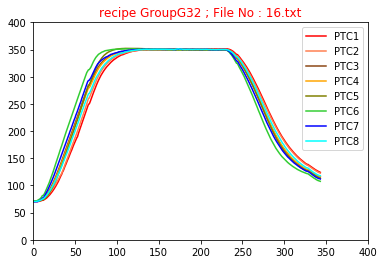

<Figure size 1600x1280 with 0 Axes>

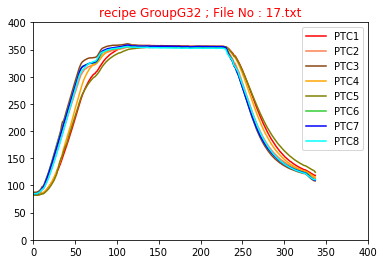

<Figure size 1600x1280 with 0 Axes>

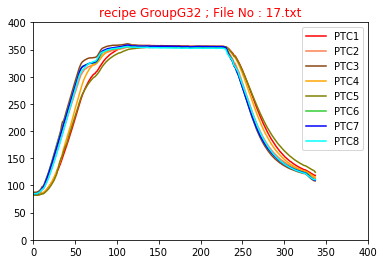

<Figure size 1600x1280 with 0 Axes>

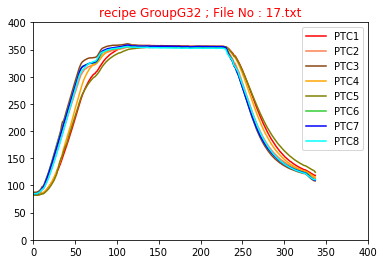

<Figure size 1600x1280 with 0 Axes>

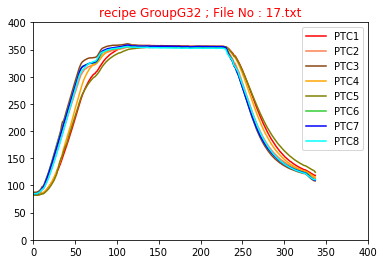

<Figure size 1600x1280 with 0 Axes>

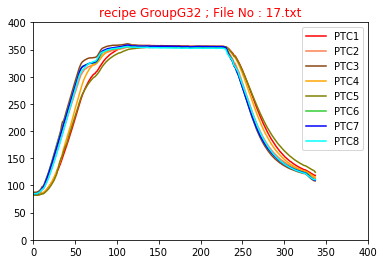

<Figure size 1600x1280 with 0 Axes>

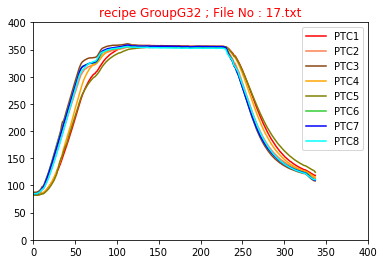

<Figure size 1600x1280 with 0 Axes>

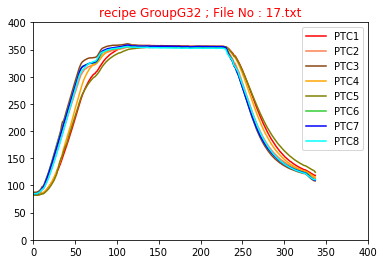

<Figure size 1600x1280 with 0 Axes>

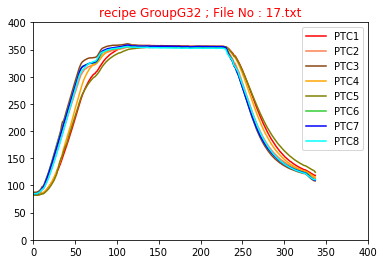

<Figure size 1600x1280 with 0 Axes>

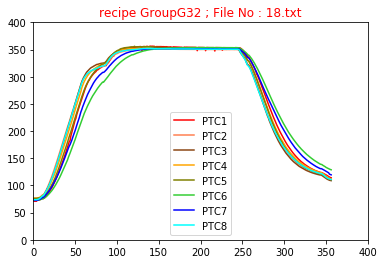

<Figure size 1600x1280 with 0 Axes>

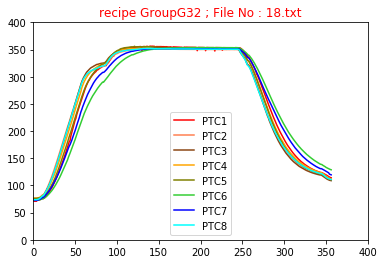

<Figure size 1600x1280 with 0 Axes>

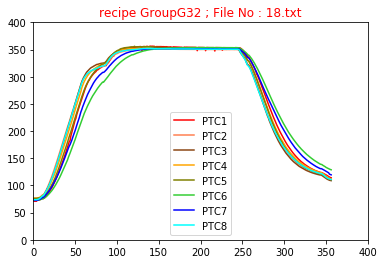

<Figure size 1600x1280 with 0 Axes>

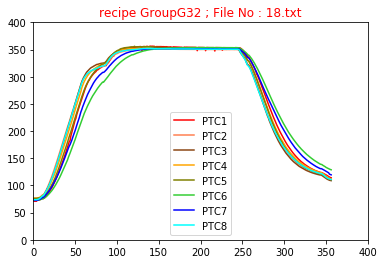

<Figure size 1600x1280 with 0 Axes>

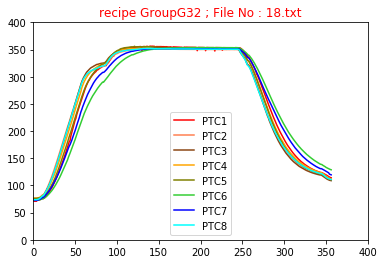

<Figure size 1600x1280 with 0 Axes>

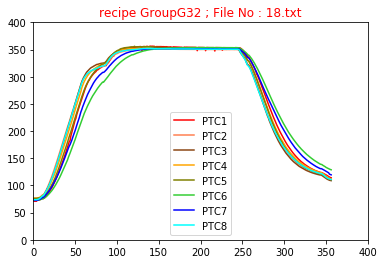

<Figure size 1600x1280 with 0 Axes>

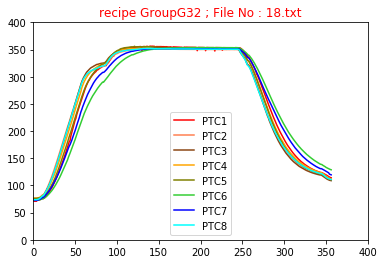

<Figure size 1600x1280 with 0 Axes>

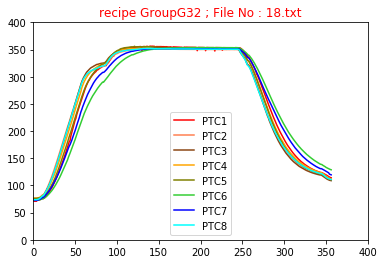

<Figure size 1600x1280 with 0 Axes>

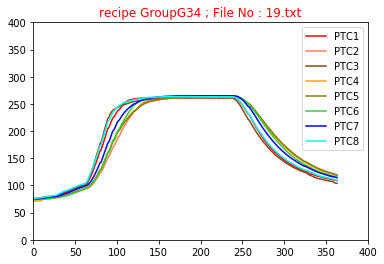

<Figure size 1600x1280 with 0 Axes>

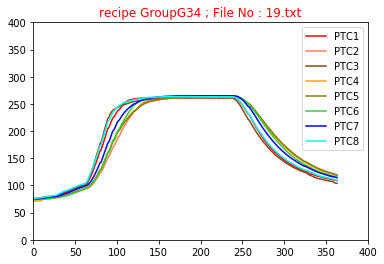

<Figure size 1600x1280 with 0 Axes>

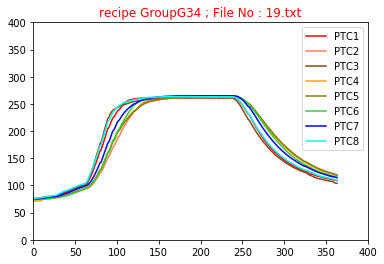

<Figure size 1600x1280 with 0 Axes>

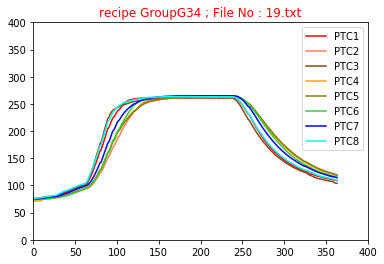

<Figure size 1600x1280 with 0 Axes>

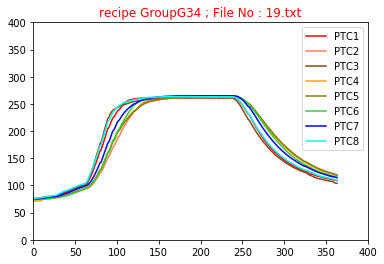

<Figure size 1600x1280 with 0 Axes>

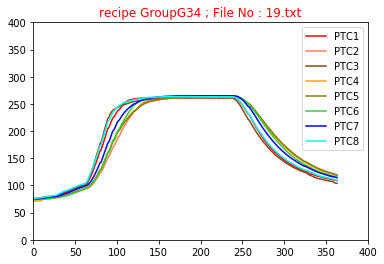

<Figure size 1600x1280 with 0 Axes>

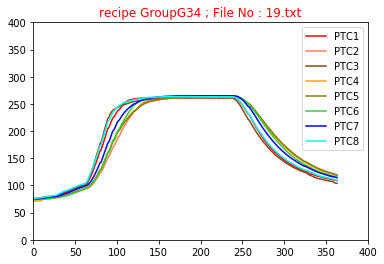

<Figure size 1600x1280 with 0 Axes>

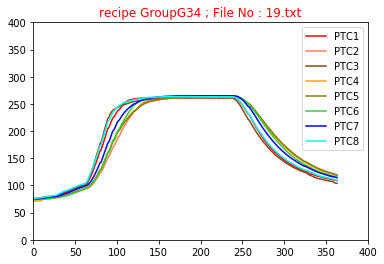

<Figure size 1600x1280 with 0 Axes>

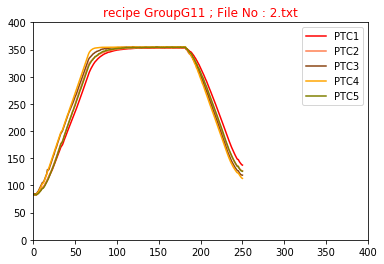

<Figure size 1600x1280 with 0 Axes>

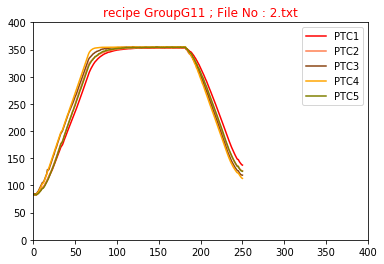

<Figure size 1600x1280 with 0 Axes>

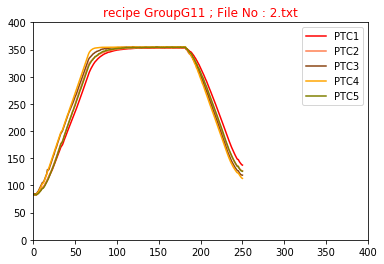

<Figure size 1600x1280 with 0 Axes>

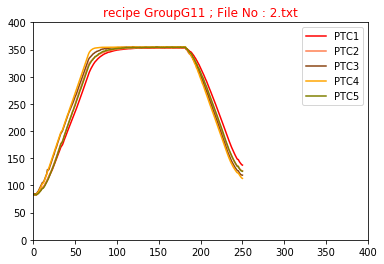

<Figure size 1600x1280 with 0 Axes>

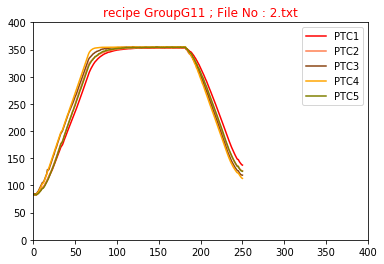

<Figure size 1600x1280 with 0 Axes>

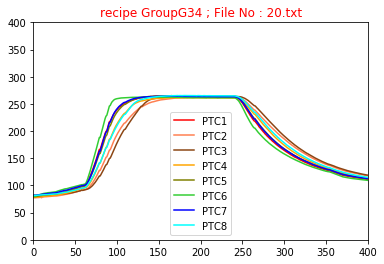

<Figure size 1600x1280 with 0 Axes>

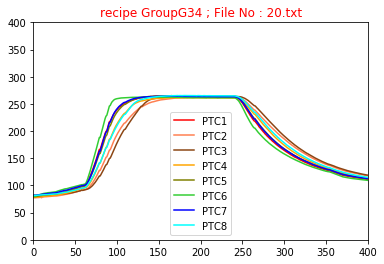

<Figure size 1600x1280 with 0 Axes>

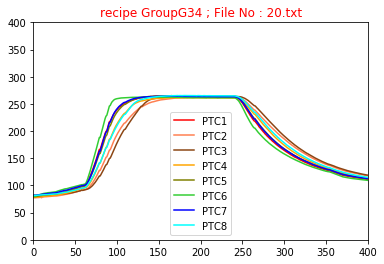

<Figure size 1600x1280 with 0 Axes>

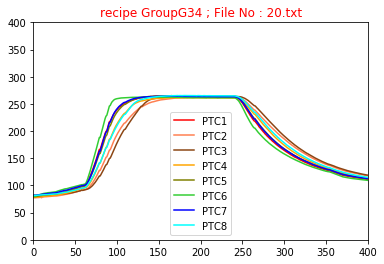

<Figure size 1600x1280 with 0 Axes>

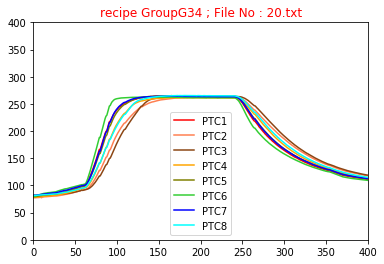

<Figure size 1600x1280 with 0 Axes>

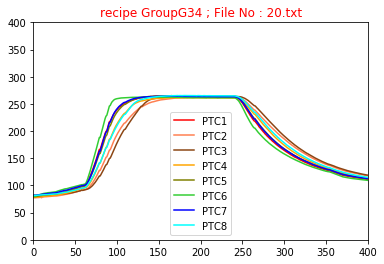

<Figure size 1600x1280 with 0 Axes>

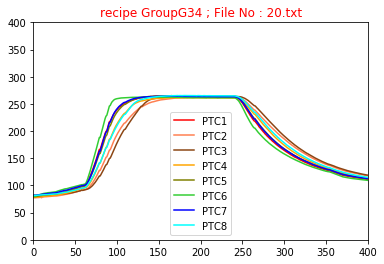

<Figure size 1600x1280 with 0 Axes>

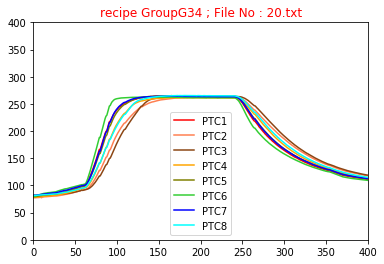

<Figure size 1600x1280 with 0 Axes>

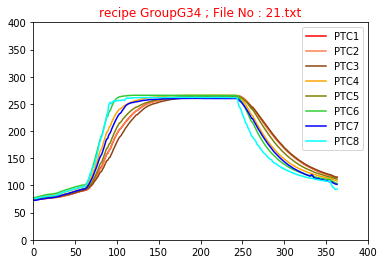

<Figure size 1600x1280 with 0 Axes>

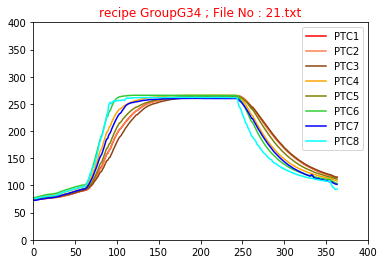

<Figure size 1600x1280 with 0 Axes>

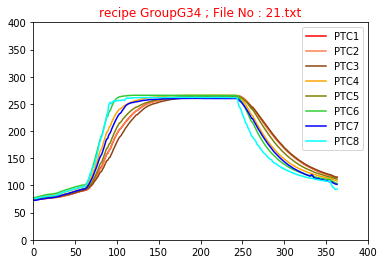

<Figure size 1600x1280 with 0 Axes>

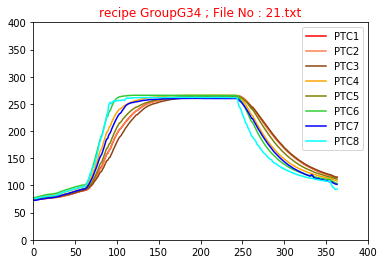

<Figure size 1600x1280 with 0 Axes>

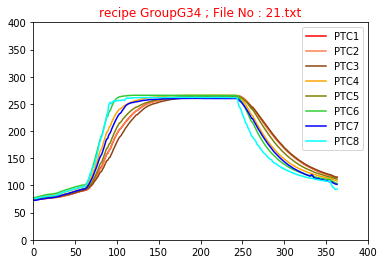

<Figure size 1600x1280 with 0 Axes>

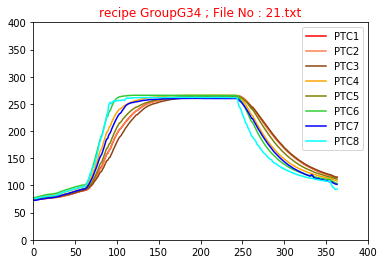

<Figure size 1600x1280 with 0 Axes>

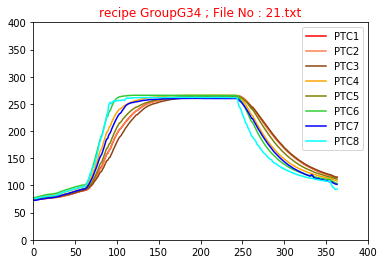

<Figure size 1600x1280 with 0 Axes>

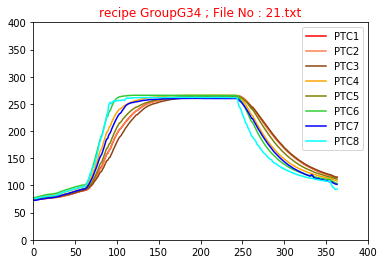

<Figure size 1600x1280 with 0 Axes>

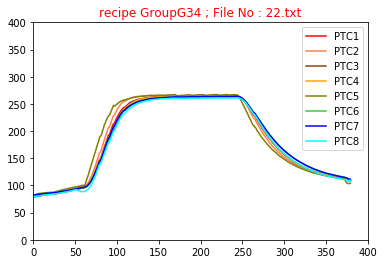

<Figure size 1600x1280 with 0 Axes>

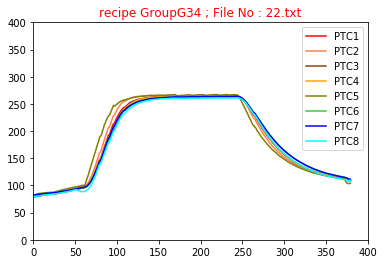

<Figure size 1600x1280 with 0 Axes>

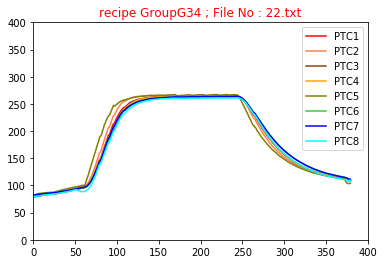

<Figure size 1600x1280 with 0 Axes>

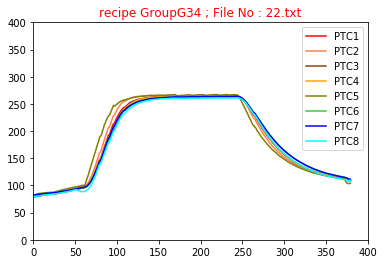

<Figure size 1600x1280 with 0 Axes>

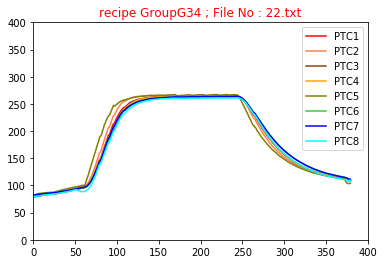

<Figure size 1600x1280 with 0 Axes>

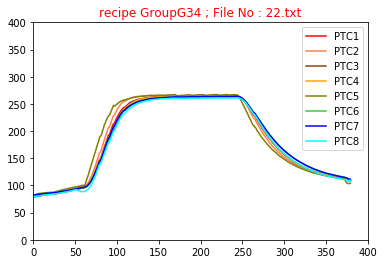

<Figure size 1600x1280 with 0 Axes>

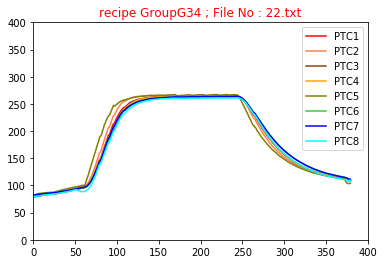

<Figure size 1600x1280 with 0 Axes>

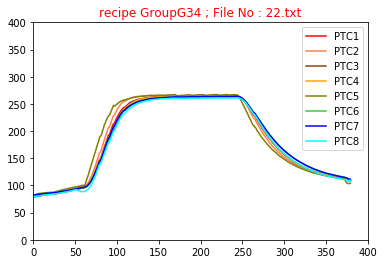

<Figure size 1600x1280 with 0 Axes>

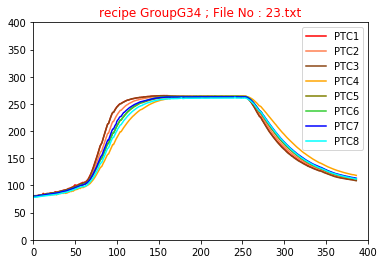

<Figure size 1600x1280 with 0 Axes>

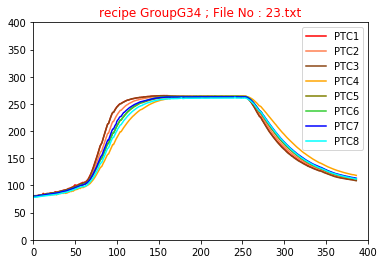

<Figure size 1600x1280 with 0 Axes>

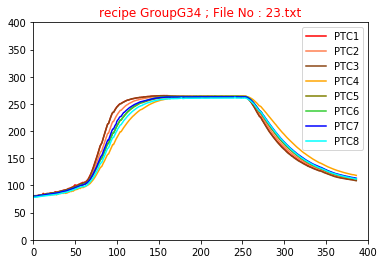

<Figure size 1600x1280 with 0 Axes>

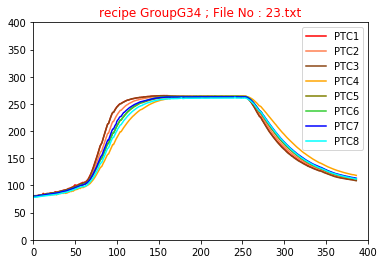

<Figure size 1600x1280 with 0 Axes>

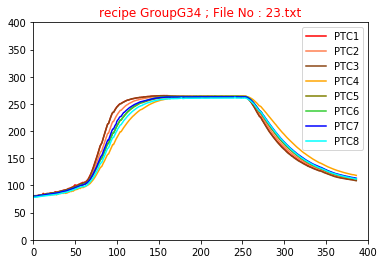

<Figure size 1600x1280 with 0 Axes>

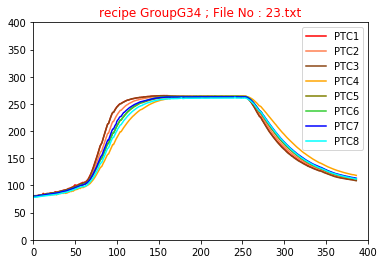

<Figure size 1600x1280 with 0 Axes>

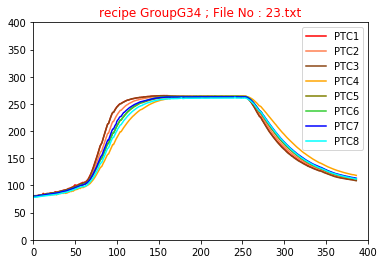

<Figure size 1600x1280 with 0 Axes>

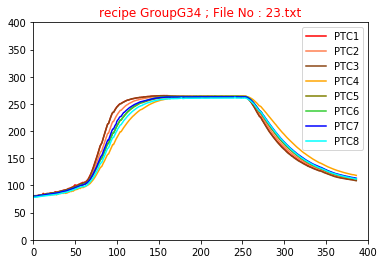

<Figure size 1600x1280 with 0 Axes>

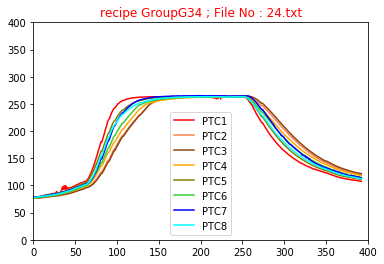

<Figure size 1600x1280 with 0 Axes>

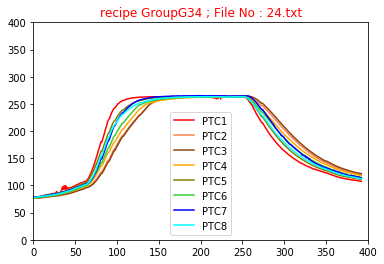

<Figure size 1600x1280 with 0 Axes>

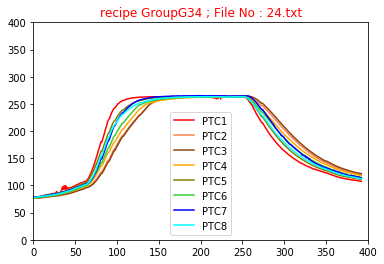

<Figure size 1600x1280 with 0 Axes>

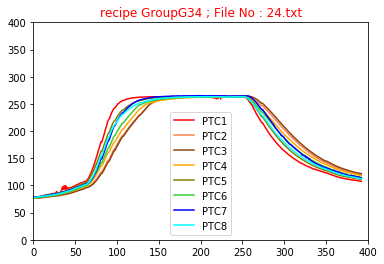

<Figure size 1600x1280 with 0 Axes>

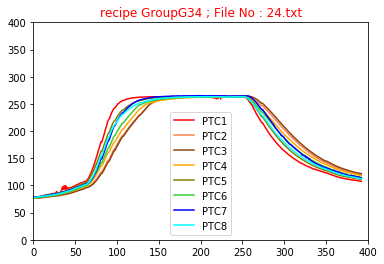

<Figure size 1600x1280 with 0 Axes>

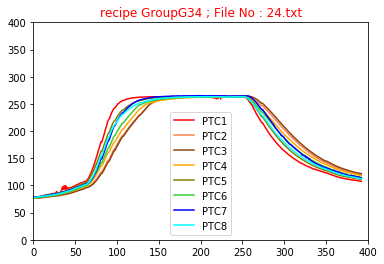

<Figure size 1600x1280 with 0 Axes>

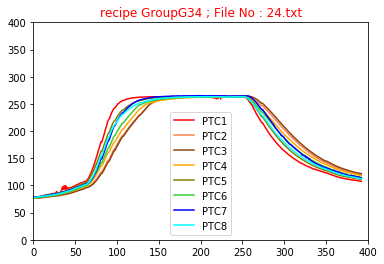

<Figure size 1600x1280 with 0 Axes>

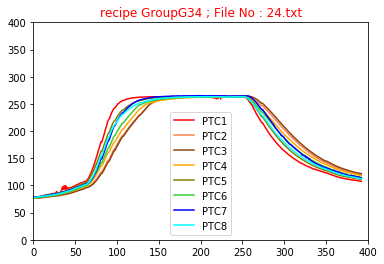

<Figure size 1600x1280 with 0 Axes>

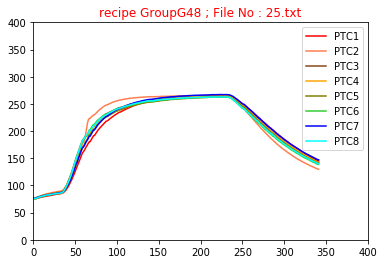

<Figure size 1600x1280 with 0 Axes>

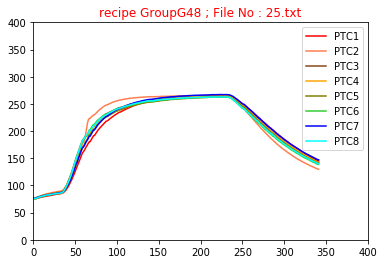

<Figure size 1600x1280 with 0 Axes>

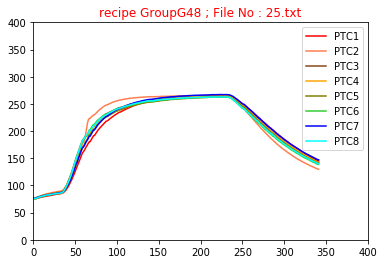

<Figure size 1600x1280 with 0 Axes>

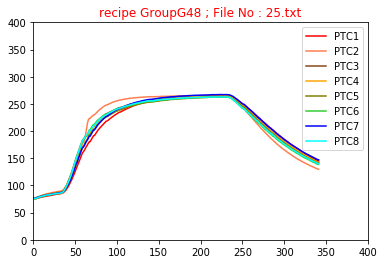

<Figure size 1600x1280 with 0 Axes>

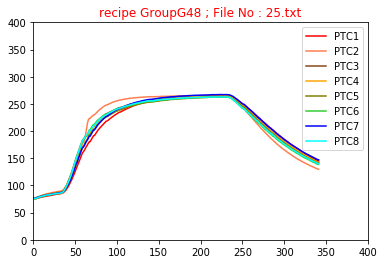

<Figure size 1600x1280 with 0 Axes>

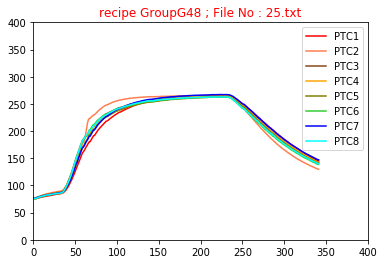

<Figure size 1600x1280 with 0 Axes>

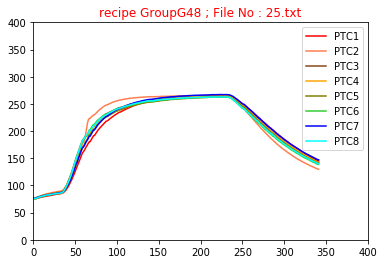

<Figure size 1600x1280 with 0 Axes>

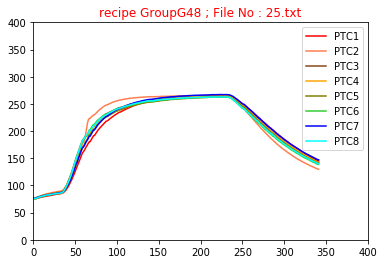

<Figure size 1600x1280 with 0 Axes>

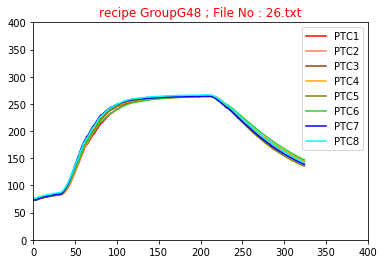

<Figure size 1600x1280 with 0 Axes>

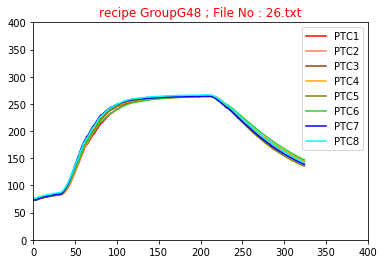

<Figure size 1600x1280 with 0 Axes>

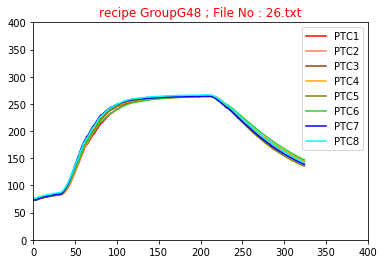

<Figure size 1600x1280 with 0 Axes>

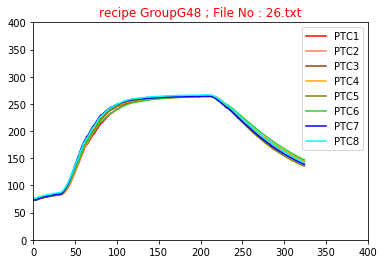

<Figure size 1600x1280 with 0 Axes>

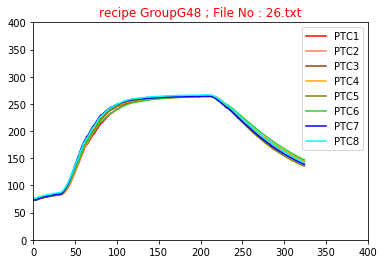

<Figure size 1600x1280 with 0 Axes>

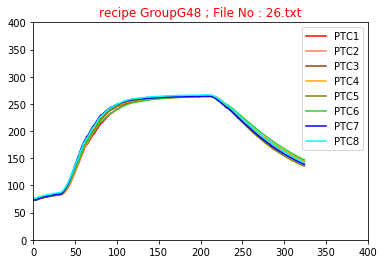

<Figure size 1600x1280 with 0 Axes>

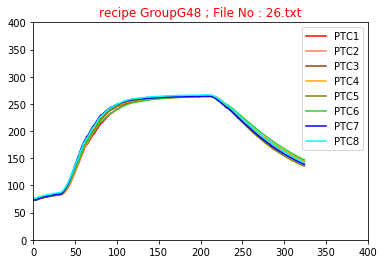

<Figure size 1600x1280 with 0 Axes>

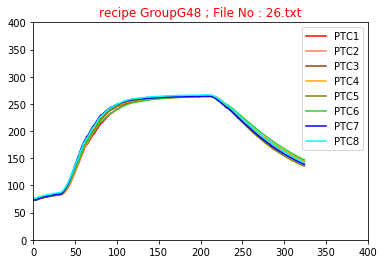

<Figure size 1600x1280 with 0 Axes>

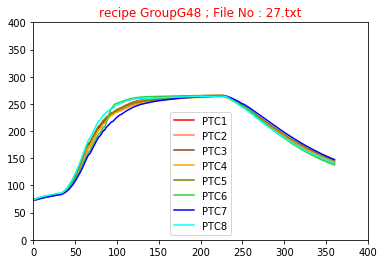

<Figure size 1600x1280 with 0 Axes>

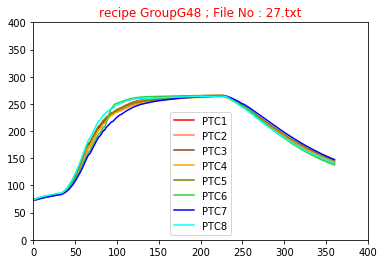

<Figure size 1600x1280 with 0 Axes>

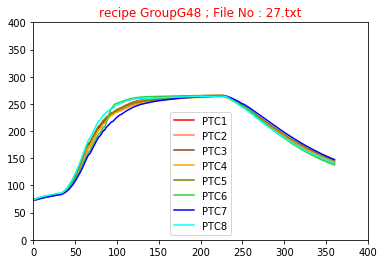

<Figure size 1600x1280 with 0 Axes>

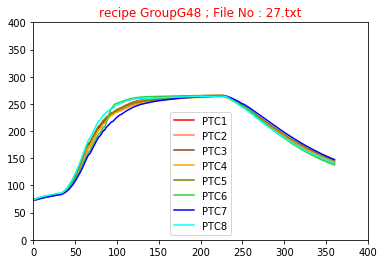

<Figure size 1600x1280 with 0 Axes>

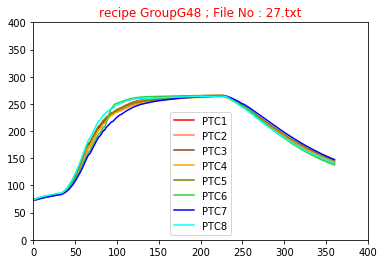

<Figure size 1600x1280 with 0 Axes>

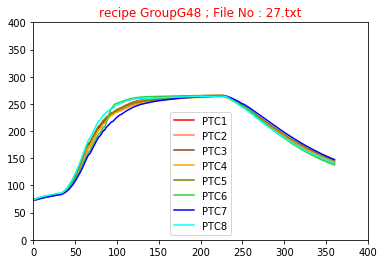

<Figure size 1600x1280 with 0 Axes>

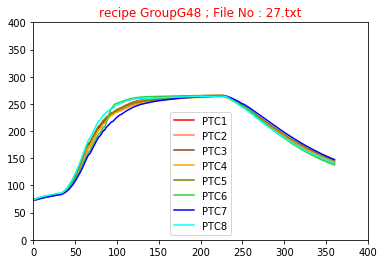

<Figure size 1600x1280 with 0 Axes>

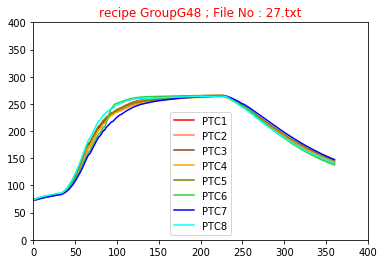

<Figure size 1600x1280 with 0 Axes>

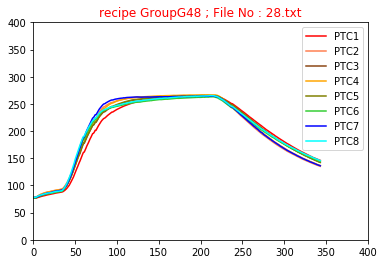

<Figure size 1600x1280 with 0 Axes>

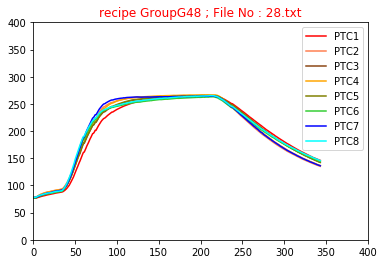

<Figure size 1600x1280 with 0 Axes>

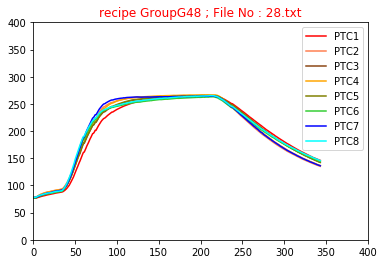

<Figure size 1600x1280 with 0 Axes>

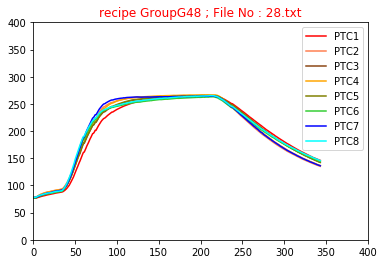

<Figure size 1600x1280 with 0 Axes>

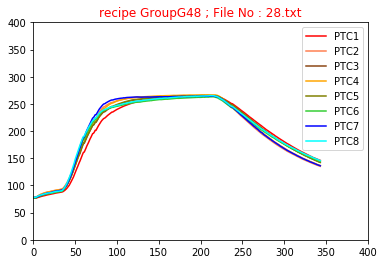

<Figure size 1600x1280 with 0 Axes>

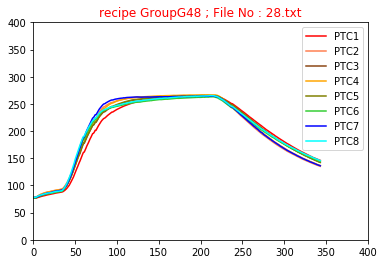

<Figure size 1600x1280 with 0 Axes>

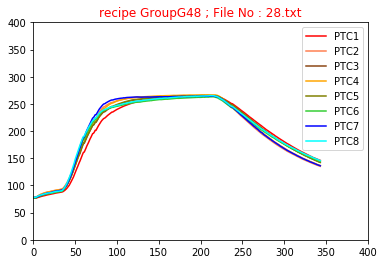

<Figure size 1600x1280 with 0 Axes>

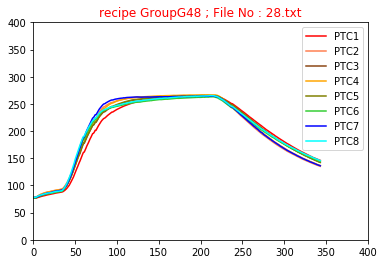

<Figure size 1600x1280 with 0 Axes>

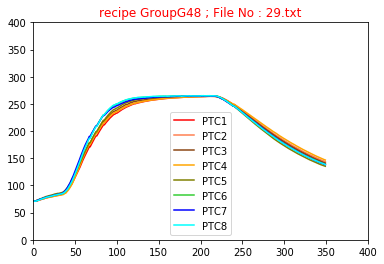

<Figure size 1600x1280 with 0 Axes>

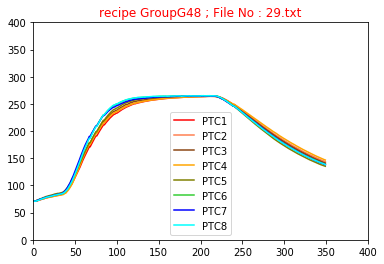

<Figure size 1600x1280 with 0 Axes>

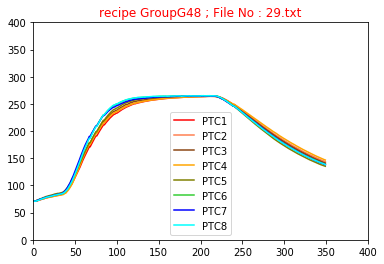

<Figure size 1600x1280 with 0 Axes>

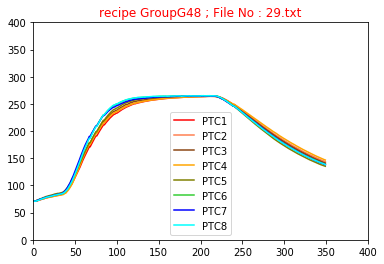

<Figure size 1600x1280 with 0 Axes>

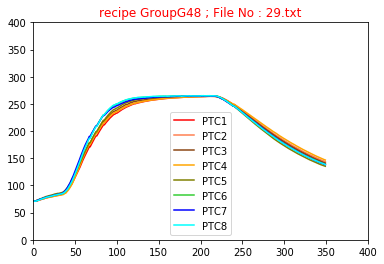

<Figure size 1600x1280 with 0 Axes>

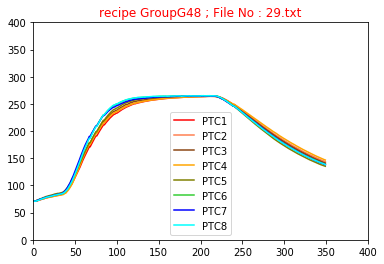

<Figure size 1600x1280 with 0 Axes>

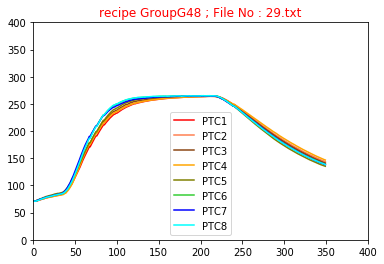

<Figure size 1600x1280 with 0 Axes>

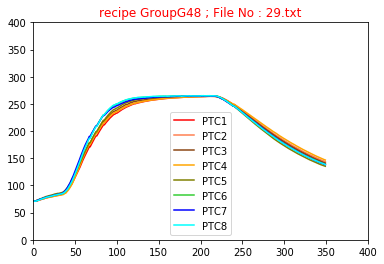

<Figure size 1600x1280 with 0 Axes>

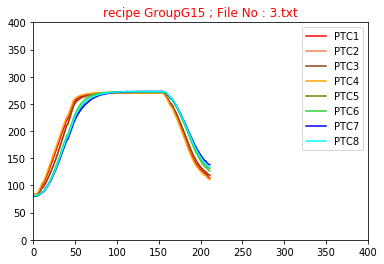

<Figure size 1600x1280 with 0 Axes>

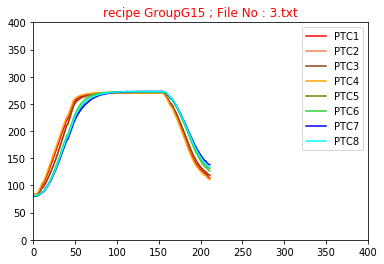

<Figure size 1600x1280 with 0 Axes>

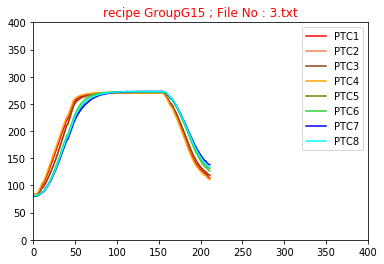

<Figure size 1600x1280 with 0 Axes>

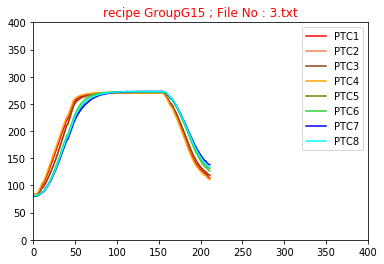

<Figure size 1600x1280 with 0 Axes>

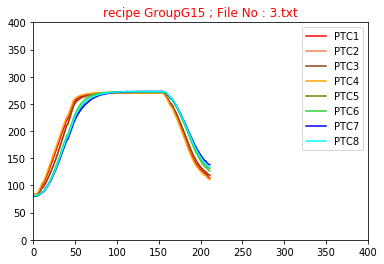

<Figure size 1600x1280 with 0 Axes>

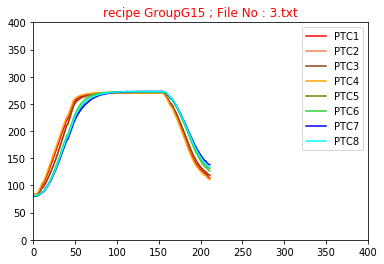

<Figure size 1600x1280 with 0 Axes>

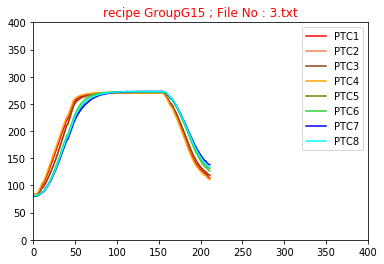

<Figure size 1600x1280 with 0 Axes>

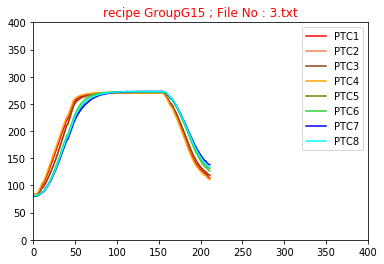

<Figure size 1600x1280 with 0 Axes>

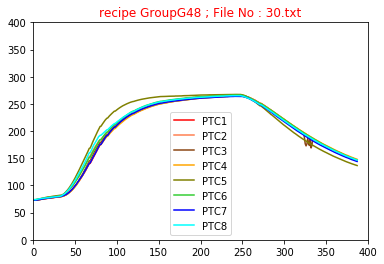

<Figure size 1600x1280 with 0 Axes>

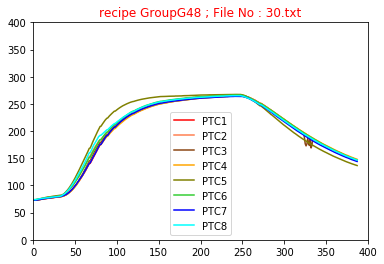

<Figure size 1600x1280 with 0 Axes>

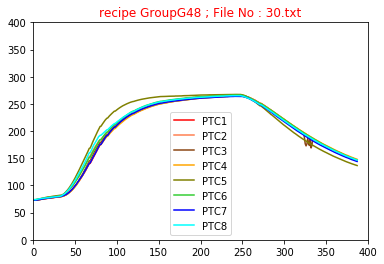

<Figure size 1600x1280 with 0 Axes>

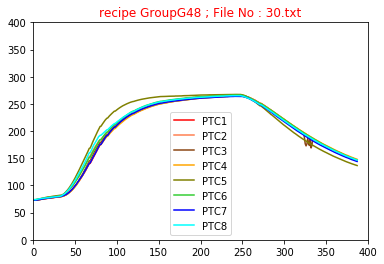

<Figure size 1600x1280 with 0 Axes>

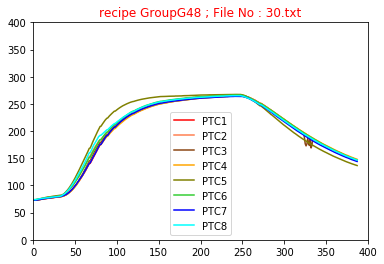

<Figure size 1600x1280 with 0 Axes>

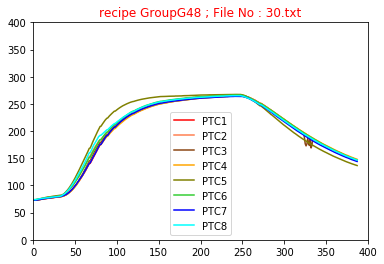

<Figure size 1600x1280 with 0 Axes>

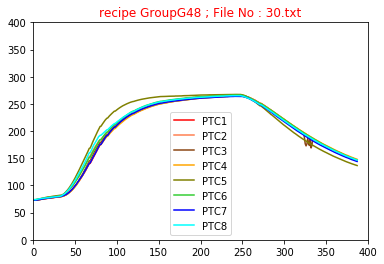

<Figure size 1600x1280 with 0 Axes>

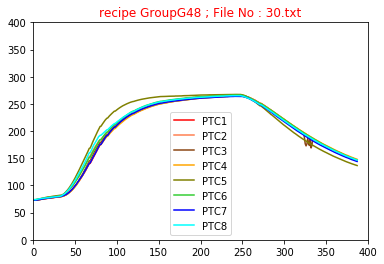

<Figure size 1600x1280 with 0 Axes>

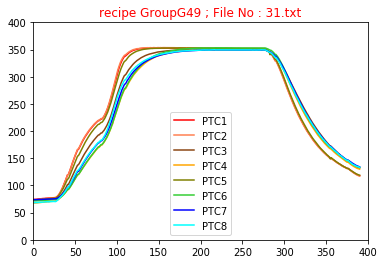

<Figure size 1600x1280 with 0 Axes>

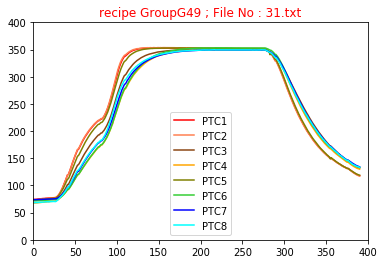

<Figure size 1600x1280 with 0 Axes>

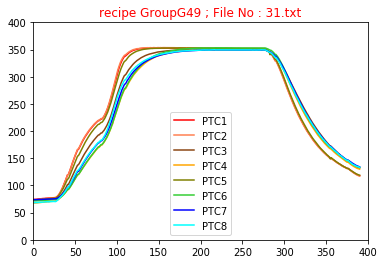

<Figure size 1600x1280 with 0 Axes>

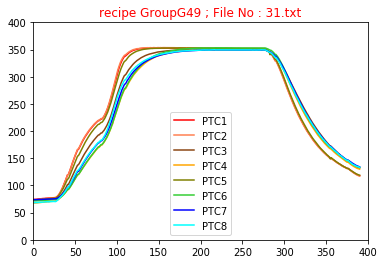

<Figure size 1600x1280 with 0 Axes>

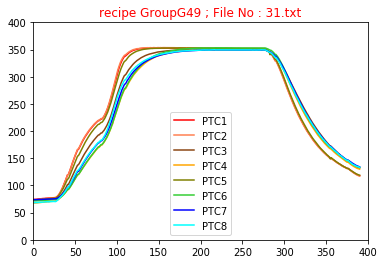

<Figure size 1600x1280 with 0 Axes>

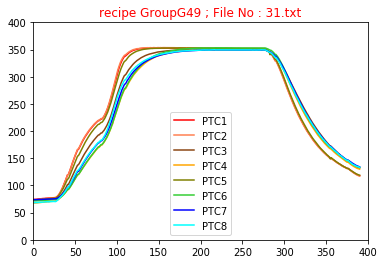

<Figure size 1600x1280 with 0 Axes>

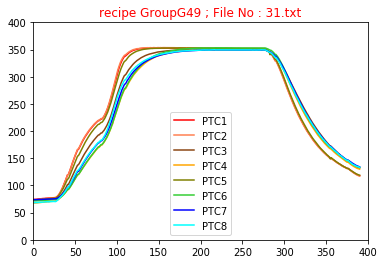

<Figure size 1600x1280 with 0 Axes>

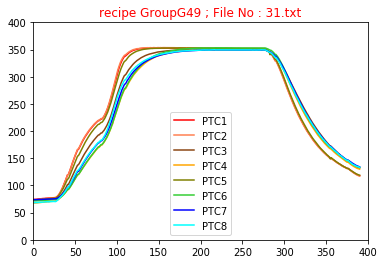

<Figure size 1600x1280 with 0 Axes>

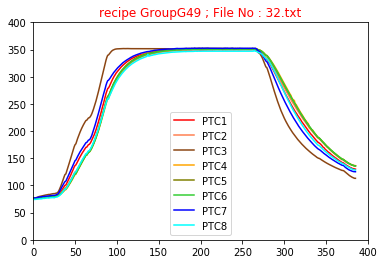

<Figure size 1600x1280 with 0 Axes>

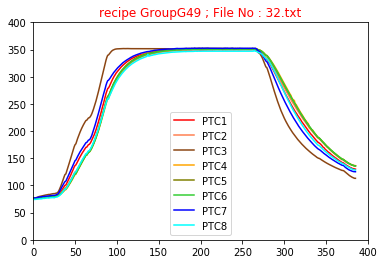

<Figure size 1600x1280 with 0 Axes>

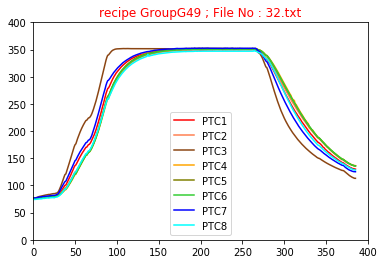

<Figure size 1600x1280 with 0 Axes>

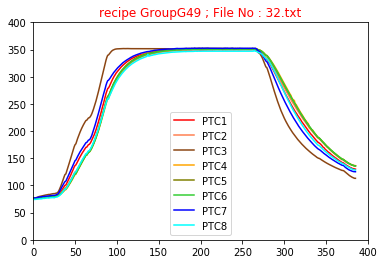

<Figure size 1600x1280 with 0 Axes>

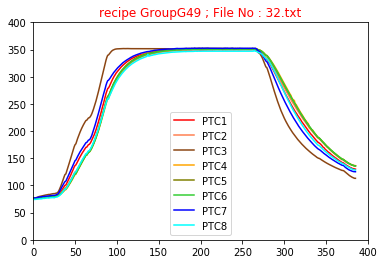

<Figure size 1600x1280 with 0 Axes>

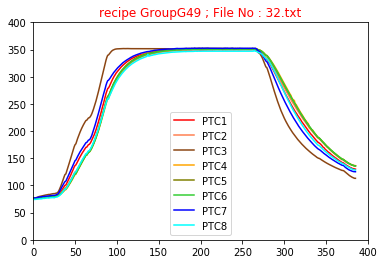

<Figure size 1600x1280 with 0 Axes>

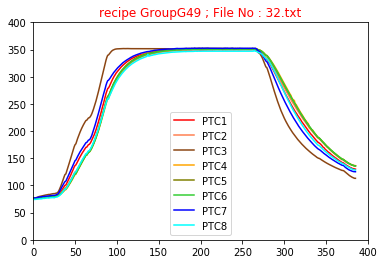

<Figure size 1600x1280 with 0 Axes>

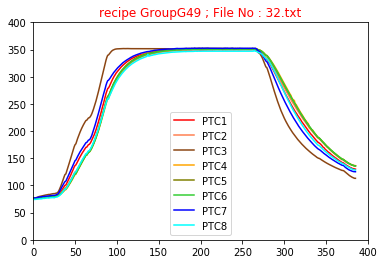

<Figure size 1600x1280 with 0 Axes>

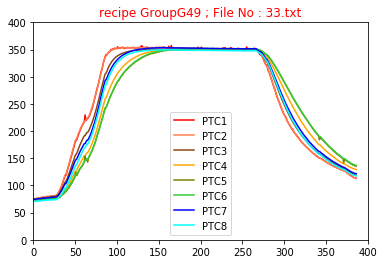

<Figure size 1600x1280 with 0 Axes>

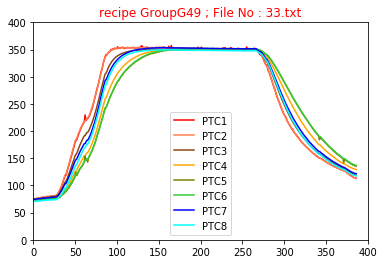

<Figure size 1600x1280 with 0 Axes>

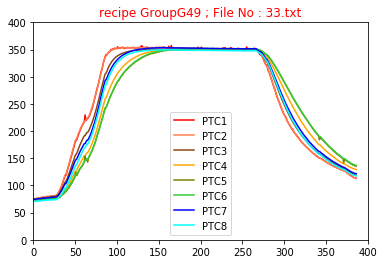

<Figure size 1600x1280 with 0 Axes>

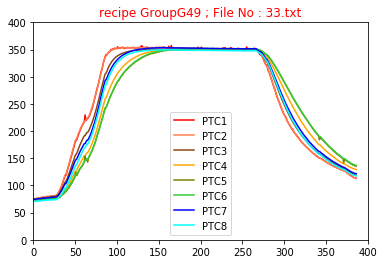

<Figure size 1600x1280 with 0 Axes>

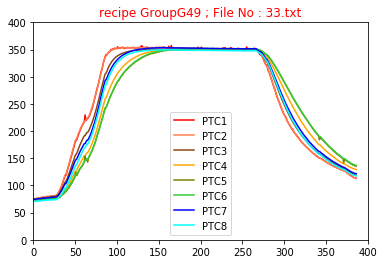

<Figure size 1600x1280 with 0 Axes>

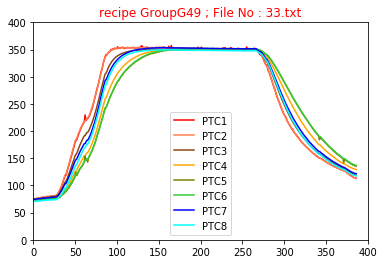

<Figure size 1600x1280 with 0 Axes>

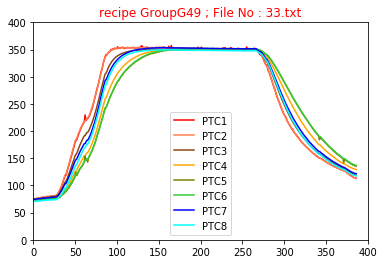

<Figure size 1600x1280 with 0 Axes>

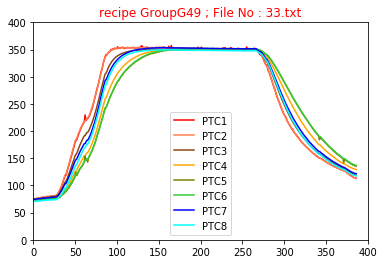

<Figure size 1600x1280 with 0 Axes>

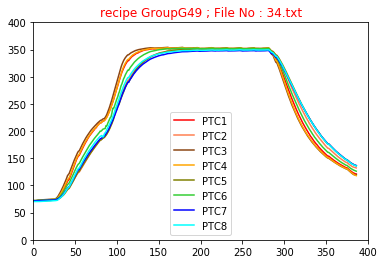

<Figure size 1600x1280 with 0 Axes>

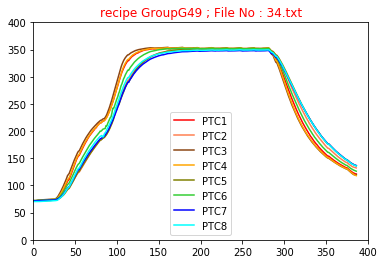

<Figure size 1600x1280 with 0 Axes>

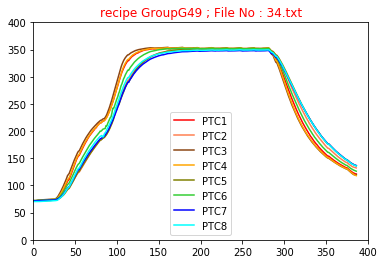

<Figure size 1600x1280 with 0 Axes>

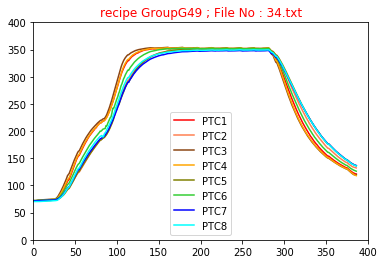

<Figure size 1600x1280 with 0 Axes>

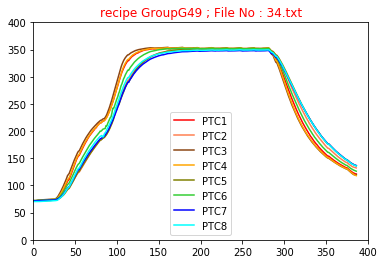

<Figure size 1600x1280 with 0 Axes>

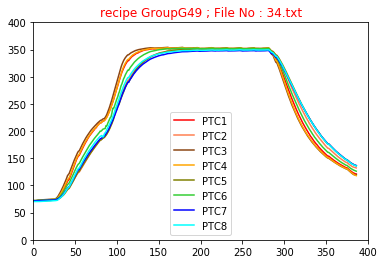

<Figure size 1600x1280 with 0 Axes>

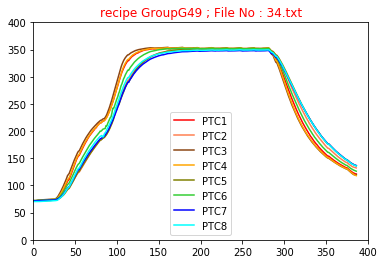

<Figure size 1600x1280 with 0 Axes>

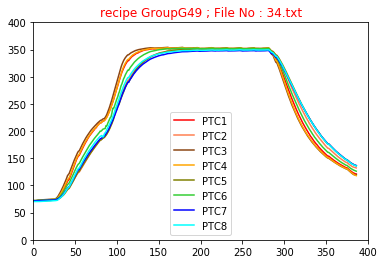

<Figure size 1600x1280 with 0 Axes>

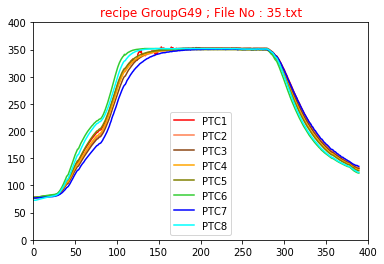

<Figure size 1600x1280 with 0 Axes>

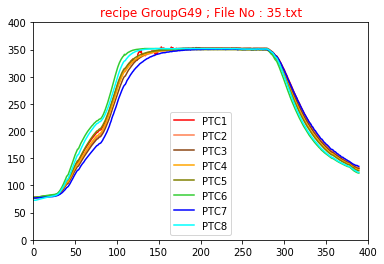

<Figure size 1600x1280 with 0 Axes>

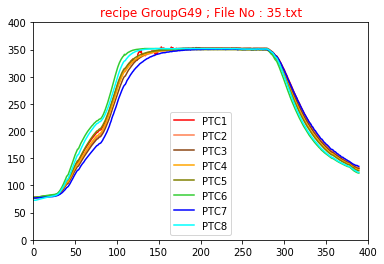

<Figure size 1600x1280 with 0 Axes>

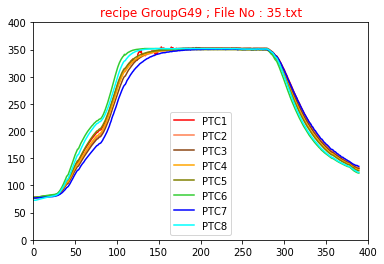

<Figure size 1600x1280 with 0 Axes>

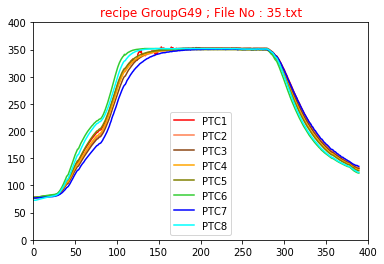

<Figure size 1600x1280 with 0 Axes>

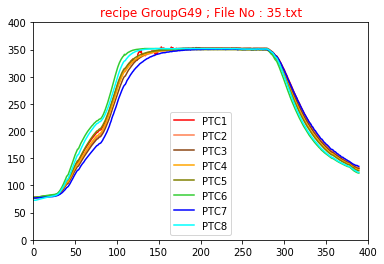

<Figure size 1600x1280 with 0 Axes>

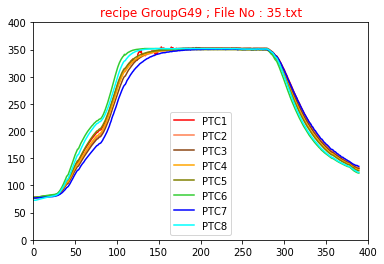

<Figure size 1600x1280 with 0 Axes>

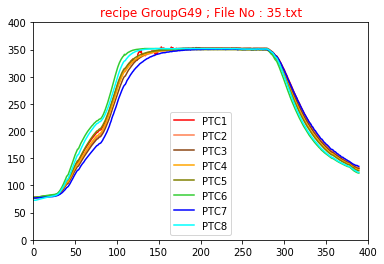

<Figure size 1600x1280 with 0 Axes>

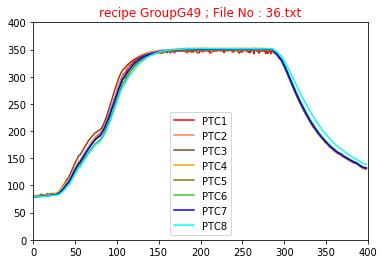

<Figure size 1600x1280 with 0 Axes>

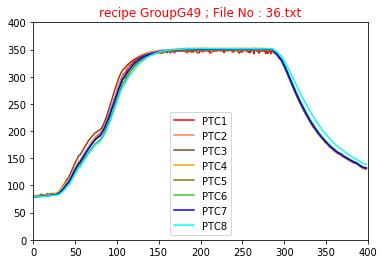

<Figure size 1600x1280 with 0 Axes>

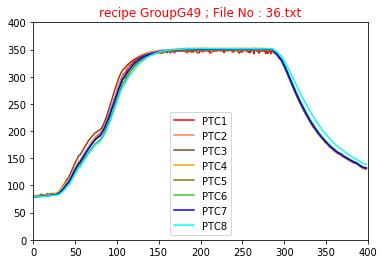

<Figure size 1600x1280 with 0 Axes>

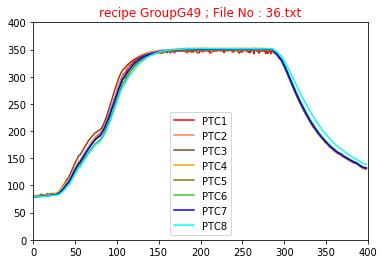

<Figure size 1600x1280 with 0 Axes>

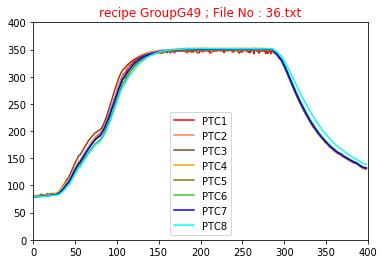

<Figure size 1600x1280 with 0 Axes>

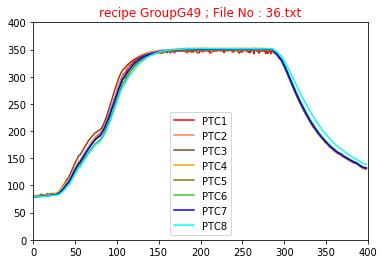

<Figure size 1600x1280 with 0 Axes>

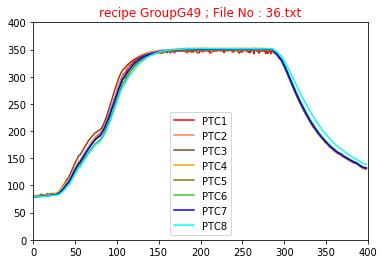

<Figure size 1600x1280 with 0 Axes>

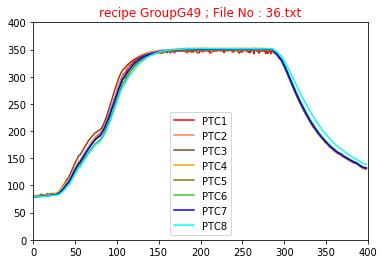

<Figure size 1600x1280 with 0 Axes>

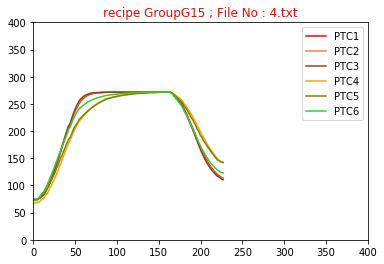

<Figure size 1600x1280 with 0 Axes>

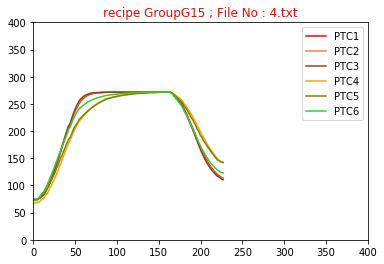

<Figure size 1600x1280 with 0 Axes>

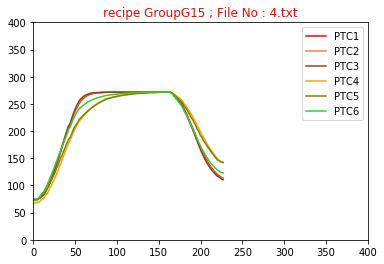

<Figure size 1600x1280 with 0 Axes>

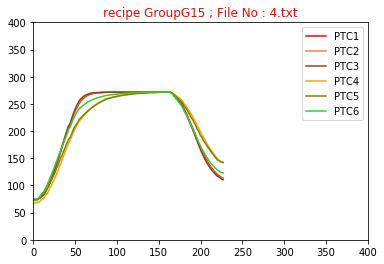

<Figure size 1600x1280 with 0 Axes>

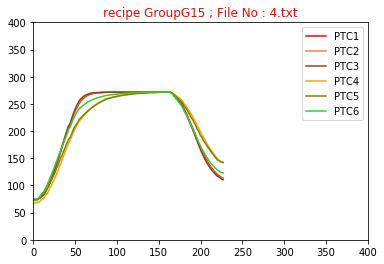

<Figure size 1600x1280 with 0 Axes>

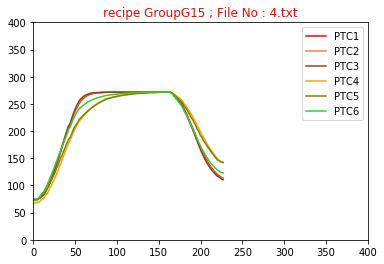

<Figure size 1600x1280 with 0 Axes>

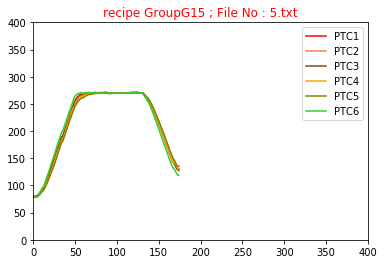

<Figure size 1600x1280 with 0 Axes>

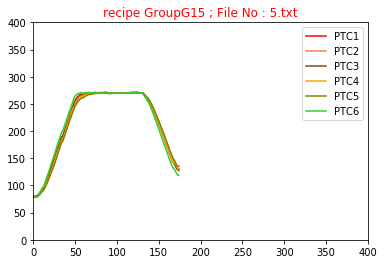

<Figure size 1600x1280 with 0 Axes>

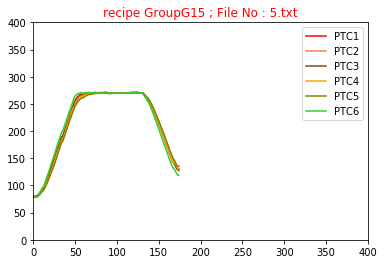

<Figure size 1600x1280 with 0 Axes>

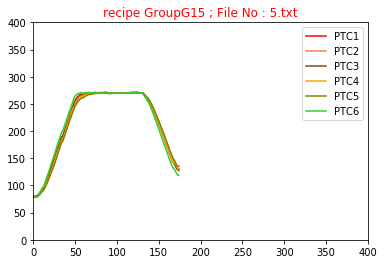

<Figure size 1600x1280 with 0 Axes>

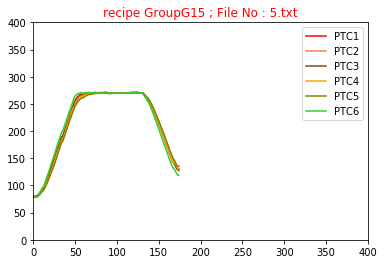

<Figure size 1600x1280 with 0 Axes>

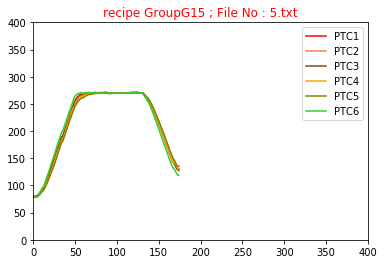

<Figure size 1600x1280 with 0 Axes>

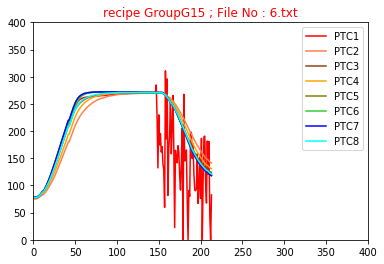

<Figure size 1600x1280 with 0 Axes>

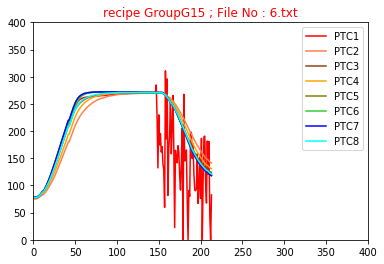

<Figure size 1600x1280 with 0 Axes>

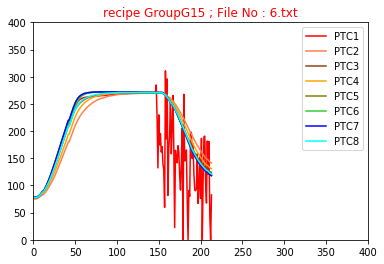

<Figure size 1600x1280 with 0 Axes>

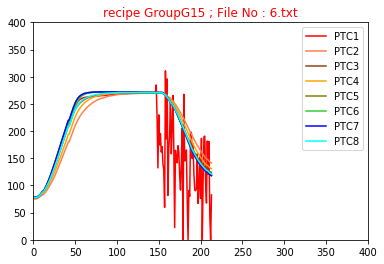

<Figure size 1600x1280 with 0 Axes>

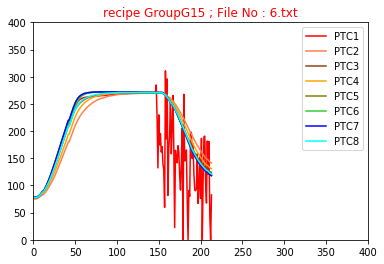

<Figure size 1600x1280 with 0 Axes>

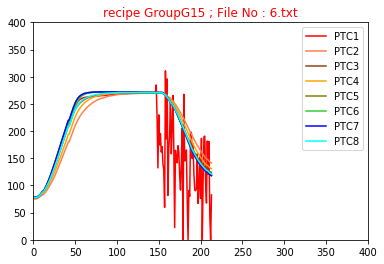

<Figure size 1600x1280 with 0 Axes>

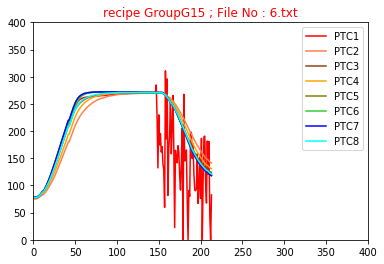

<Figure size 1600x1280 with 0 Axes>

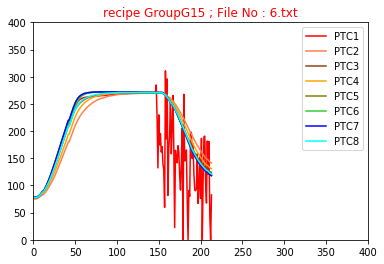

<Figure size 1600x1280 with 0 Axes>

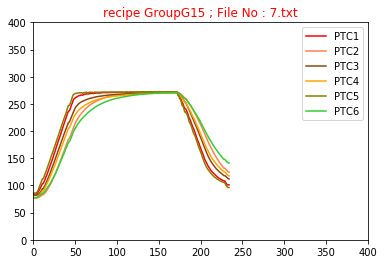

<Figure size 1600x1280 with 0 Axes>

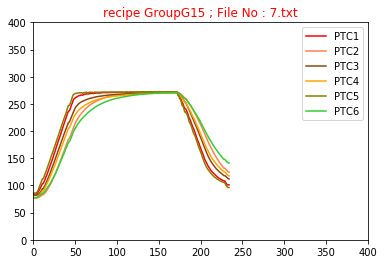

<Figure size 1600x1280 with 0 Axes>

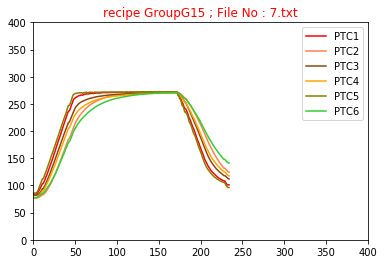

<Figure size 1600x1280 with 0 Axes>

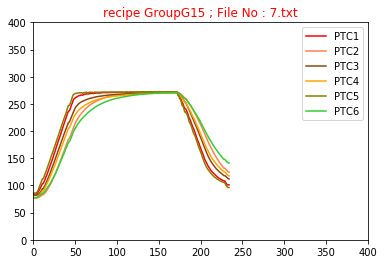

<Figure size 1600x1280 with 0 Axes>

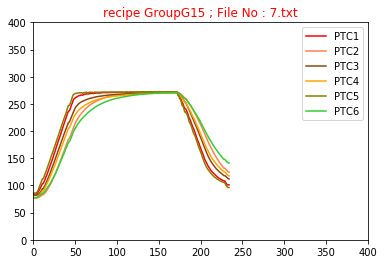

<Figure size 1600x1280 with 0 Axes>

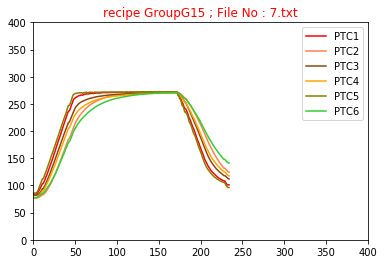

<Figure size 1600x1280 with 0 Axes>

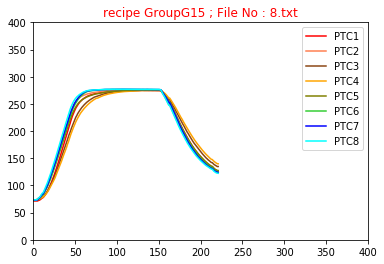

<Figure size 1600x1280 with 0 Axes>

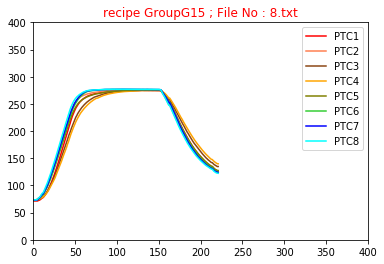

<Figure size 1600x1280 with 0 Axes>

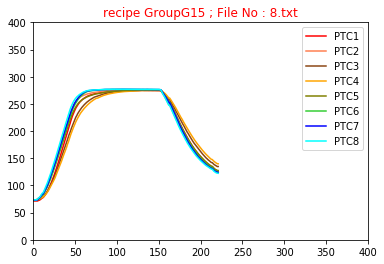

<Figure size 1600x1280 with 0 Axes>

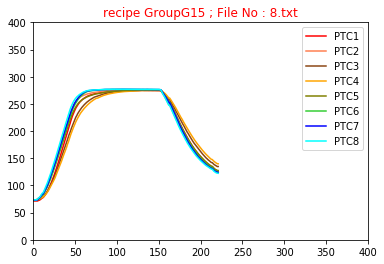

<Figure size 1600x1280 with 0 Axes>

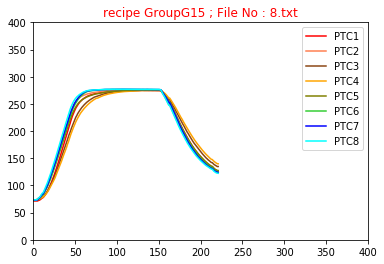

<Figure size 1600x1280 with 0 Axes>

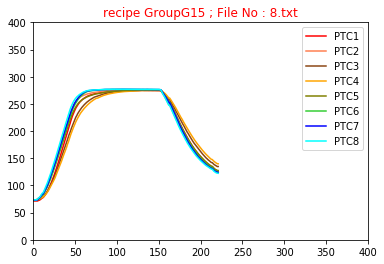

<Figure size 1600x1280 with 0 Axes>

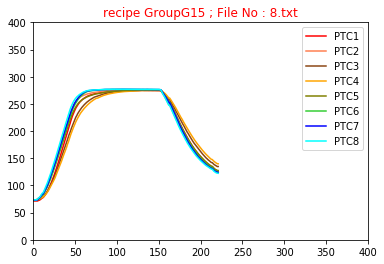

<Figure size 1600x1280 with 0 Axes>

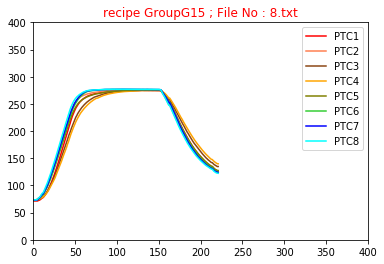

<Figure size 1600x1280 with 0 Axes>

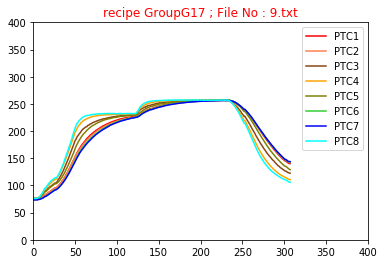

<Figure size 1600x1280 with 0 Axes>

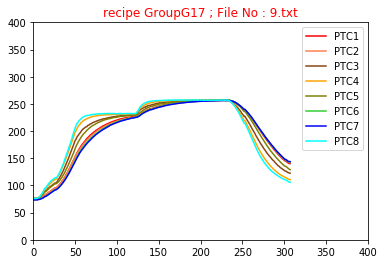

<Figure size 1600x1280 with 0 Axes>

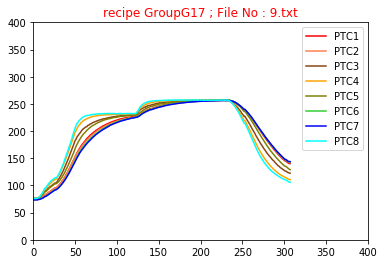

<Figure size 1600x1280 with 0 Axes>

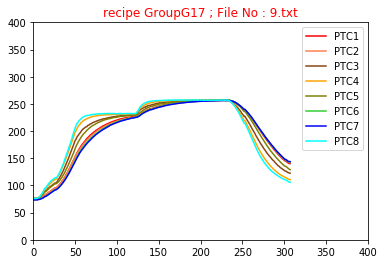

<Figure size 1600x1280 with 0 Axes>

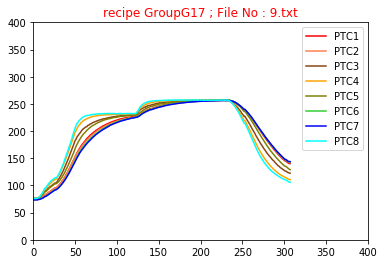

<Figure size 1600x1280 with 0 Axes>

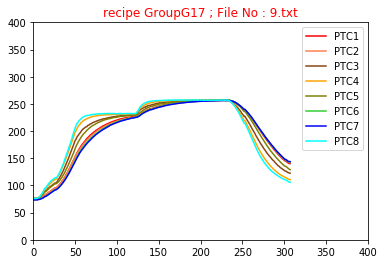

<Figure size 1600x1280 with 0 Axes>

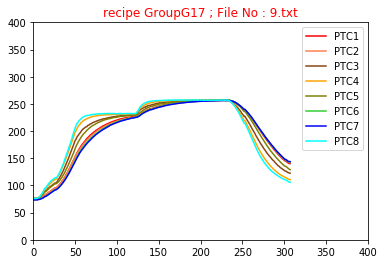

<Figure size 1600x1280 with 0 Axes>

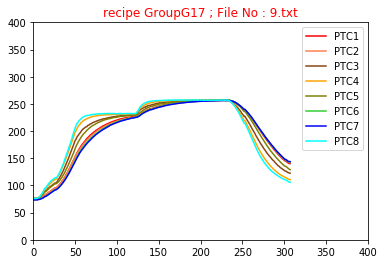

In [113]:
range = np.arange(len(exam_predicted))
  
for i in range:
    edf = readRecipeGroupFile(examFilePath + examdf.at[i,'filename'])
    plotRecipeGroupFileCurve(edf, exam_predicted[i], examdf.at[i,'filename'])